# Librairies

In [2]:
# Basic librairies (all the librairies used for the machine learning are imported in the tools.py file)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Data importation
data = pd.read_sas("datas/total_red.sas7bdat")
# Useful to plot the model 
index = data.set_index('TRIMESTRE').index.unique()

In [3]:
from DreamLib.linear_models import *
from DreamLib.processing_datas import *
import datas.selected_columns_12 as cl

# Models Formulas


## Linear Regression
LinearRegression fits a linear model with coefficients $w = (w_1, ..., w_p)$ to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation. Mathematically it solves a problem of the form:

$$
\underset{\omega}{\text{min}}||X{\omega}-y||_{2}^{2}
$$

## Ridge Regression
Ridge regression addresses some of the problems of Ordinary Least Squares by imposing a penalty on the size of the coefficients. The ridge coefficients minimize a penalized residual sum of squares:
$$\min_{w} || X w - y||_2^2 + \alpha ||w||_2^2$$

The complexity parameter 
α
≥
0
 controls the amount of shrinkage: the larger the value of $\alpha>0$, the greater the amount of shrinkage and thus the coefficients become more robust to collinearity.

## Lasso
The Lasso is a linear model that estimates sparse coefficients. It is useful in some contexts due to its tendency to prefer solutions with fewer non-zero coefficients, effectively reducing the number of features upon which the given solution is dependent. For this reason, Lasso and its variants are fundamental to the field of compressed sensing. Under certain conditions, it can recover the exact set of non-zero coefficients.

Mathematically, it consists of a linear model with an added regularization term. The objective function to minimize is:

$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha ||w||_1}$$

## Elastic Net
ElasticNet is a linear regression model trained with both $\ell_1$ and $\ell_2$-norm regularization of the coefficients. This combination allows for learning a sparse model where few of the weights are non-zero like Lasso, while still maintaining the regularization properties of Ridge. We control the convex combination of $\ell_1$ and $\ell_2$ using the l1_ratio parameter.

Elastic-net is useful when there are multiple features that are correlated with one another. Lasso is likely to pick one of these at random, while elastic-net is likely to pick both.

A practical advantage of trading-off between Lasso and Ridge is that it allows Elastic-Net to inherit some of Ridge’s stability under rotation.

The objective function to minimize is in this case:
$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha \rho ||w||_1 +
\frac{\alpha(1-\rho)}{2} ||w||_2 ^ 2}$$

The class ElasticNetCV can be used to set the parameters alpha ($\alpha$) and l1_ratio ($\rho$) by cross-validation.

# Focus on Chronique CHR2

In [44]:
chronique=b'CHR2'
start = 1
norm = "MinMax"
split = 0.2
period = 12
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train,X_test], axis=1).index

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

### Correlation Features

In [14]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.000142,2.013715e-08,0.000128,0.358462
KNeighborsRegressor,0.000181,3.293333e-08,0.000153,-0.049204
LinearSVR,0.000192,3.667444e-08,0.000158,-0.168389
LinearRegression,0.000195,3.821233e-08,0.000168,-0.217384
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
CatBoostRegressor,0.000280,7.837635e-08,0.000252,-1.496946
DecisionTreeRegressor,0.000287,8.208333e-08,0.000258,-1.615044


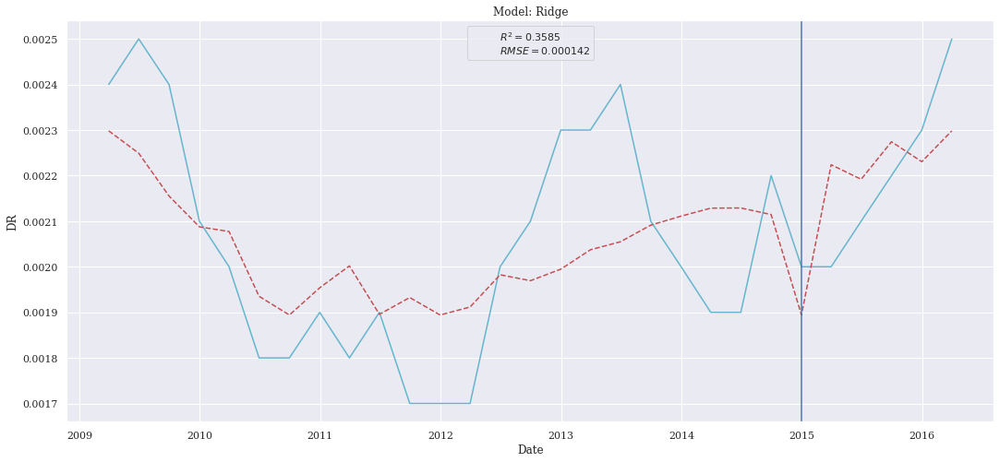

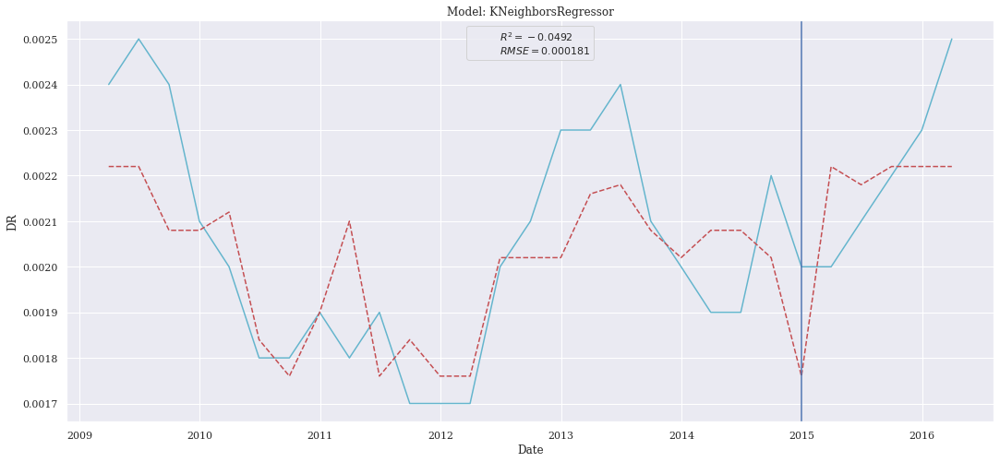

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


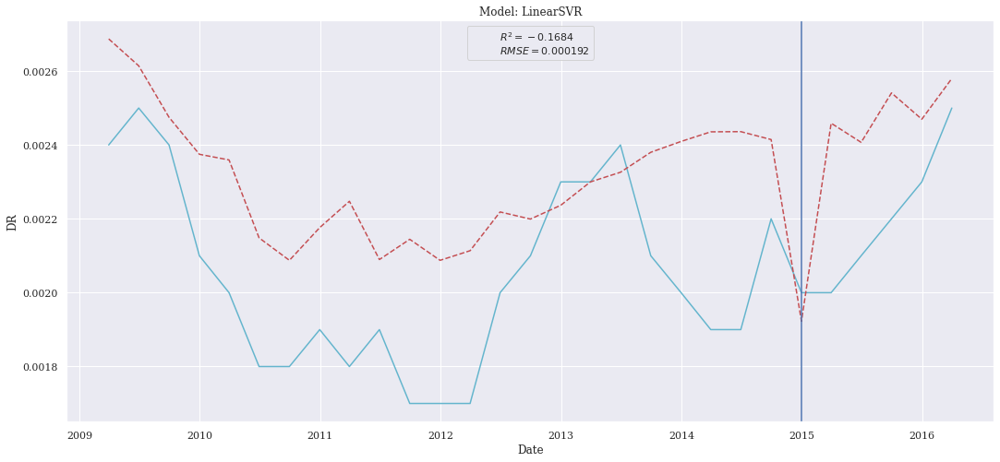

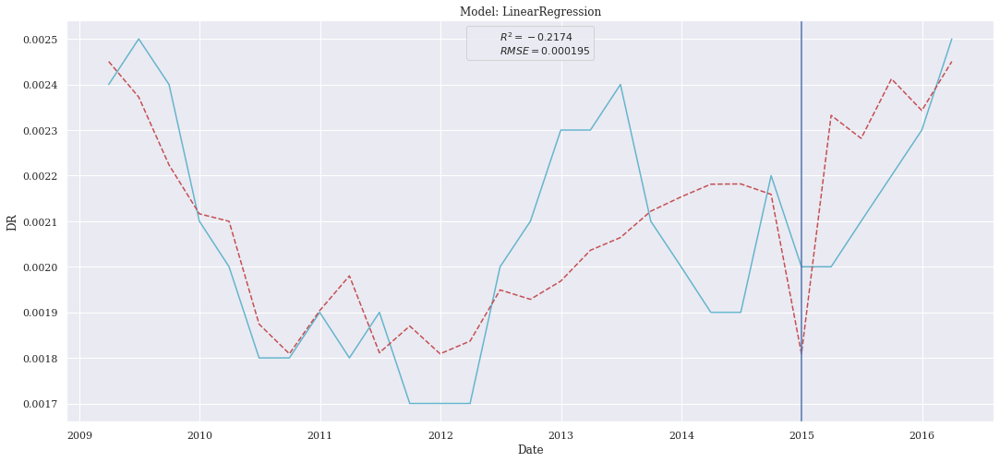

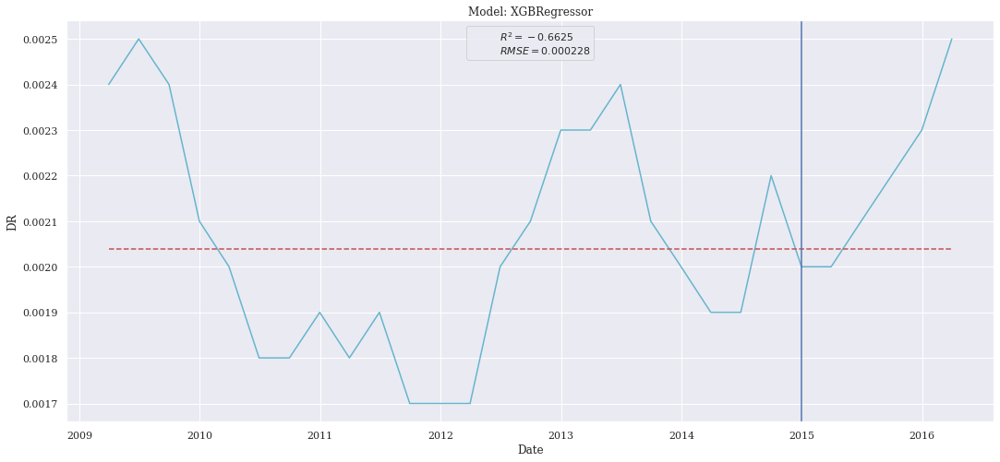

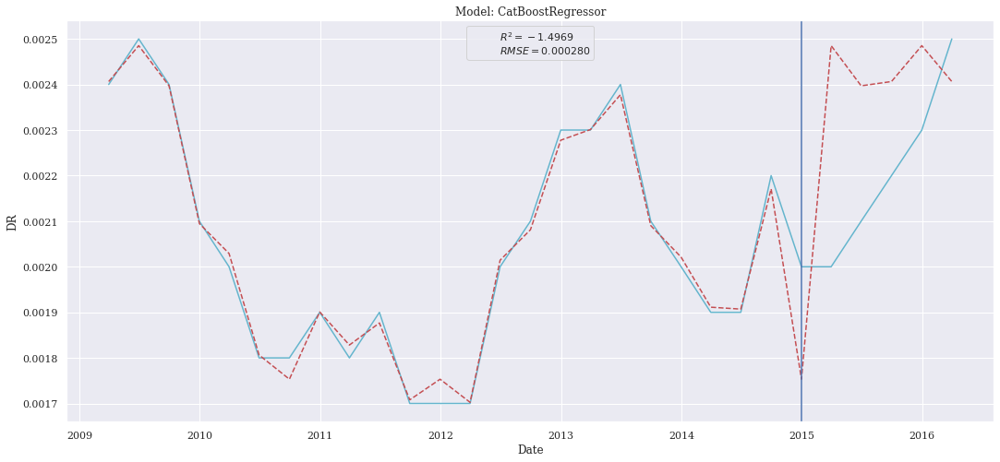

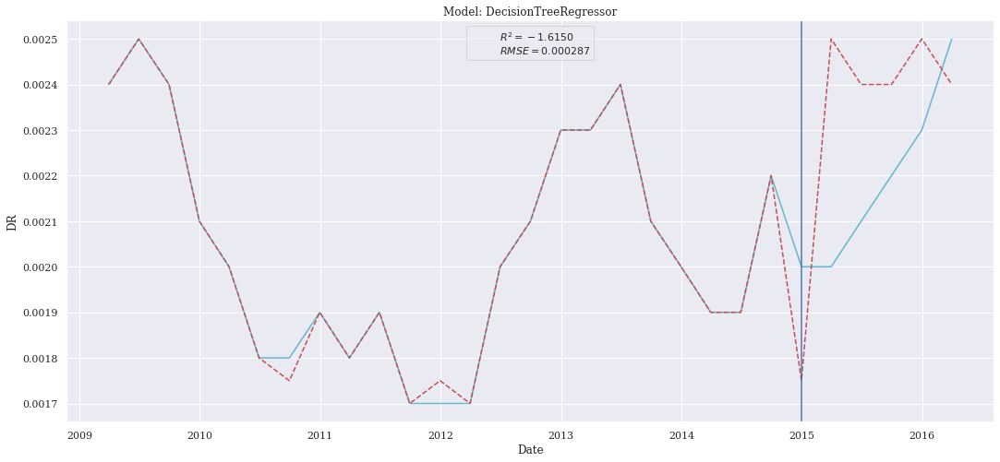

In [15]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [16]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period, chronique,col_used=cl.col_2_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000224,5.018373e-08,0.000183,-0.598774
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
KNeighborsRegressor,0.000303,9.166667e-08,0.000277,-1.920354
Ridge,0.000303,9.201623e-08,0.000240,-1.931491
LinearRegression,0.000321,1.031490e-07,0.000291,-2.286164
DecisionTreeRegressor,0.000344,1.183333e-07,0.000317,-2.769912
LinearSVR,0.000444,1.968100e-07,0.000346,-5.270052


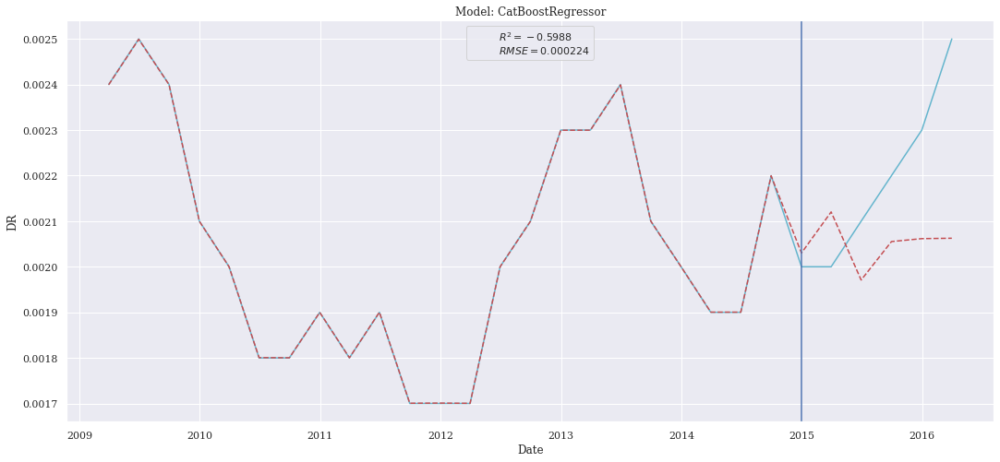

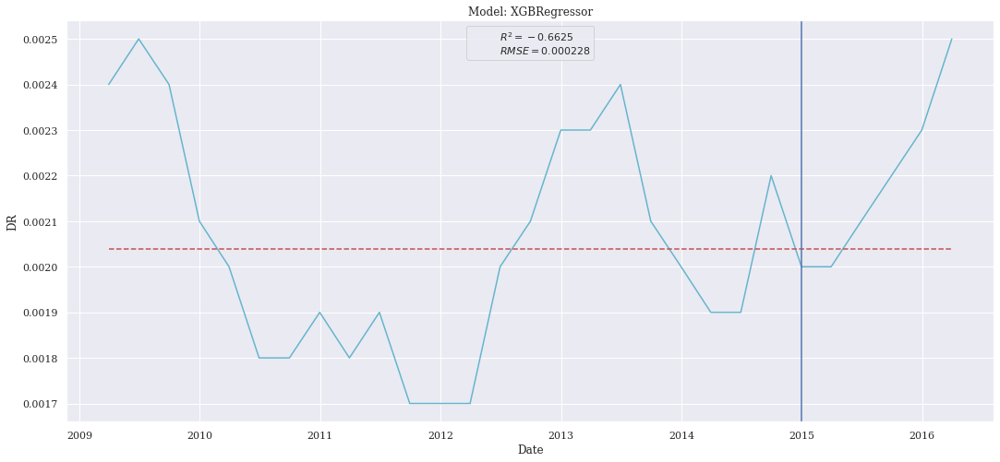

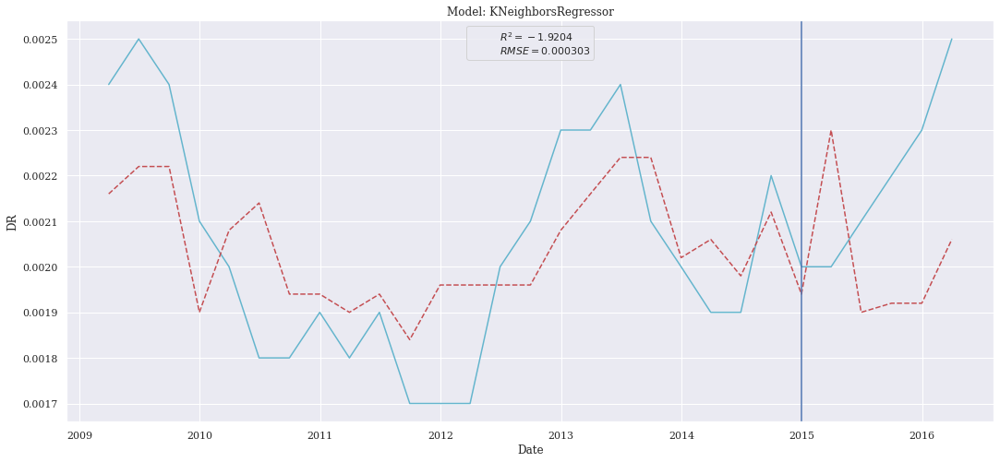

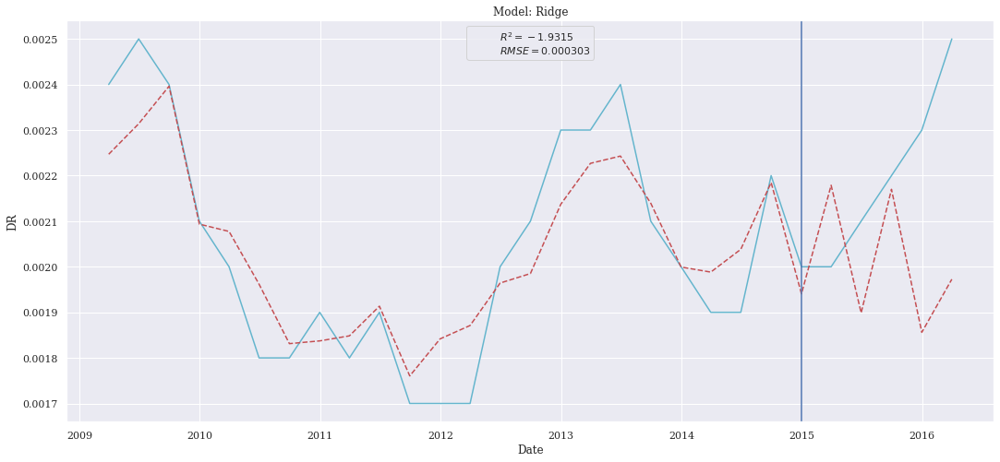

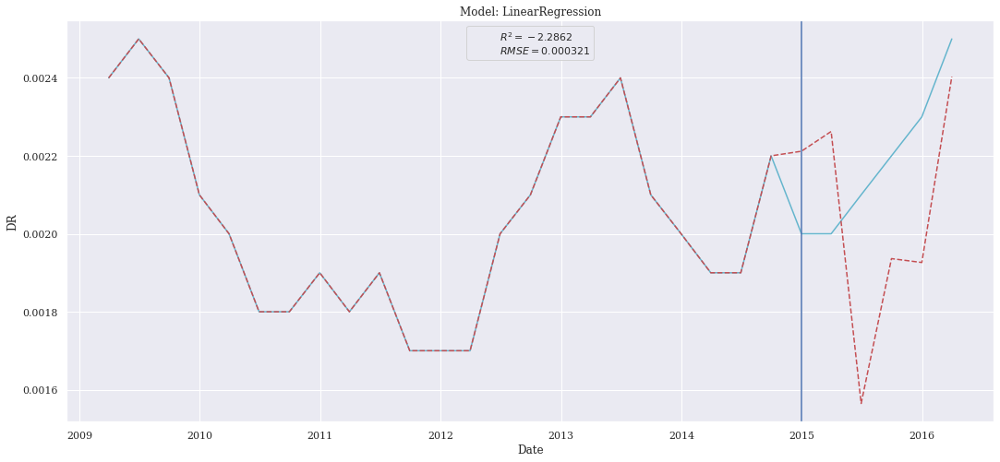

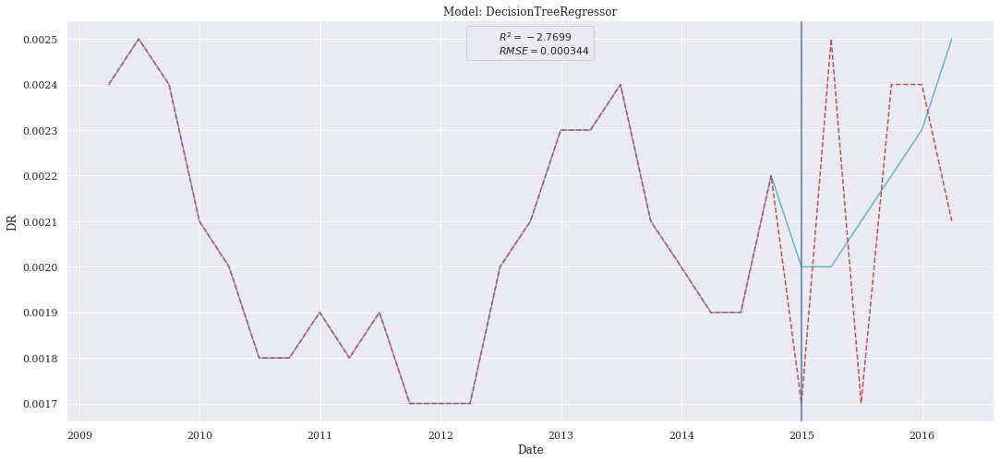

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


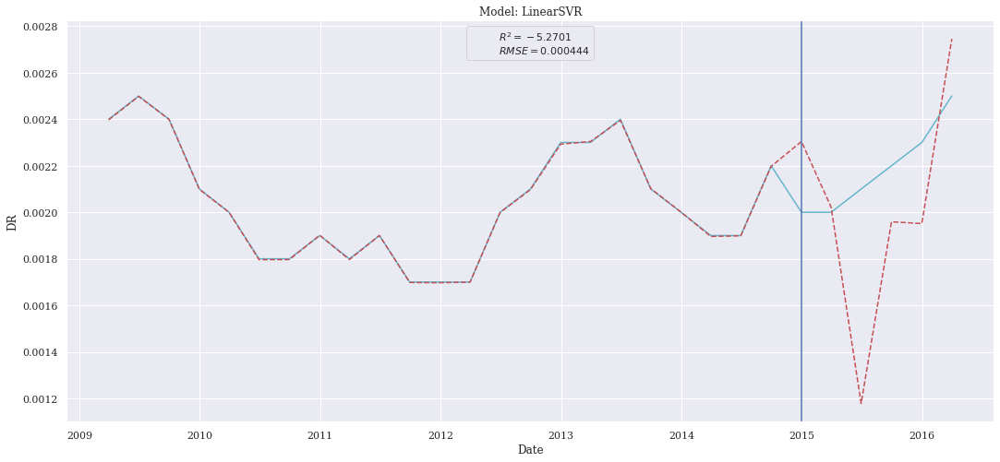

In [17]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [18]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period, chronique,col_used=cl.col_2_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
CatBoostRegressor,0.000242,5.843179e-08,0.000192,-0.861544
Ridge,0.000286,8.198828e-08,0.000240,-1.612016
KNeighborsRegressor,0.000325,1.058667e-07,0.000253,-2.372743
DecisionTreeRegressor,0.000383,1.466667e-07,0.000300,-3.672566
LinearSVR,0.000474,2.242316e-07,0.000420,-6.143661
LinearRegression,0.002775,7.703207e-06,0.002551,-244.411900


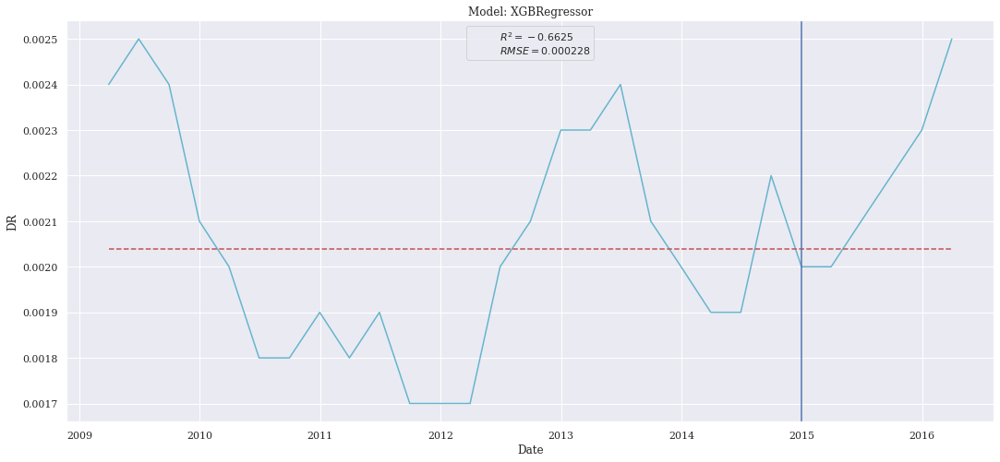

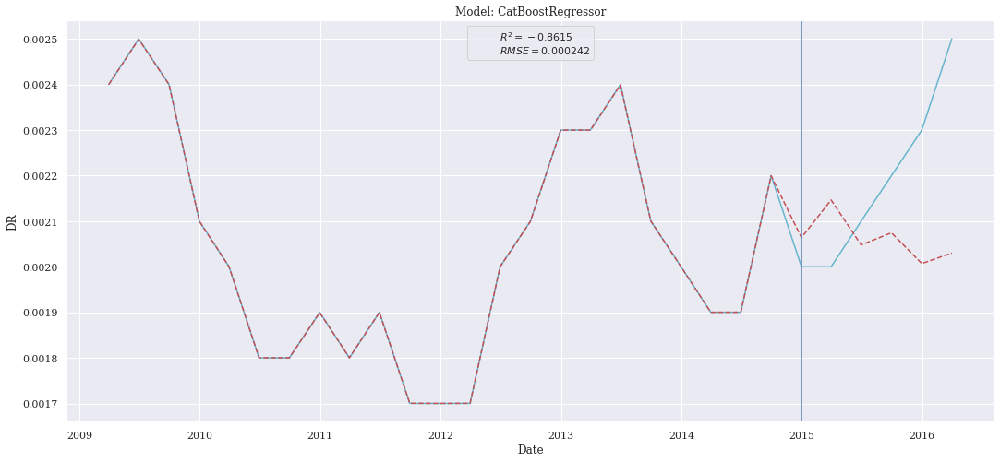

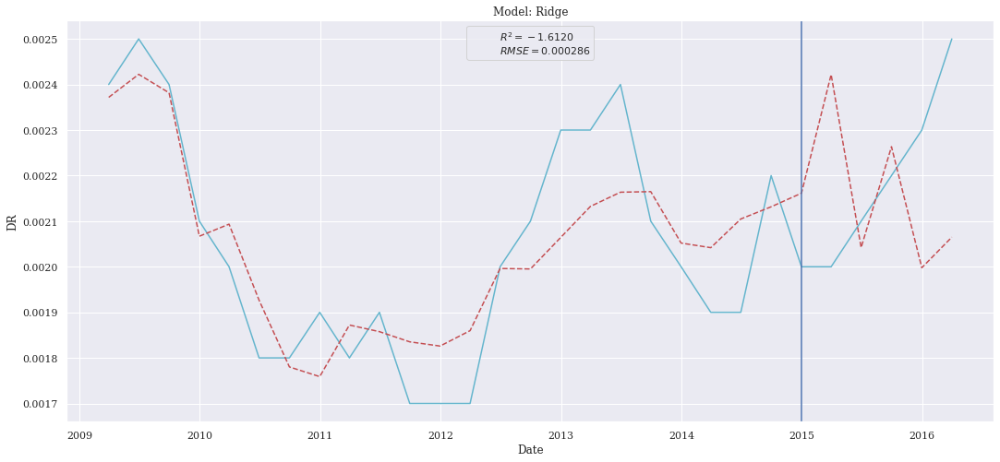

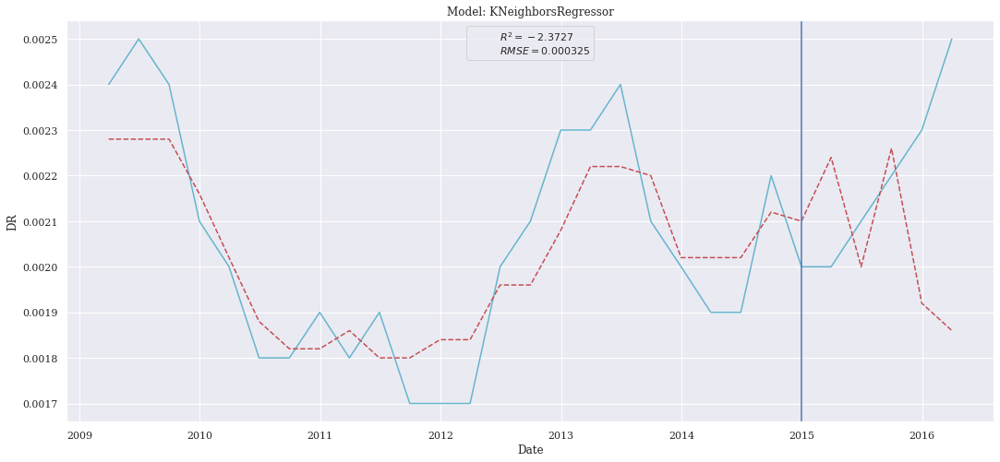

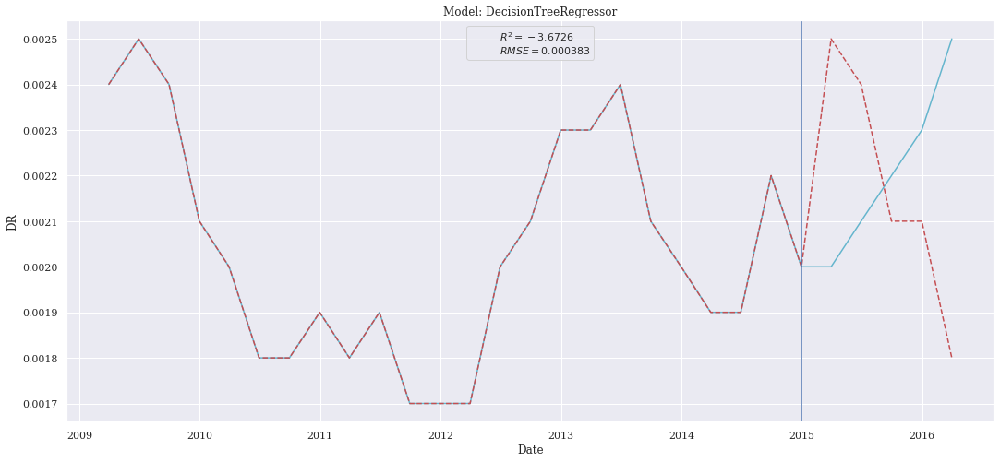

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


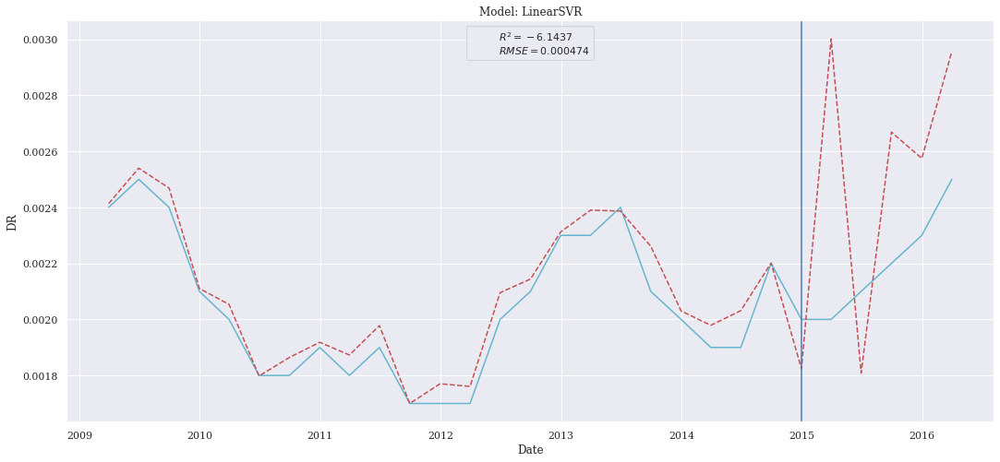

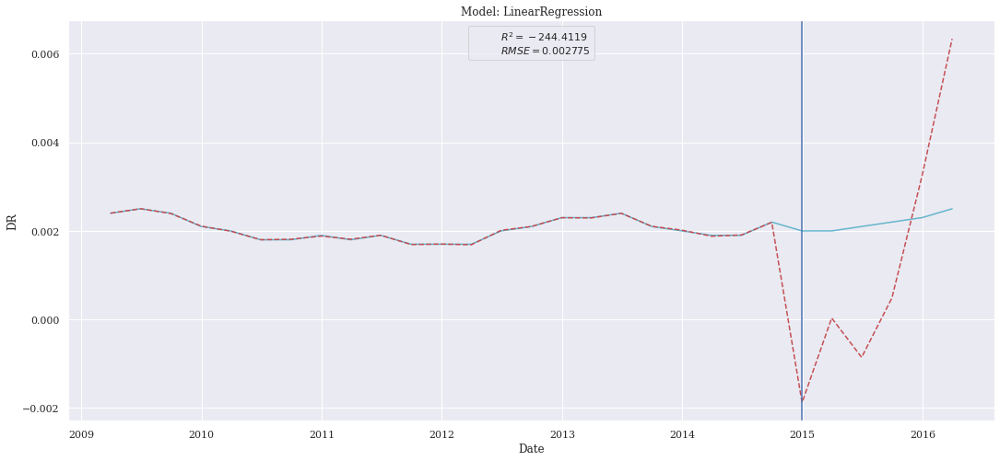

In [19]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [20]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_2_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
CatBoostRegressor,0.000234,5.477492e-08,0.000194,-0.745042
KNeighborsRegressor,0.000330,1.088000e-07,0.000280,-2.466195
Ridge,0.000332,1.099654e-07,0.000288,-2.503322
DecisionTreeRegressor,0.000344,1.183333e-07,0.000317,-2.769912
LinearRegression,0.000614,3.775002e-07,0.000472,-11.026554
LinearSVR,0.001081,1.169584e-06,0.000898,-36.261097


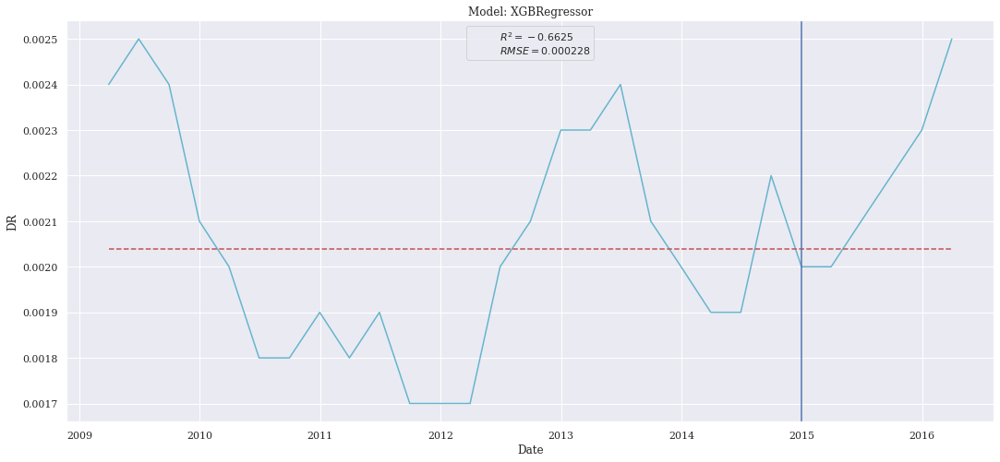

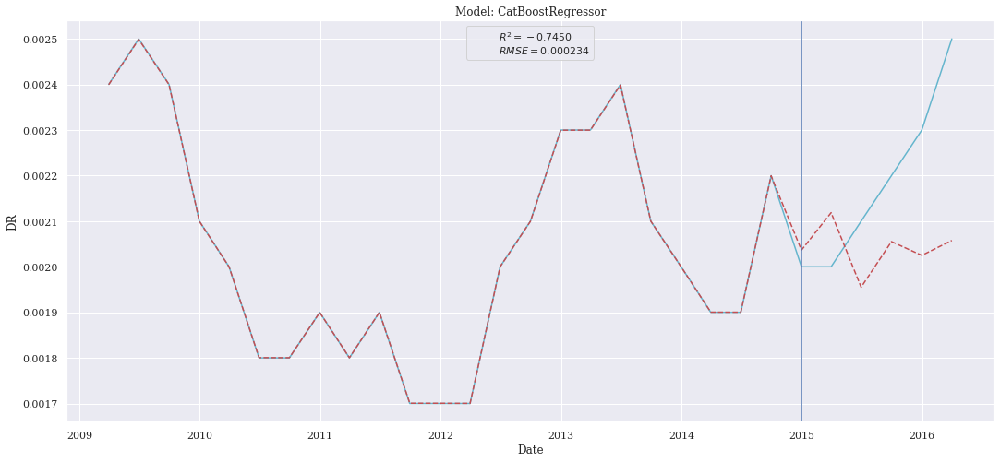

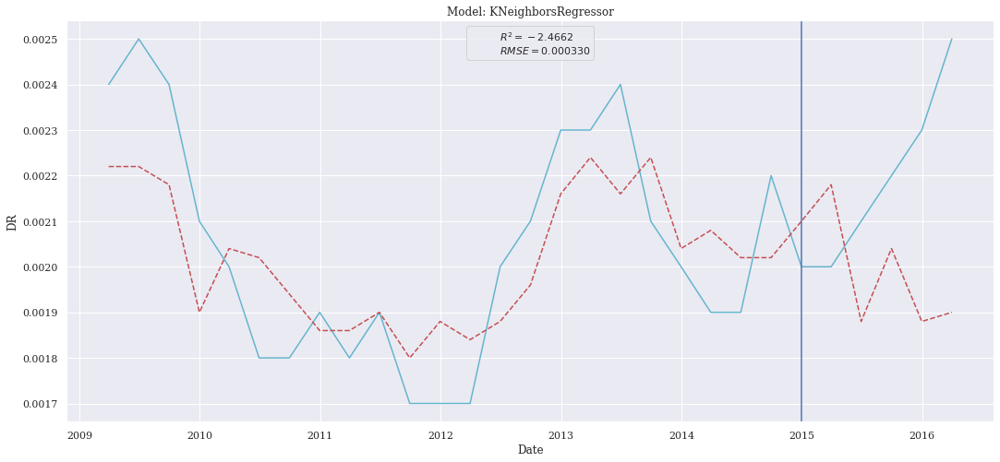

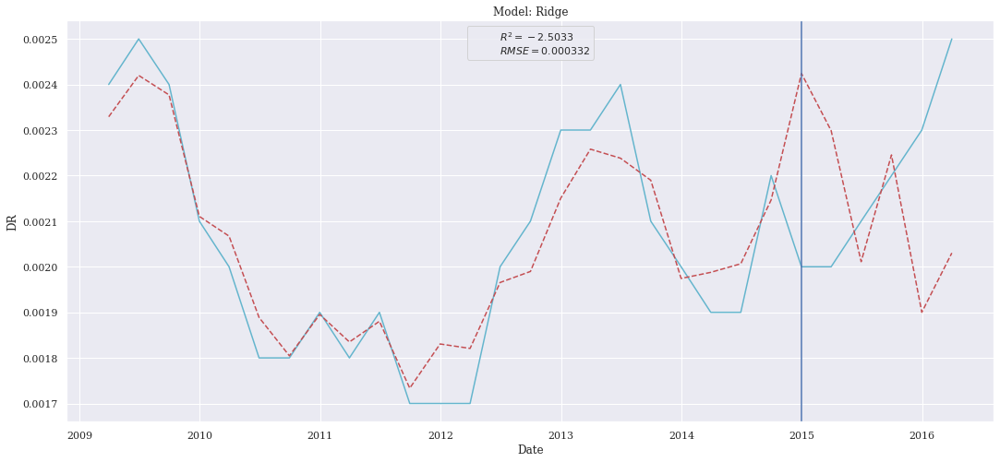

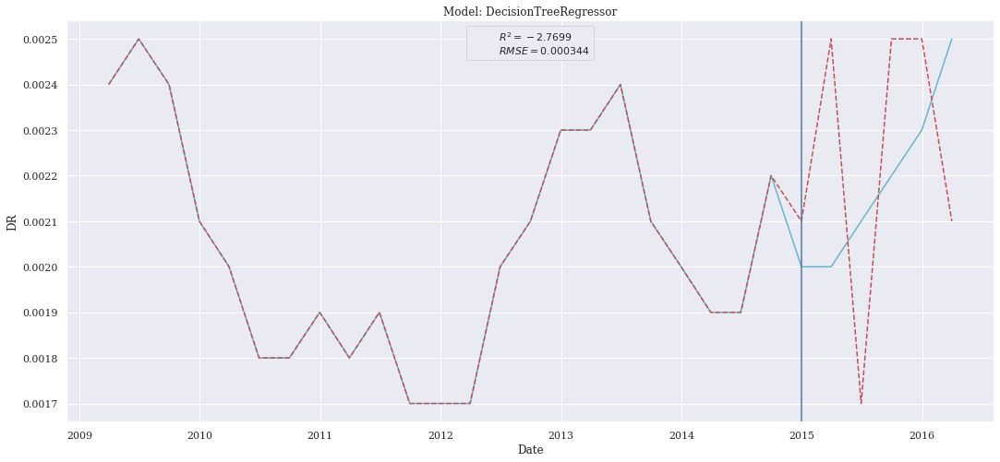

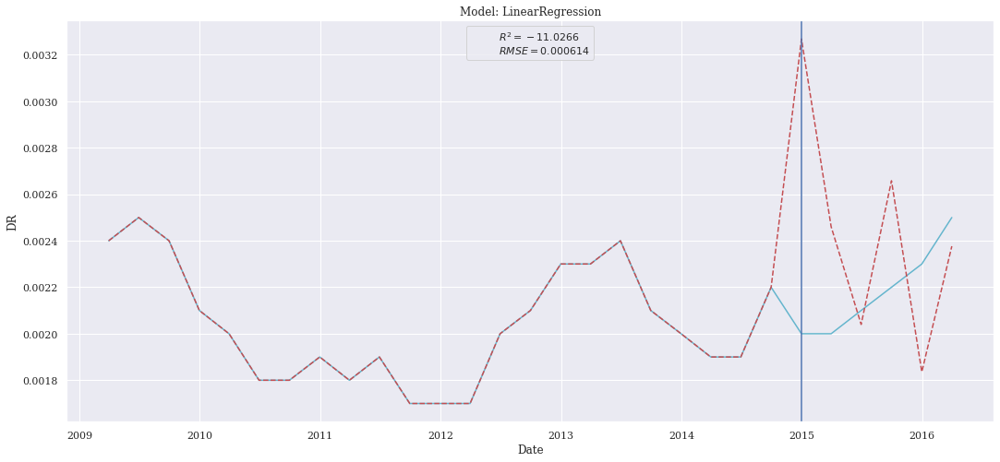

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


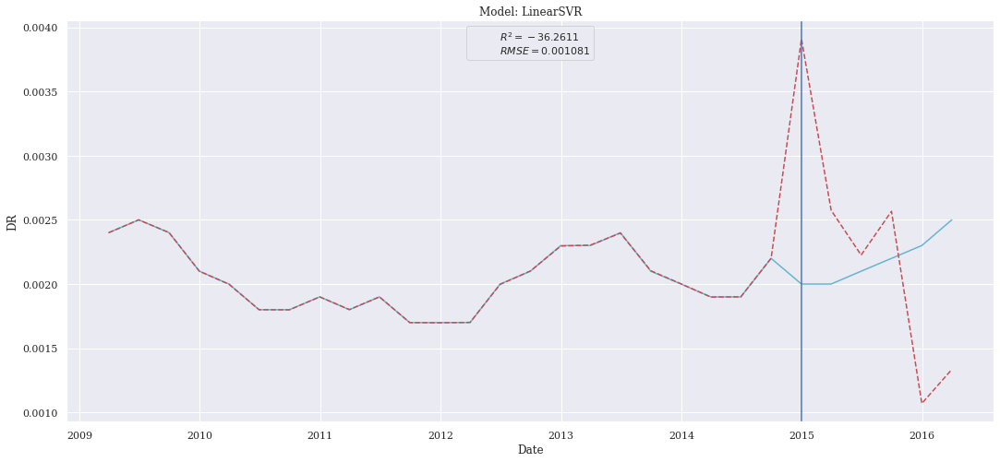

In [21]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [22]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period,chronique,col_used=cl.col_2_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
DecisionTreeRegressor,0.000235,5.500000e-08,0.000183,-0.752212
CatBoostRegressor,0.000237,5.604244e-08,0.000194,-0.785423
Ridge,0.000279,7.756761e-08,0.000241,-1.471181
KNeighborsRegressor,0.000296,8.766667e-08,0.000250,-1.792920
LinearSVR,0.000506,2.557459e-07,0.000361,-7.147657
LinearRegression,0.000524,2.748988e-07,0.000412,-7.757839


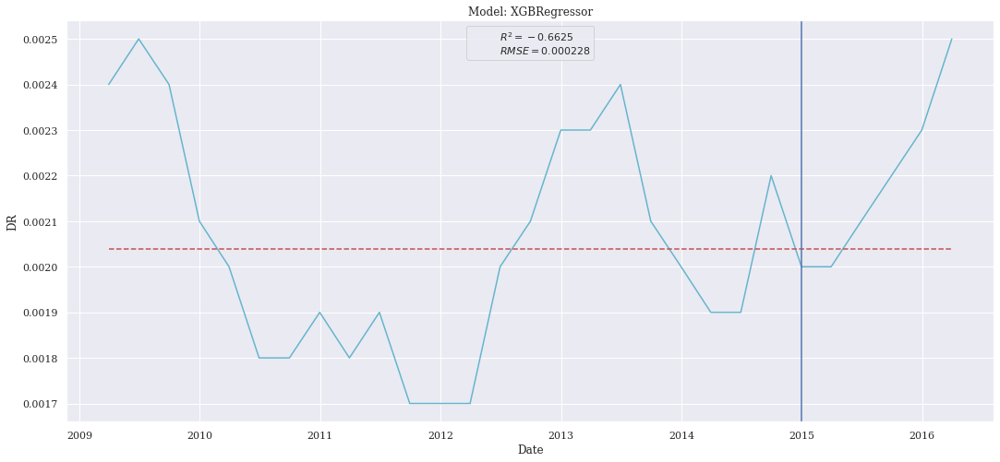

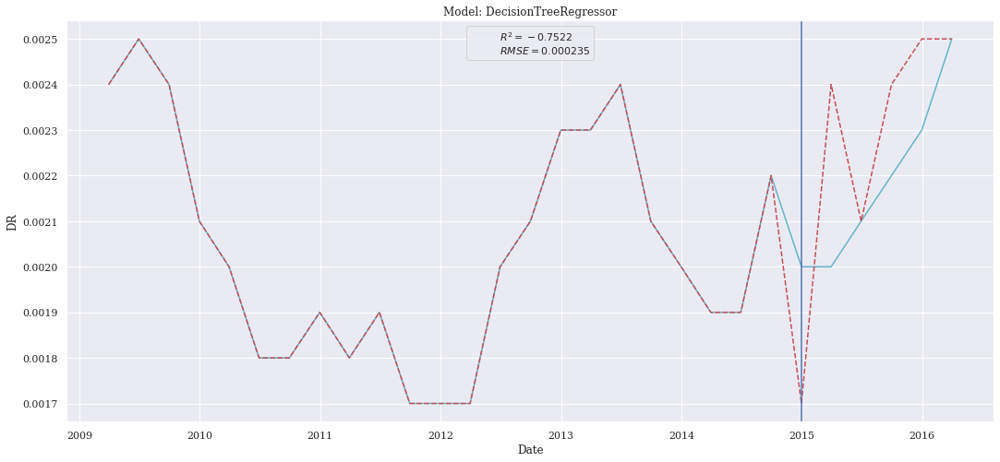

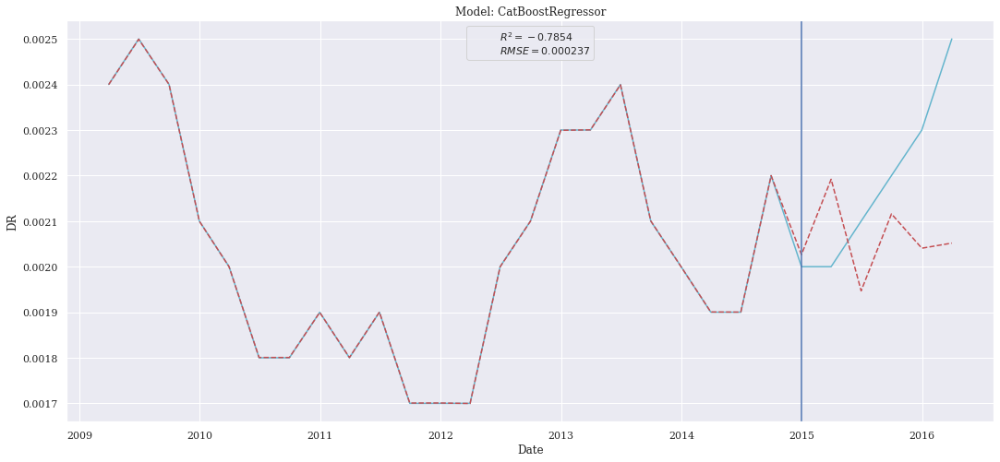

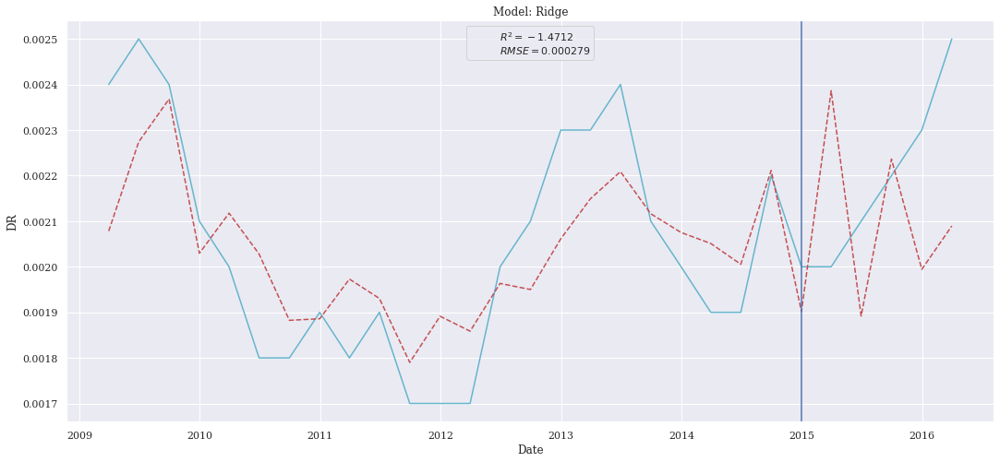

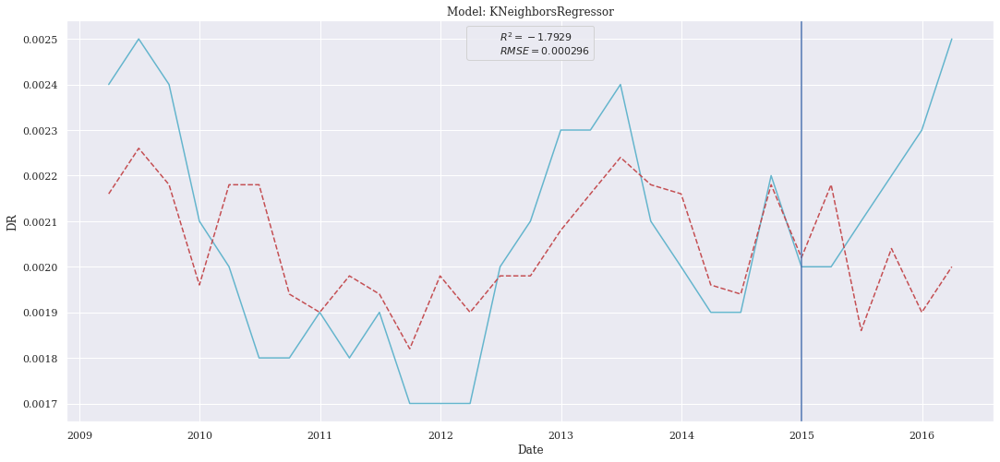

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


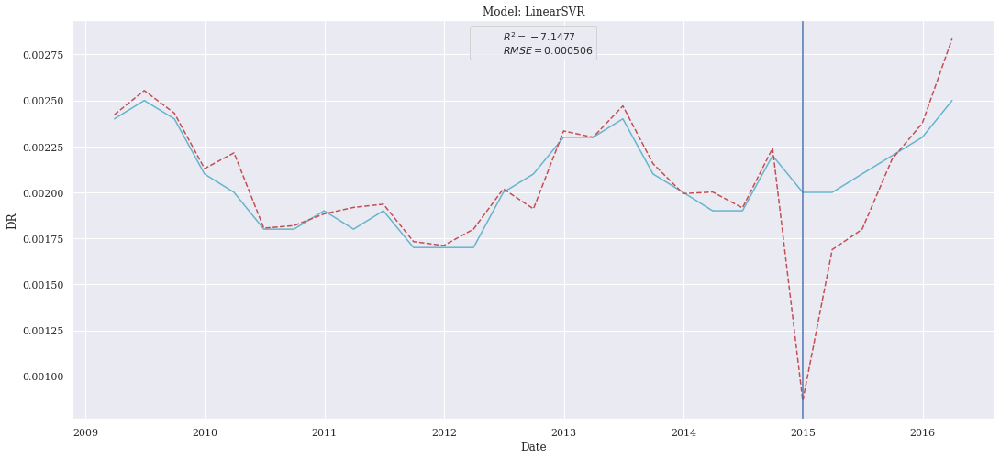

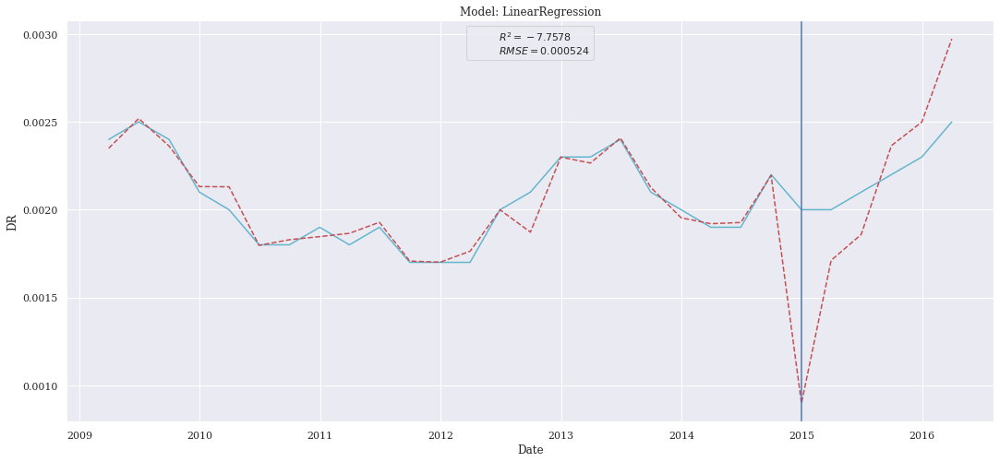

In [23]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [24]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_2_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000228,5.206365e-08,0.000172,-0.658665
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
Ridge,0.000270,7.276867e-08,0.000227,-1.318294
DecisionTreeRegressor,0.000349,1.216667e-07,0.000317,-2.876106
KNeighborsRegressor,0.000356,1.266000e-07,0.000303,-3.033274
LinearSVR,0.000923,8.513933e-07,0.000725,-26.124033
LinearRegression,0.002331,5.432881e-06,0.002232,-172.082942


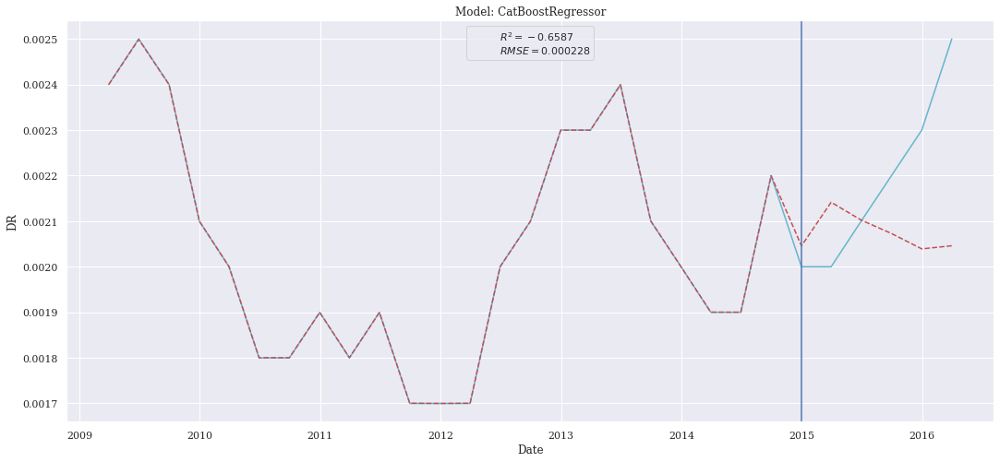

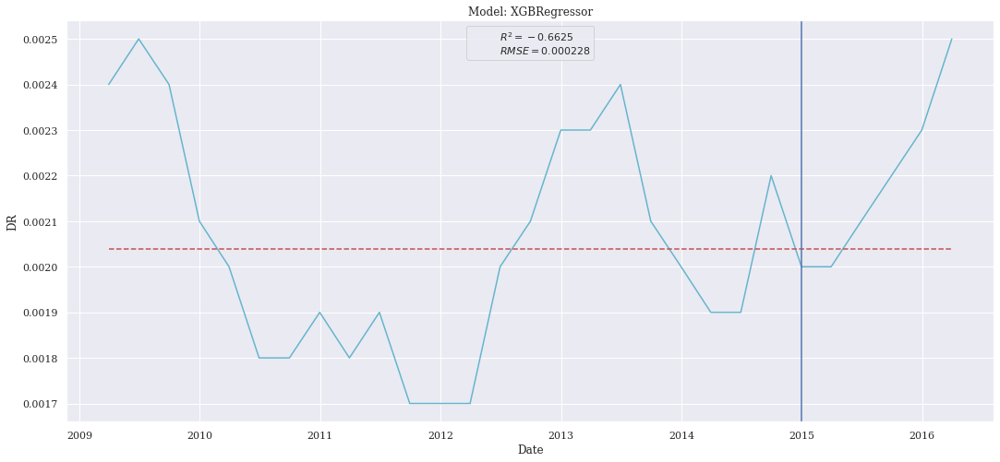

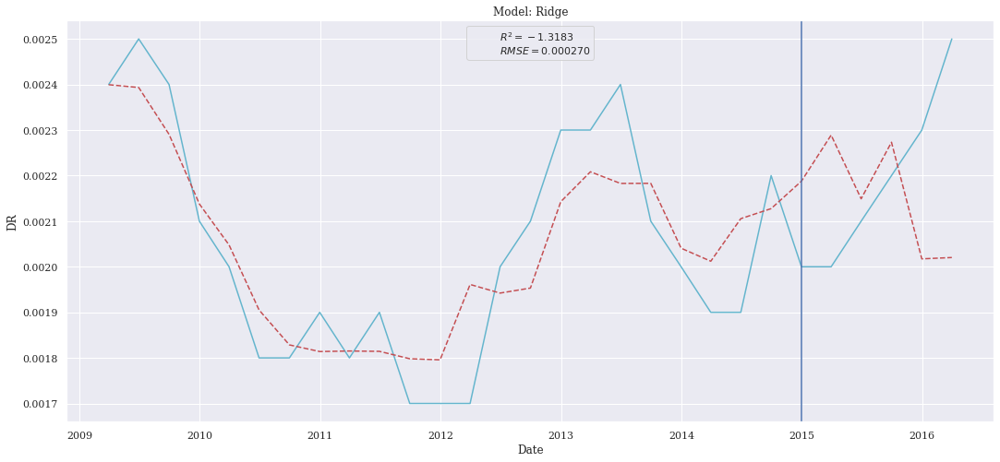

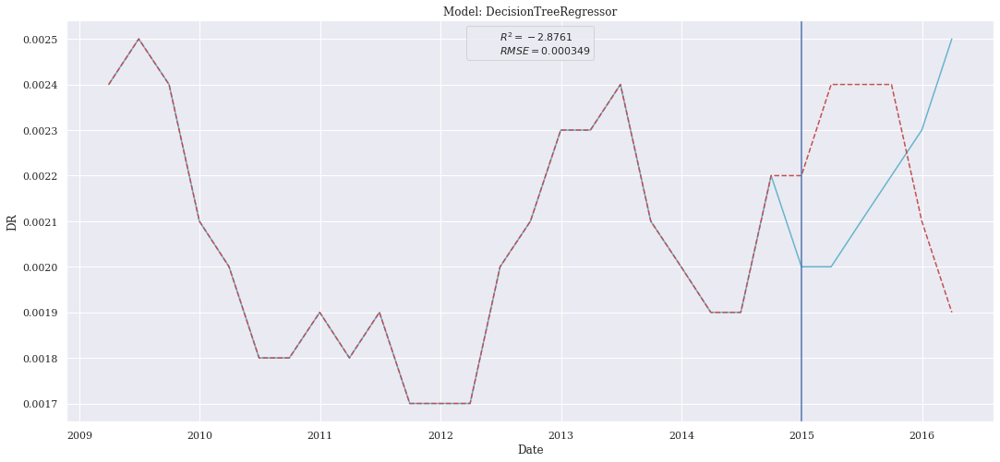

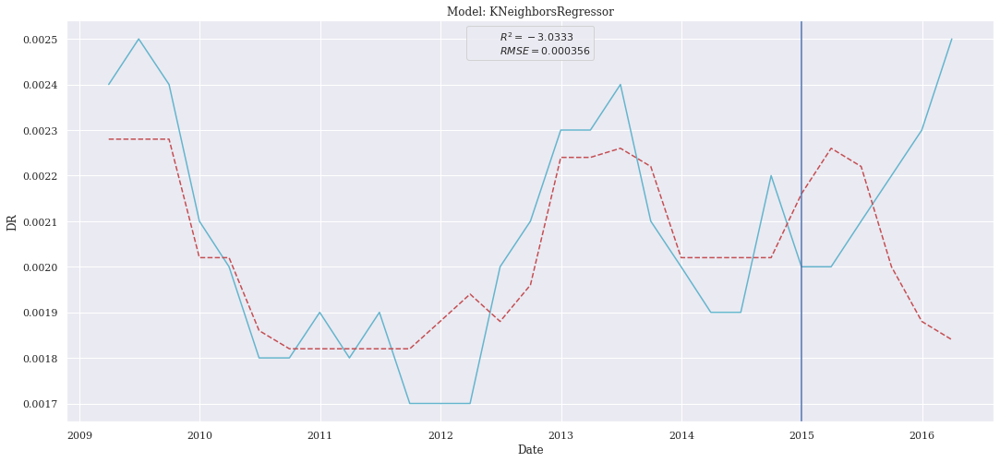

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


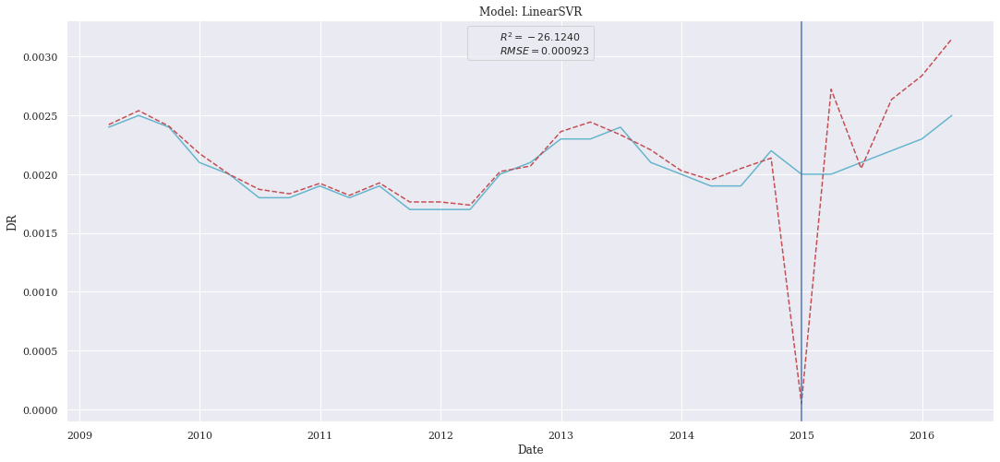

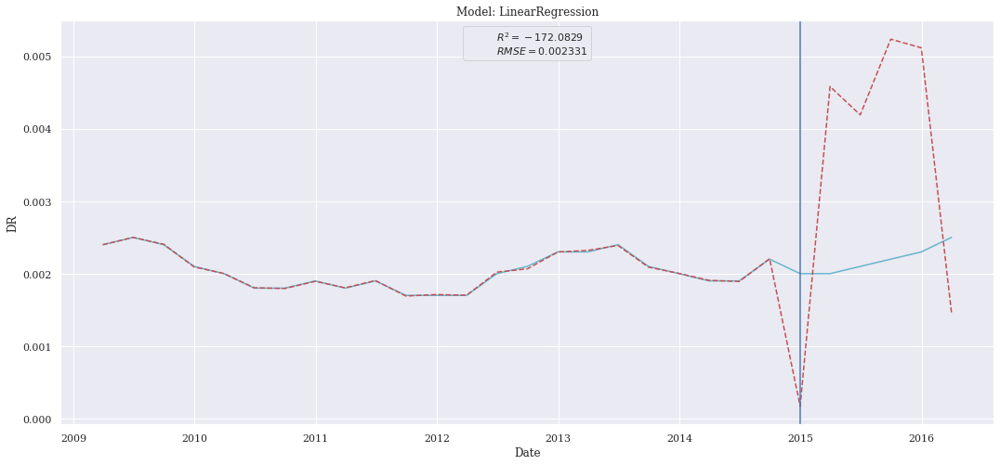

In [25]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [26]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_2_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.000108,1.176648e-08,0.000096,0.625139
LinearRegression,0.000139,1.938276e-08,0.000113,0.382496
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
CatBoostRegressor,0.000261,6.786167e-08,0.000206,-1.161965
Ridge,0.000284,8.049087e-08,0.000233,-1.564311
KNeighborsRegressor,0.000310,9.613333e-08,0.000253,-2.062655
DecisionTreeRegressor,0.000410,1.683333e-07,0.000317,-4.362832


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


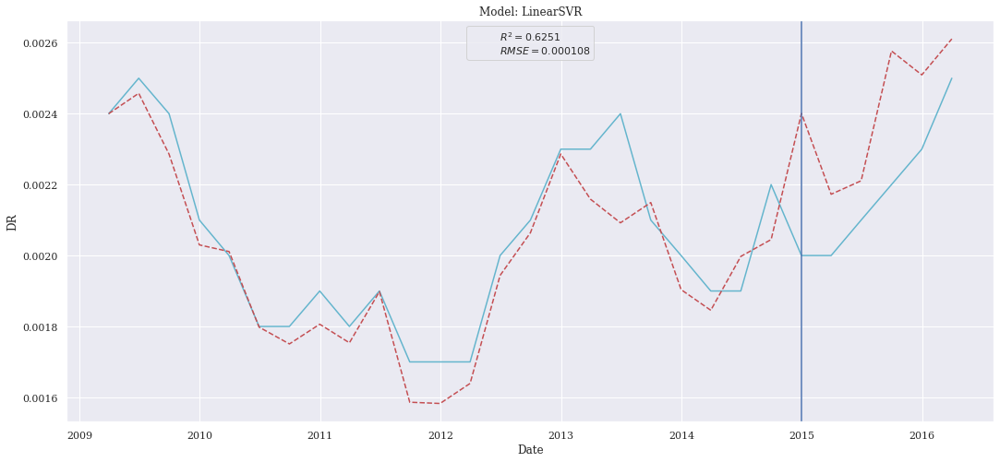

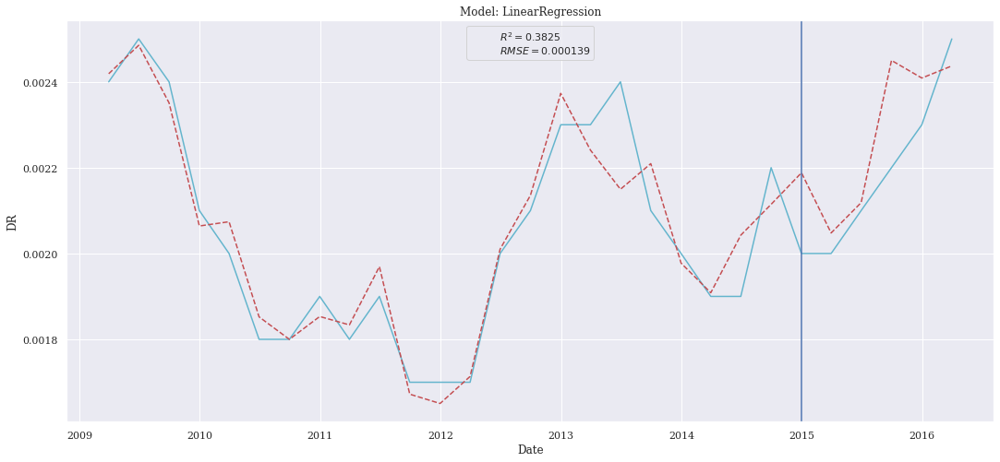

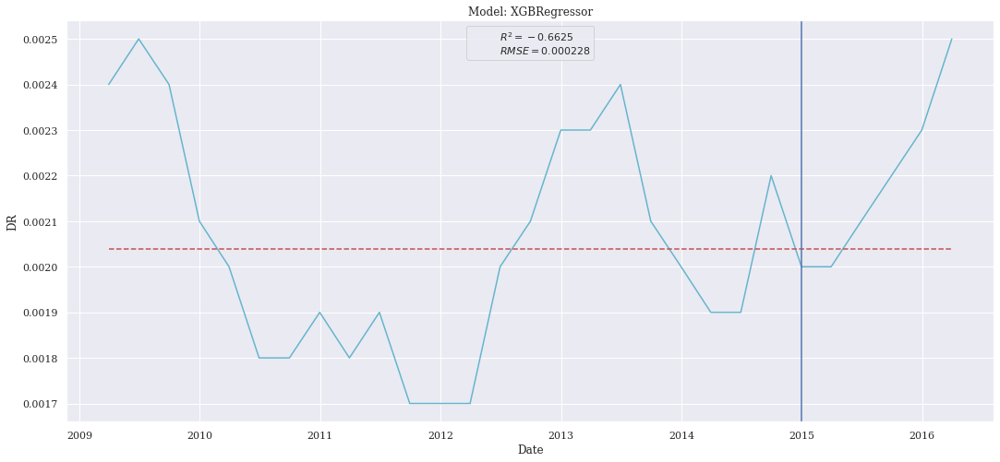

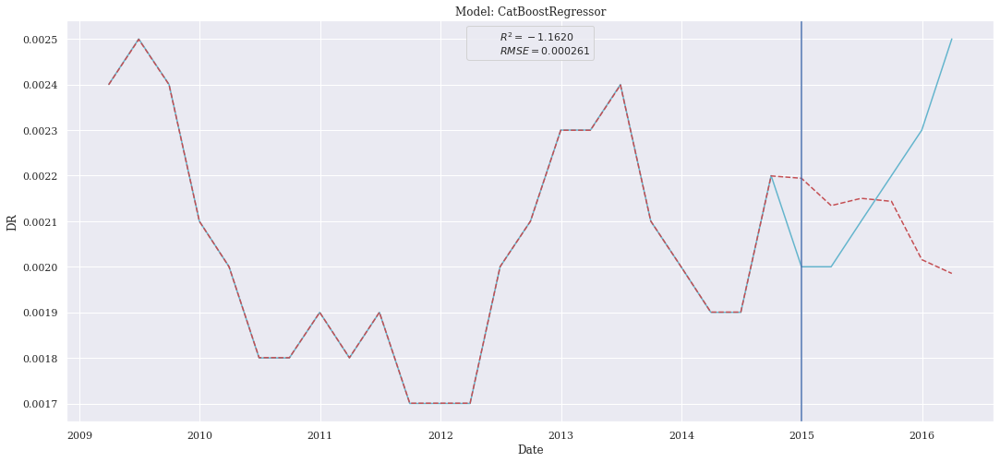

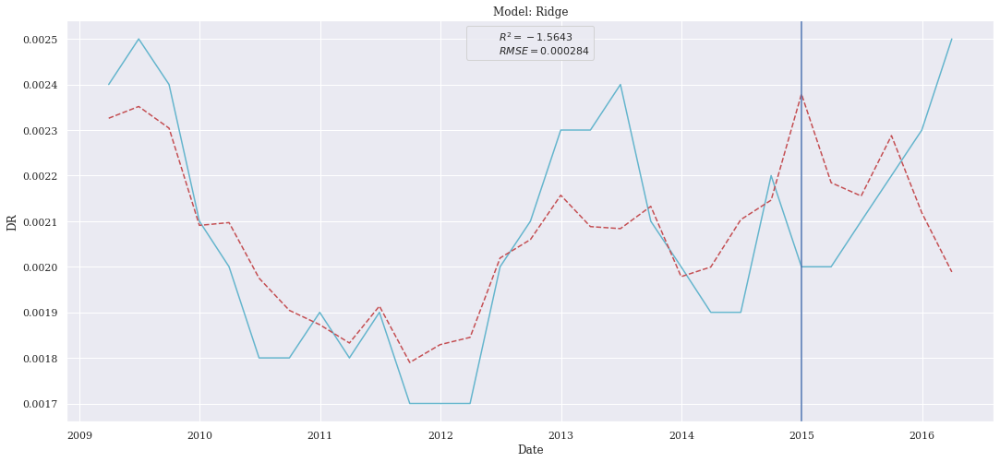

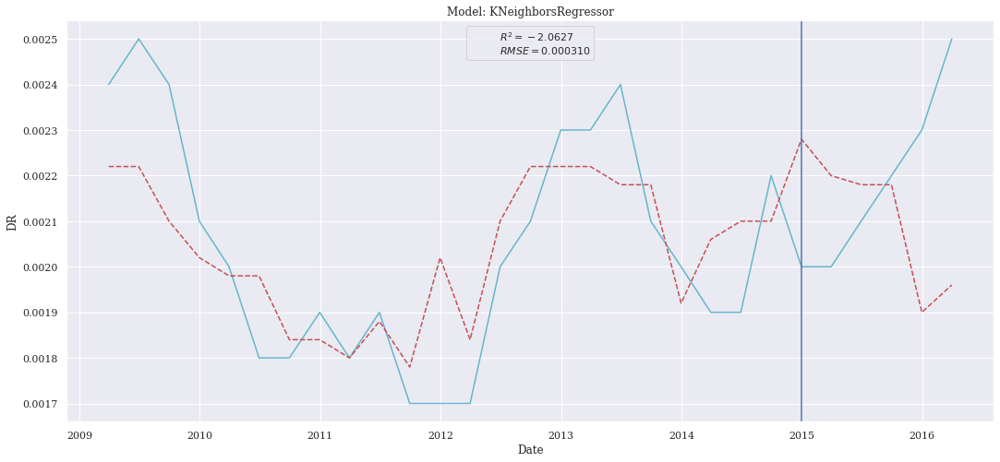

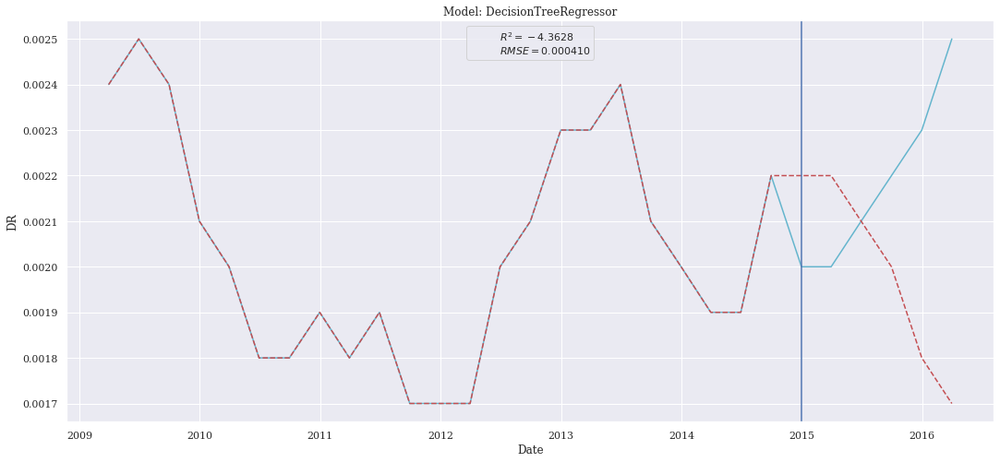

In [27]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [28]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_2_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
CatBoostRegressor,0.000232,5.399103e-08,0.000179,-0.720068
KNeighborsRegressor,0.000282,7.933333e-08,0.000200,-1.527434
DecisionTreeRegressor,0.000292,8.500000e-08,0.000283,-1.707965
Ridge,0.000297,8.814118e-08,0.000212,-1.808038
LinearSVR,0.000363,1.320135e-07,0.000334,-3.205741
LinearRegression,0.000421,1.776053e-07,0.000397,-4.658223


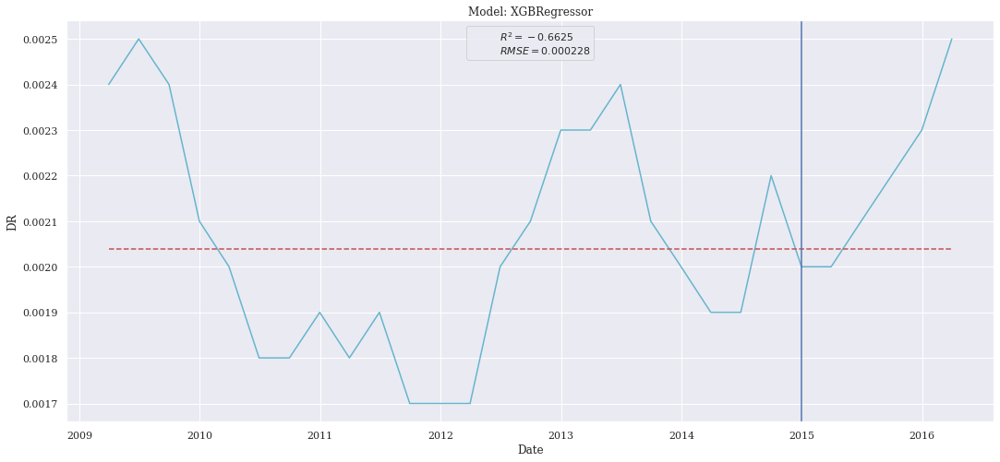

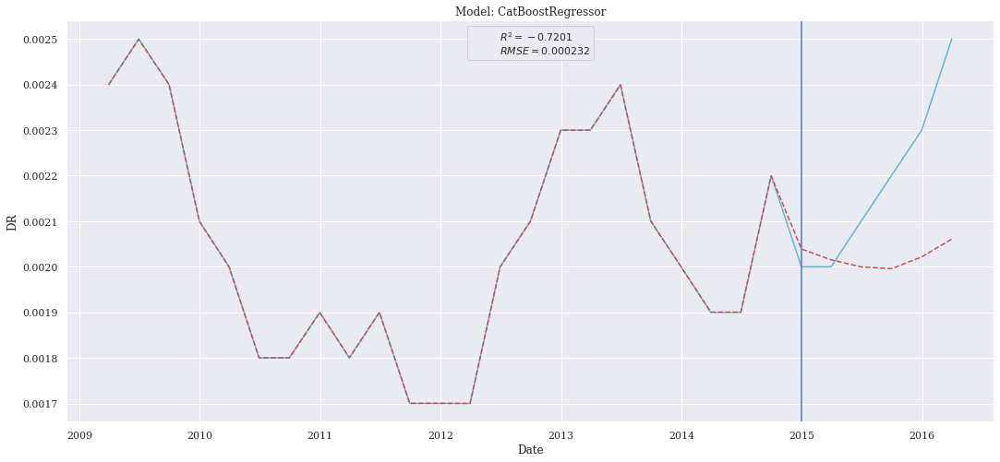

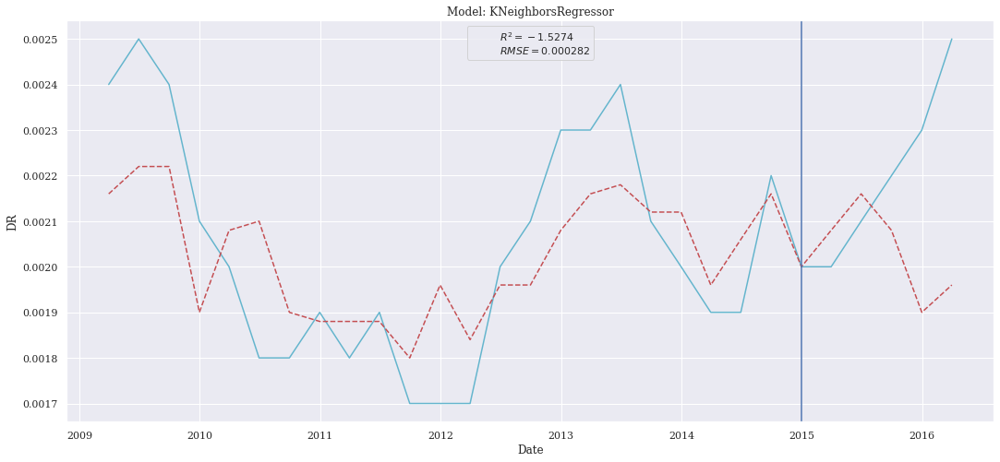

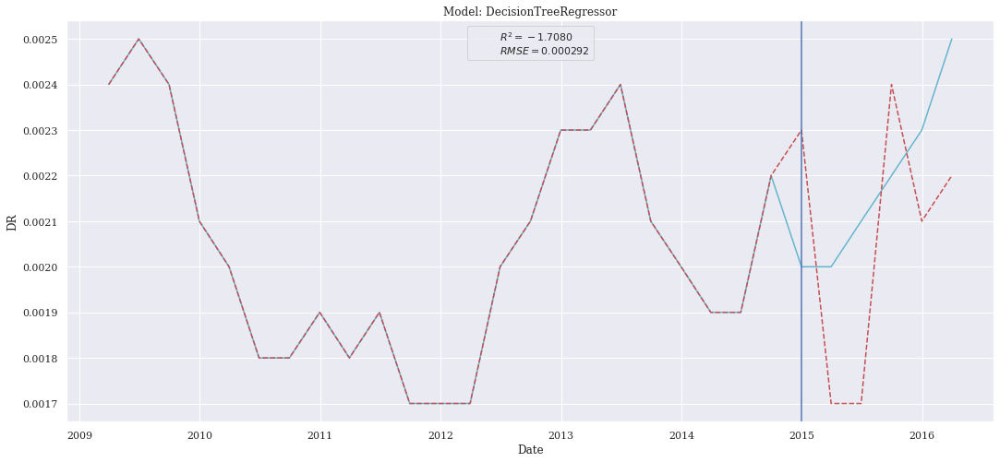

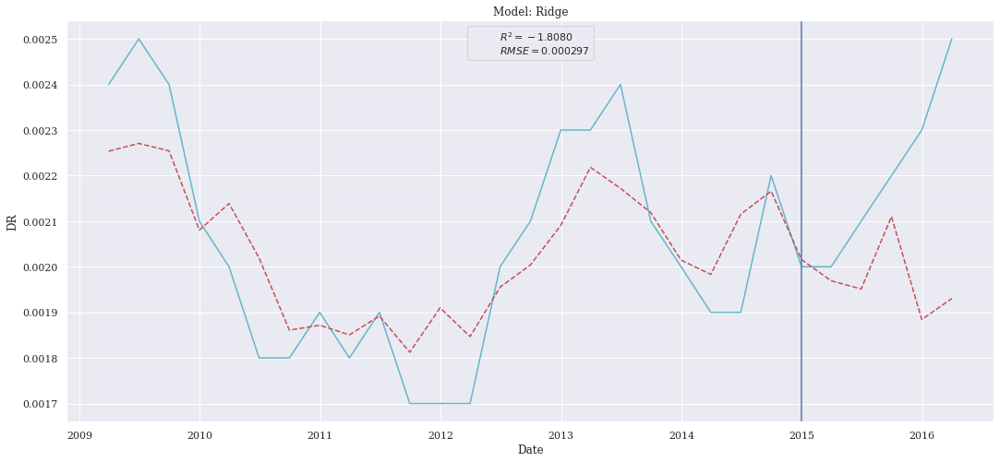

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


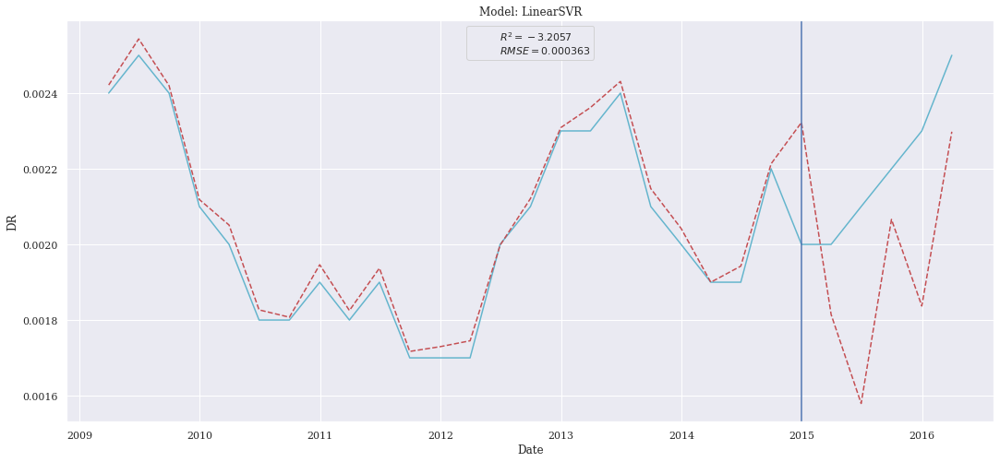

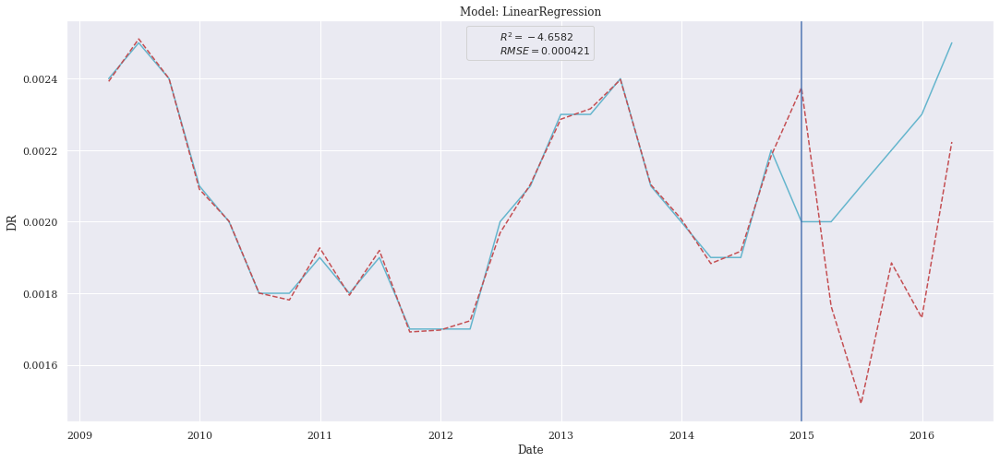

In [29]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## Final Conclusion
The best models are:
- ridge with correlation features
- linearSVR with selectFromModel features
- linearSVR with sequantial forward features

# Focus on the Chronique CHR8

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [24]:
chronique=b'CHR8'
start = 1
norm = "MinMax"
split = 0.2
period = 12
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train,X_test], axis=1).index

### Correlation Features

In [31]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period,chronique=chronique,col_used=cl.col_8_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.015522,0.000241,0.014793,-9.559100
XGBRegressor,0.016953,0.000287,0.016087,-11.594400
Ridge,0.018147,0.000329,0.017278,-13.432022
DecisionTreeRegressor,0.018956,0.000359,0.014767,-14.746750
KNeighborsRegressor,0.020407,0.000416,0.019733,-17.250266
LinearSVR,0.048093,0.002313,0.038614,-100.360466
LinearRegression,0.079290,0.006287,0.073672,-274.515401


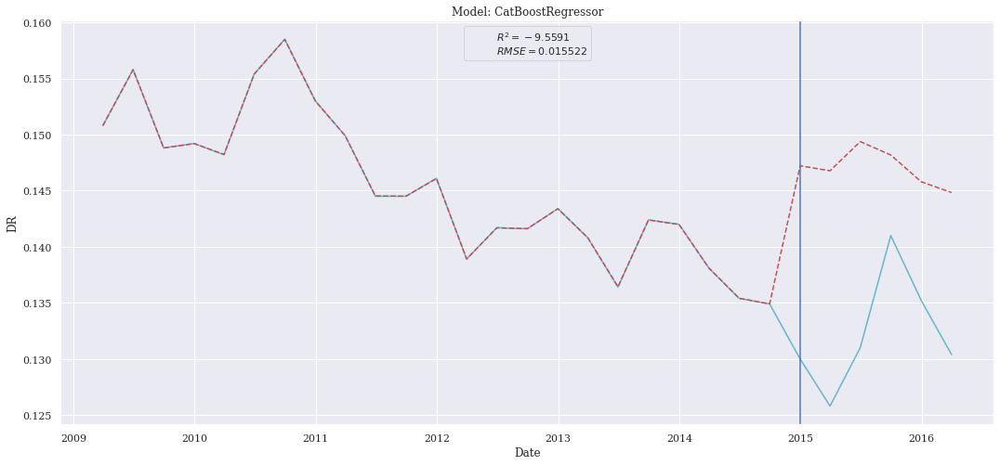

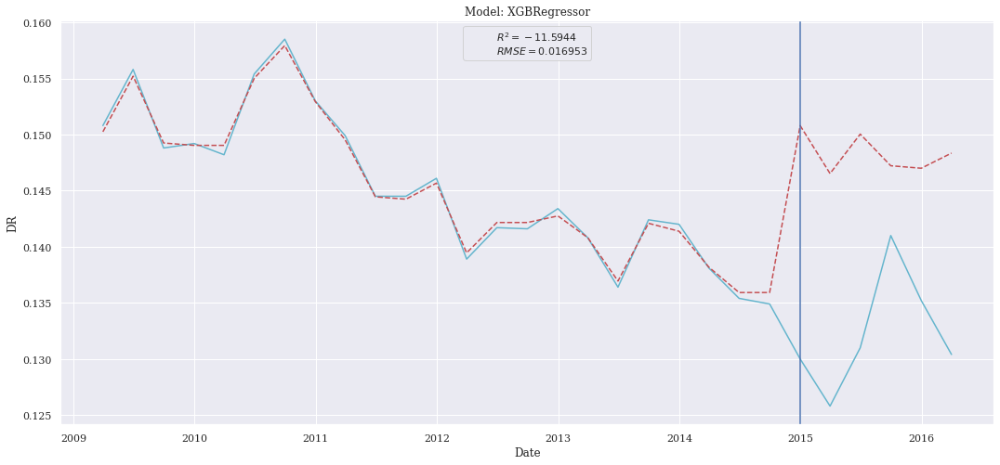

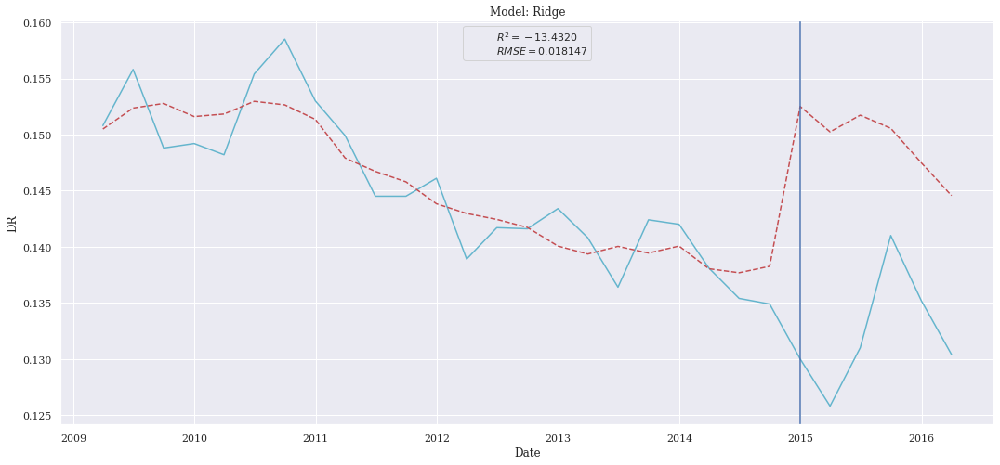

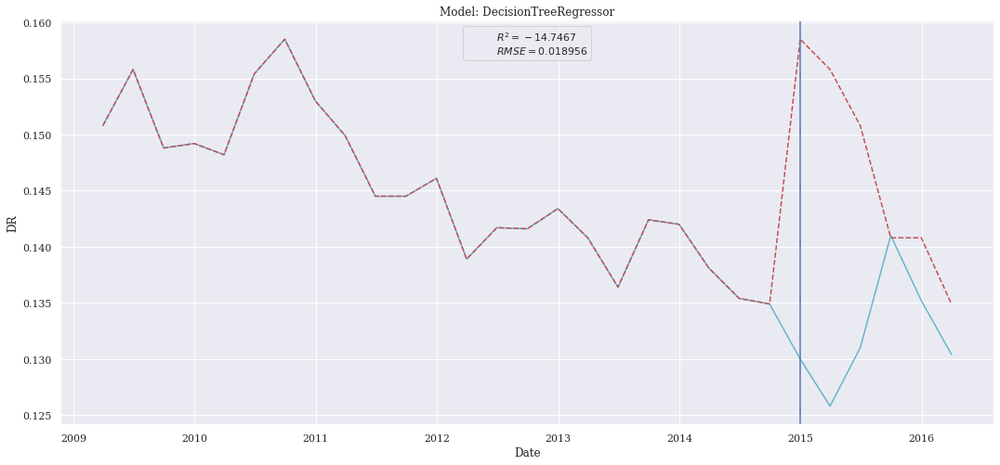

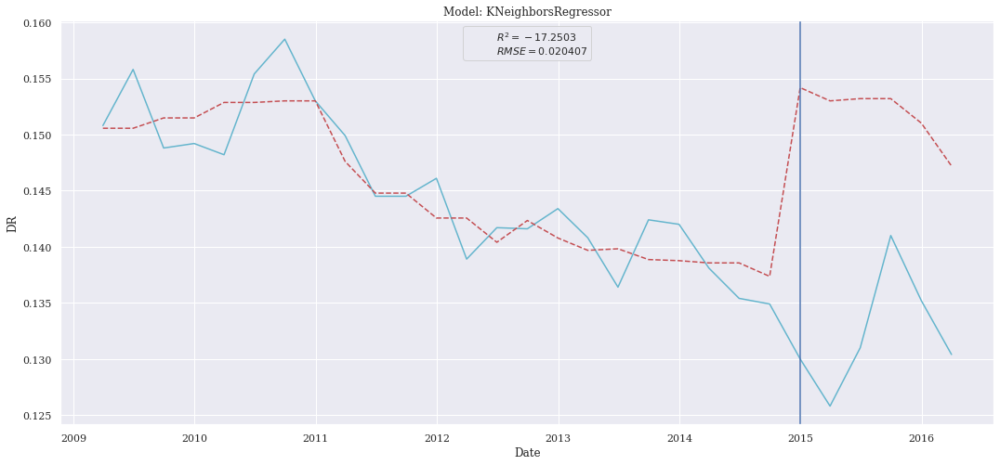

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


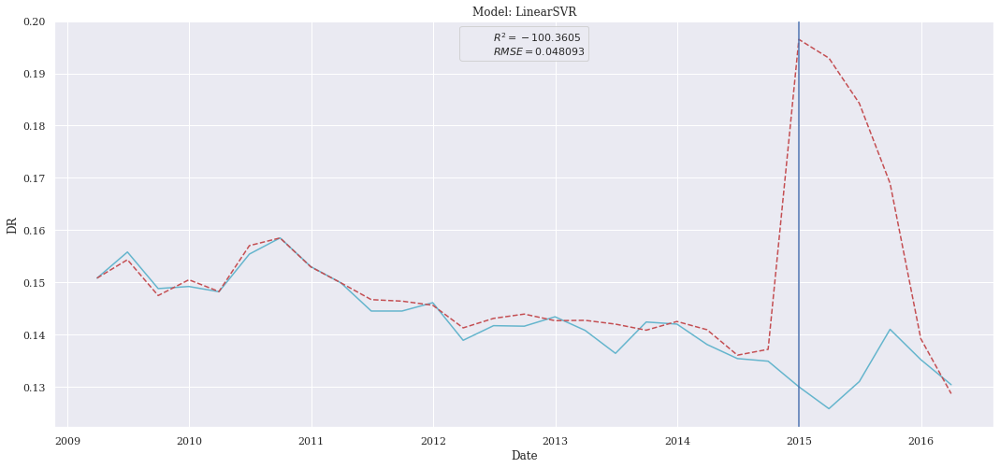

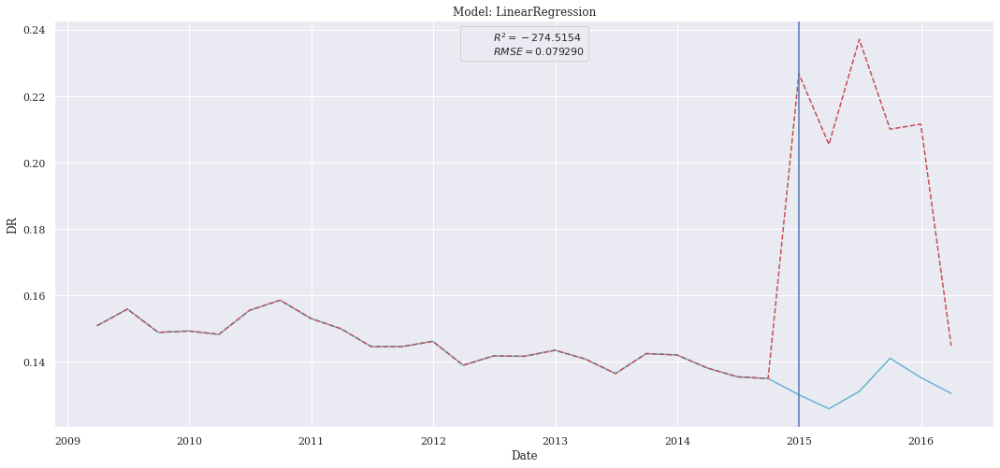

In [32]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [33]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique,col_used=cl.col_8_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.013805,0.000191,0.013129,-7.351717
KNeighborsRegressor,0.014628,0.000214,0.013947,-8.376863
CatBoostRegressor,0.014959,0.000224,0.014003,-8.806148
XGBRegressor,0.017323,0.000300,0.014902,-12.151145
LinearRegression,0.018796,0.000353,0.015433,-14.481602
DecisionTreeRegressor,0.020908,0.000437,0.019383,-18.156425
LinearSVR,0.030089,0.000905,0.027947,-38.676285


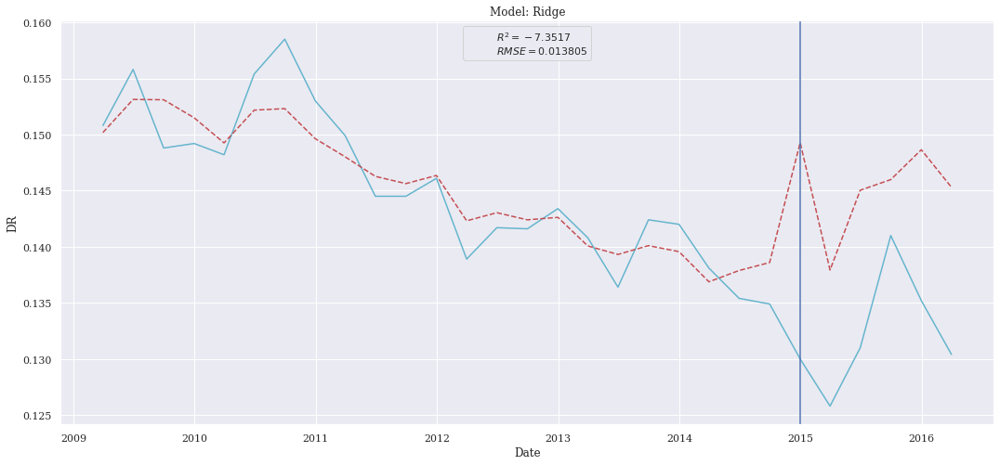

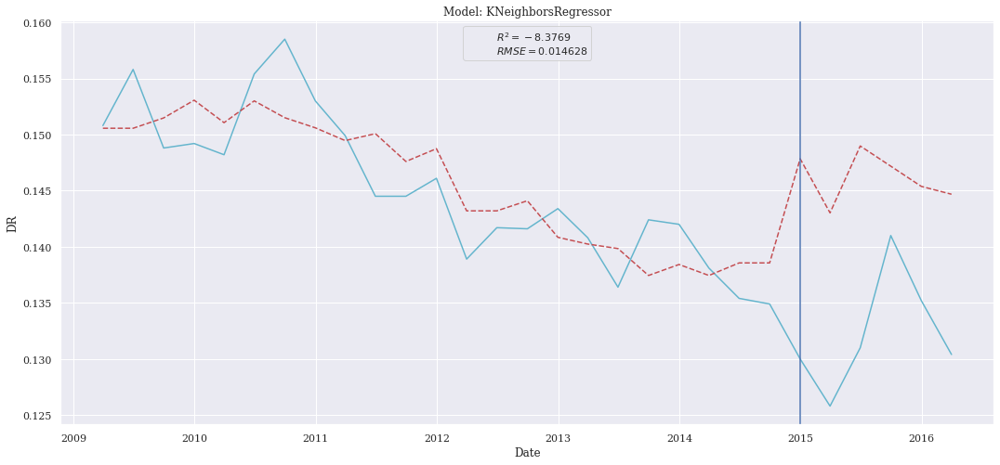

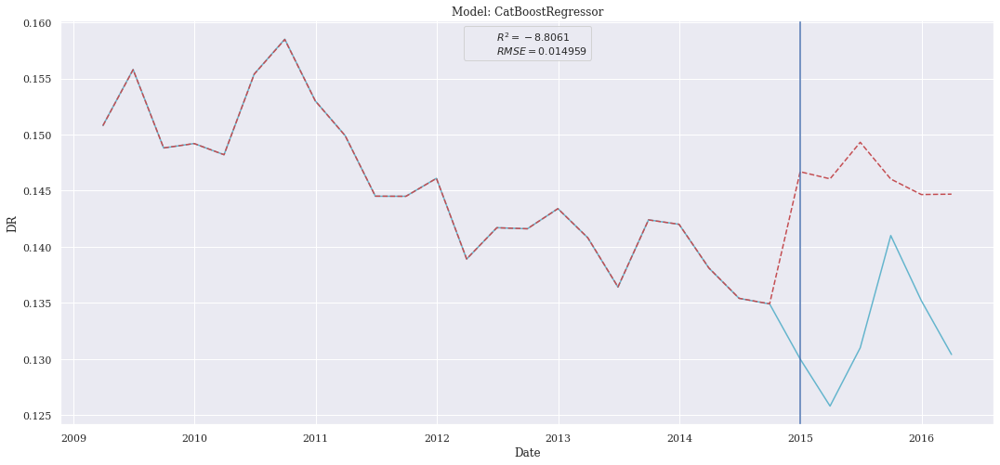

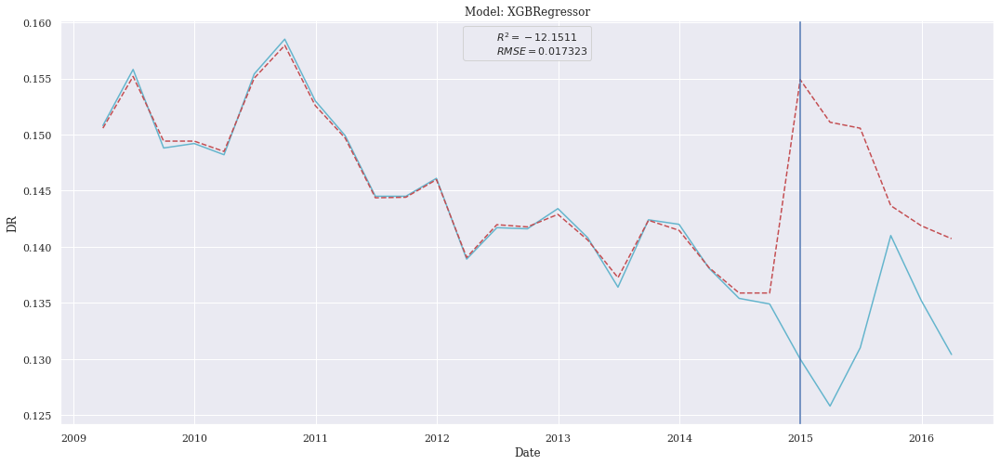

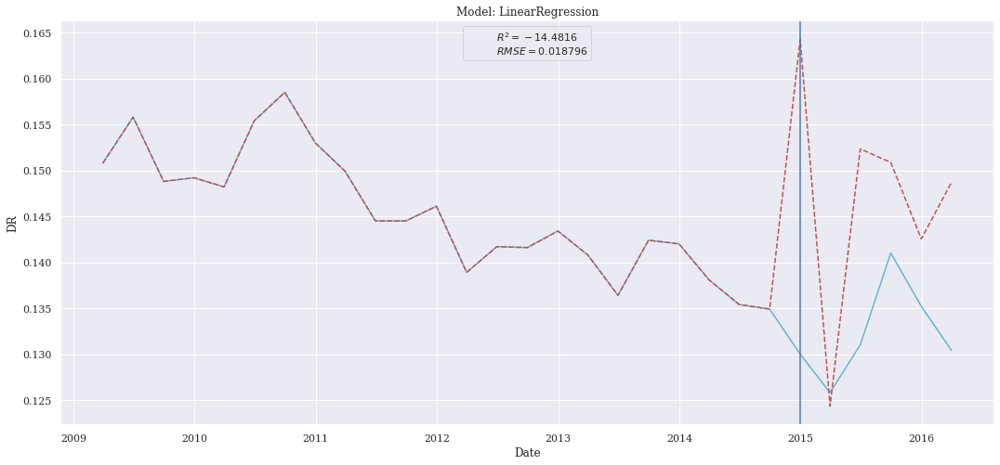

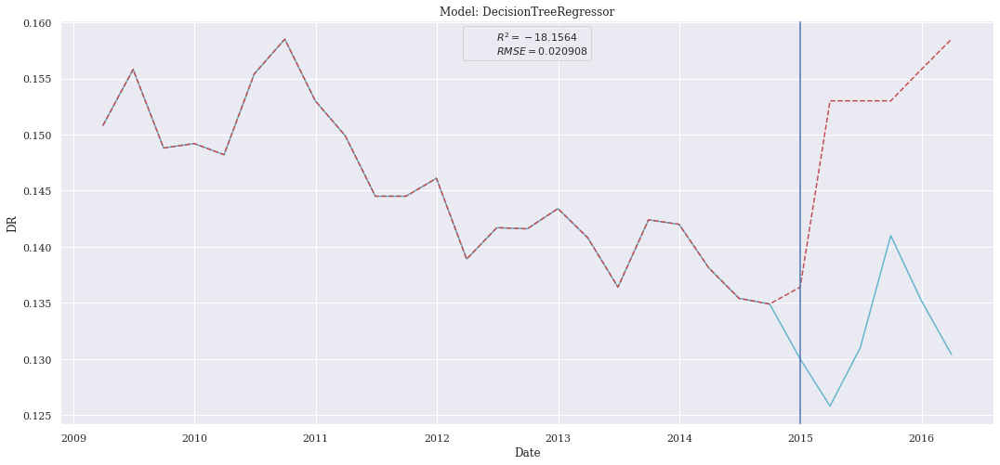

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


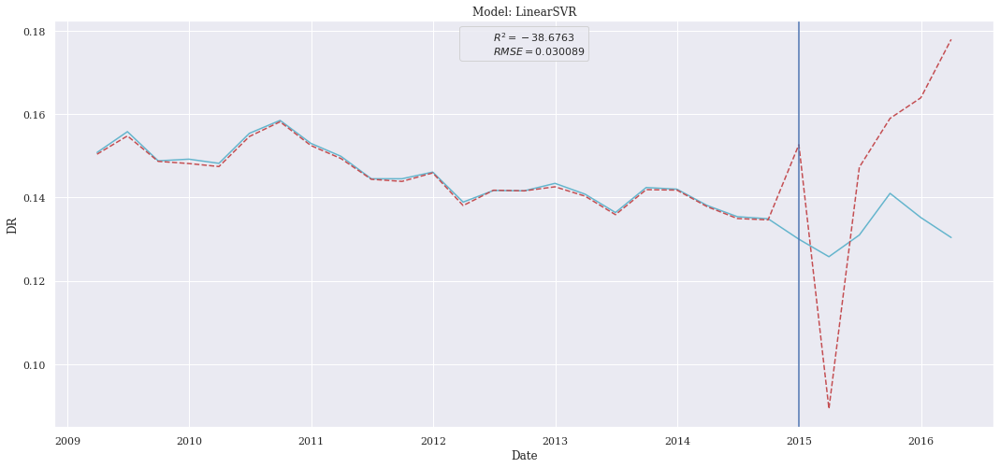

In [34]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [35]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique,col_used=cl.col_8_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.014685,0.000216,0.013801,-8.450223
Ridge,0.016421,0.000270,0.015647,-10.817542
XGBRegressor,0.016611,0.000276,0.014619,-11.091380
DecisionTreeRegressor,0.019327,0.000374,0.018867,-15.369041
KNeighborsRegressor,0.019439,0.000378,0.018443,-15.559074
LinearSVR,0.024322,0.000592,0.021225,-24.924102
LinearRegression,0.034335,0.001179,0.032043,-50.662954


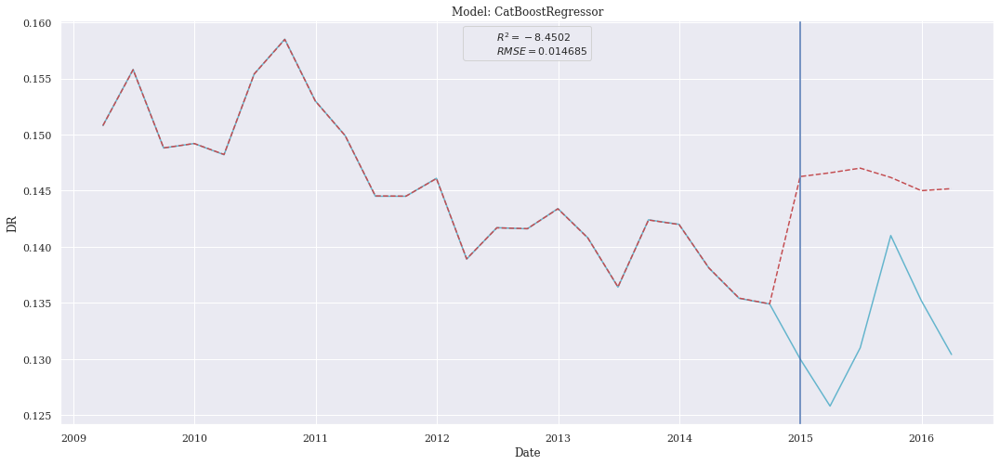

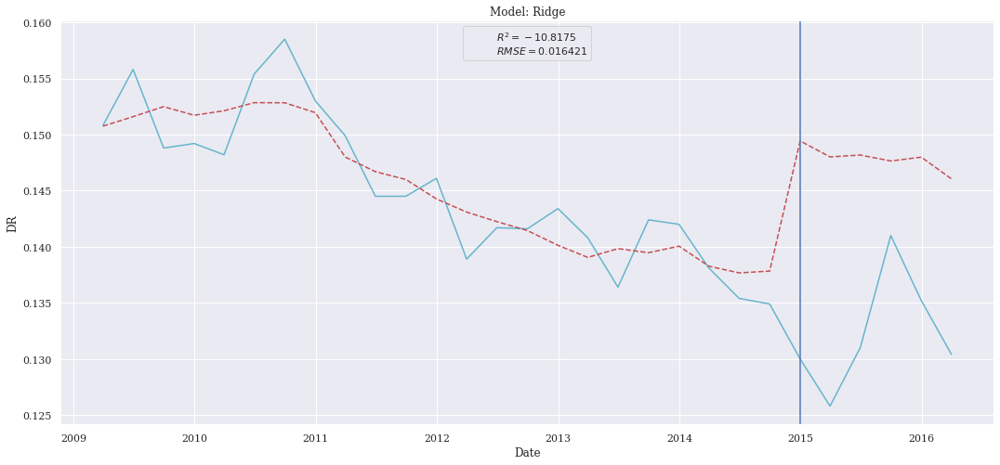

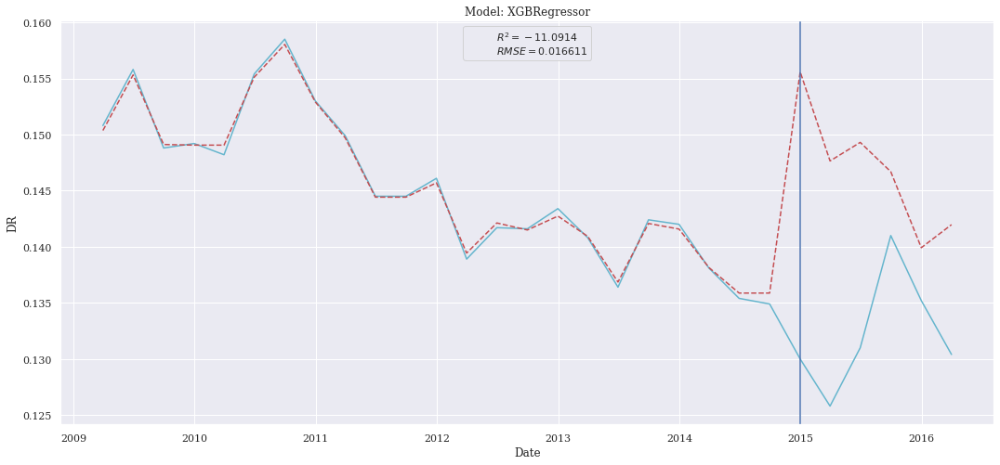

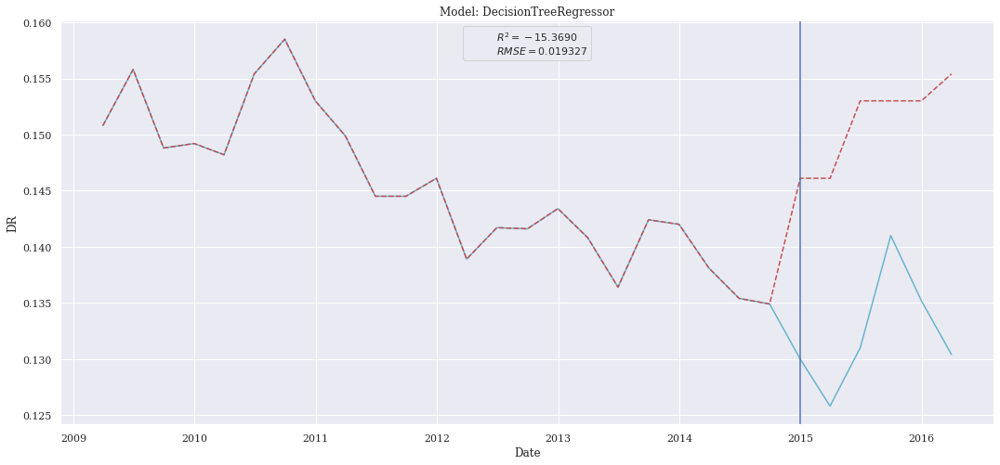

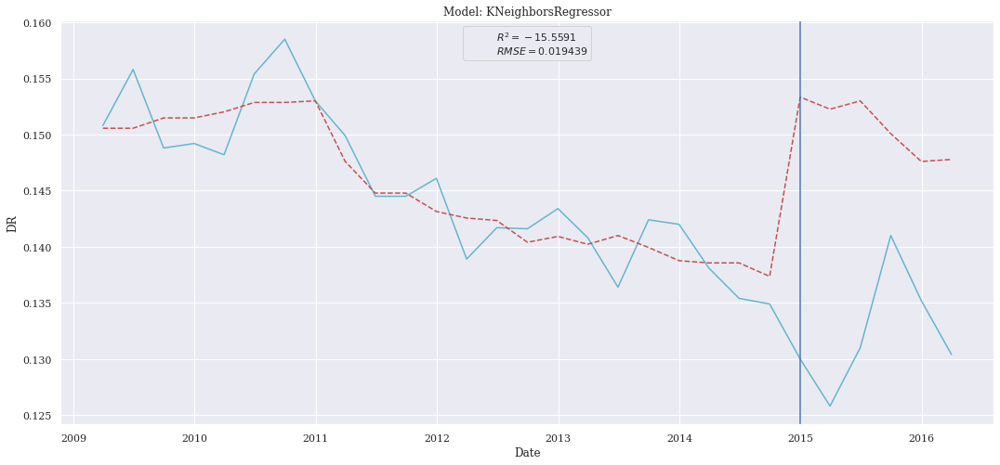

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


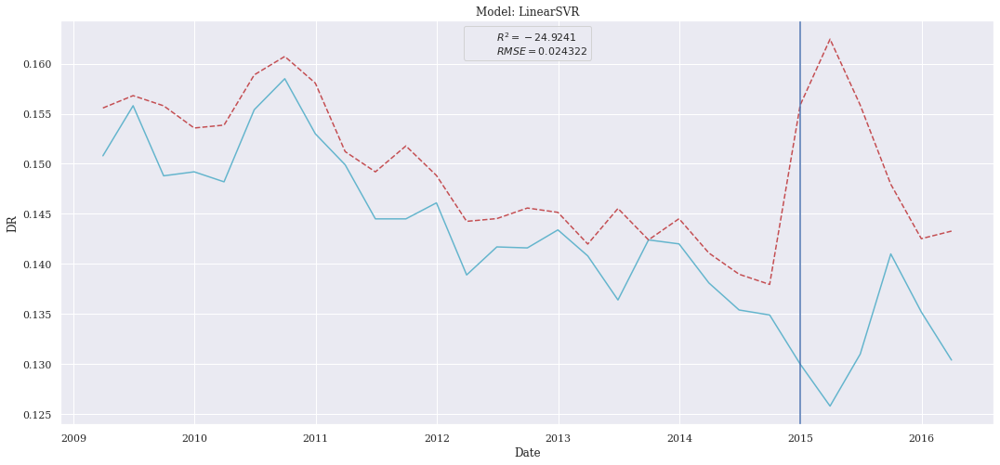

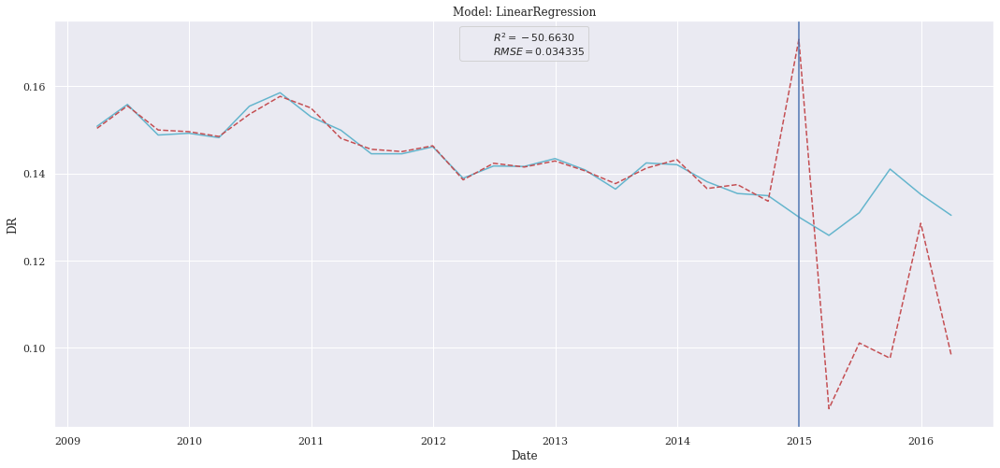

In [36]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [37]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_8_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.014697,0.000216,0.013906,-8.466127
Ridge,0.015731,0.000247,0.014961,-9.845097
XGBRegressor,0.016274,0.000265,0.014339,-10.606637
KNeighborsRegressor,0.017804,0.000317,0.017263,-12.890793
LinearRegression,0.019259,0.000371,0.018383,-15.254907
DecisionTreeRegressor,0.019980,0.000399,0.017950,-16.493767
LinearSVR,0.024570,0.000604,0.020010,-25.455601


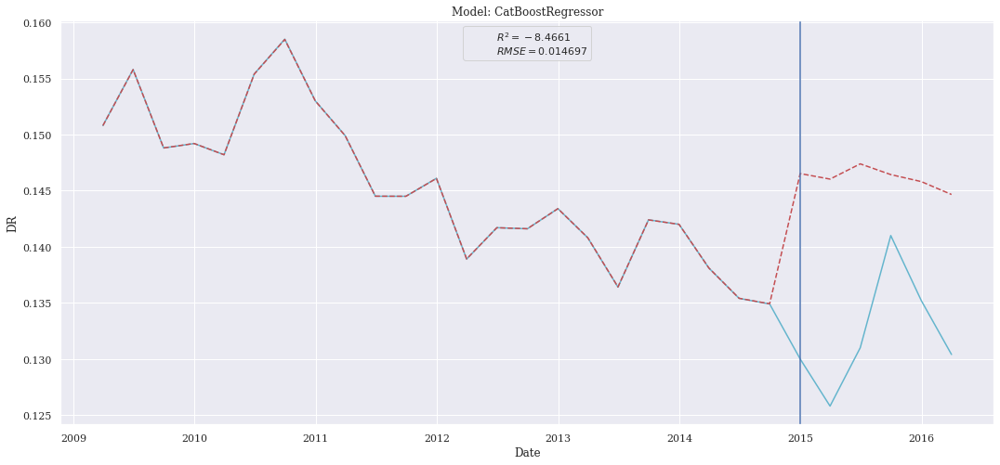

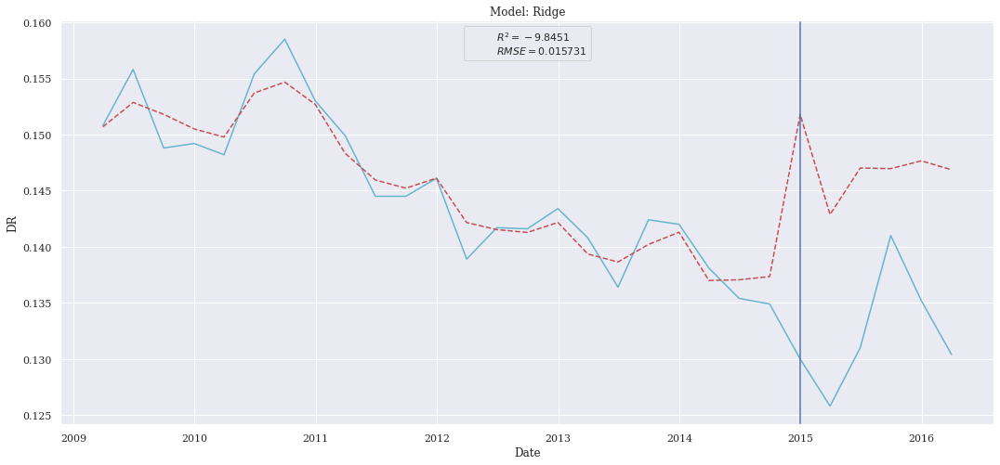

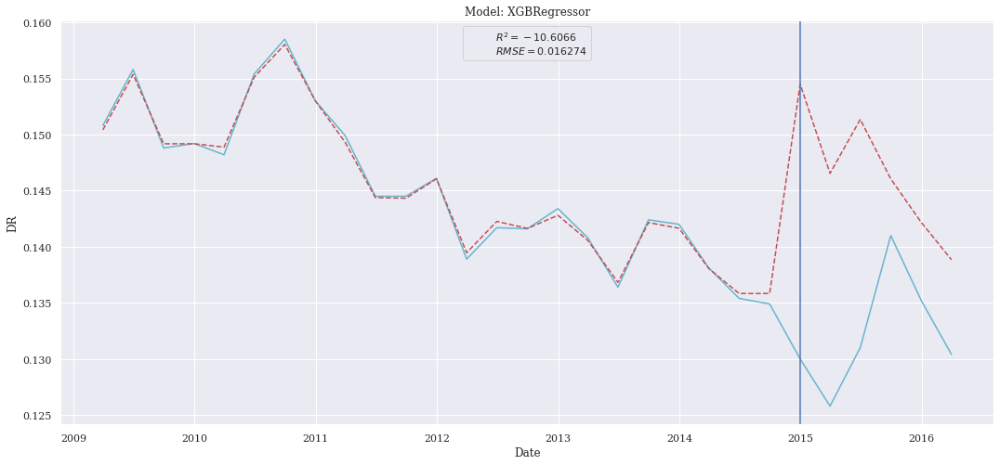

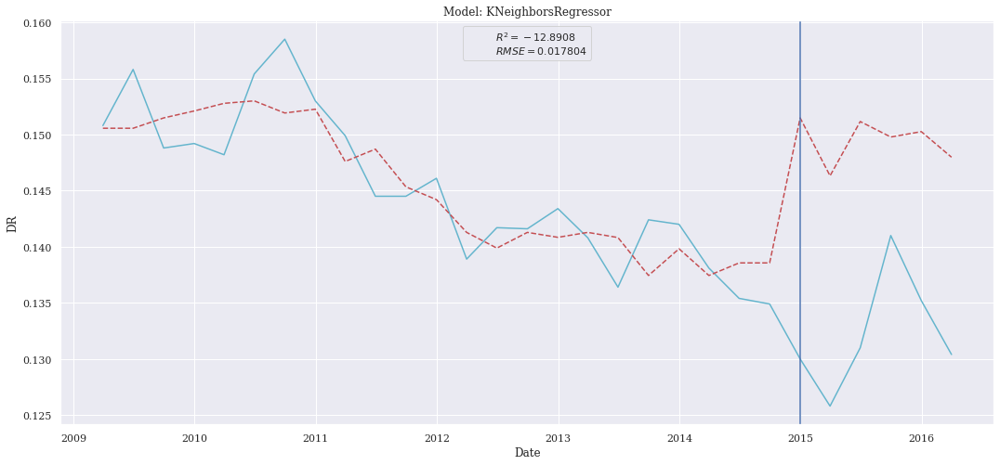

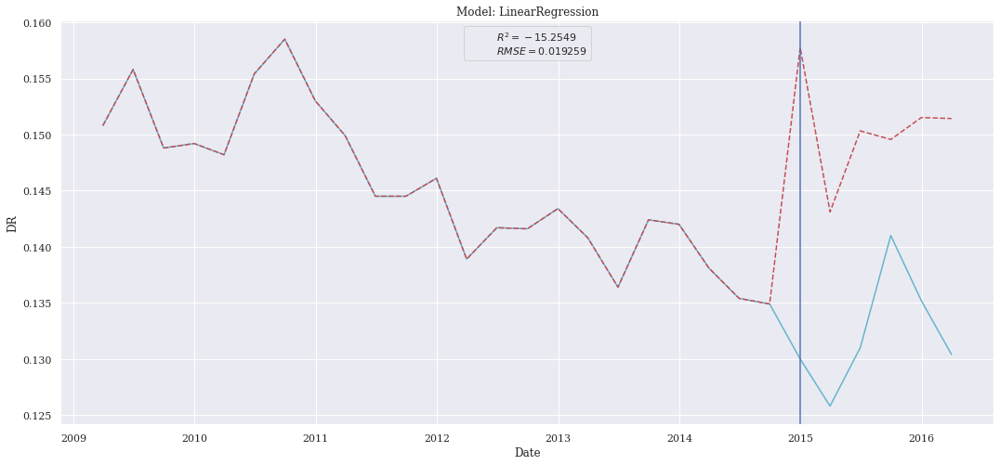

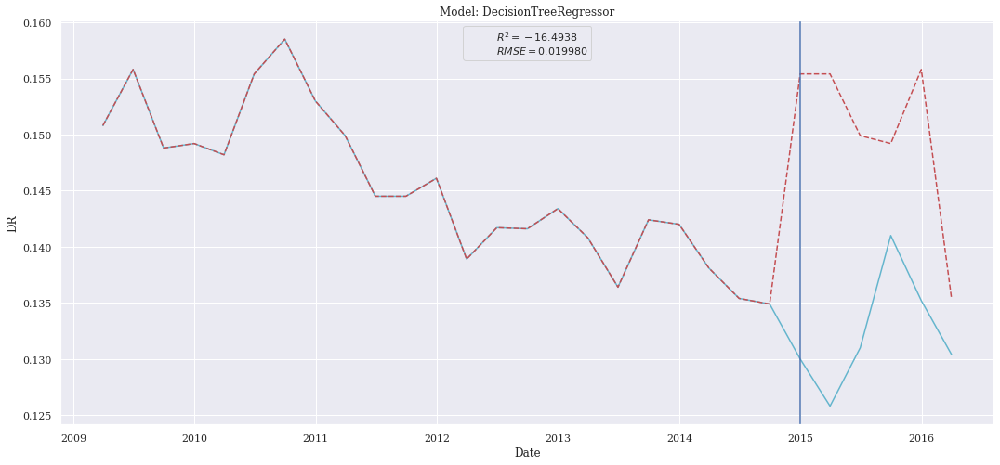

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


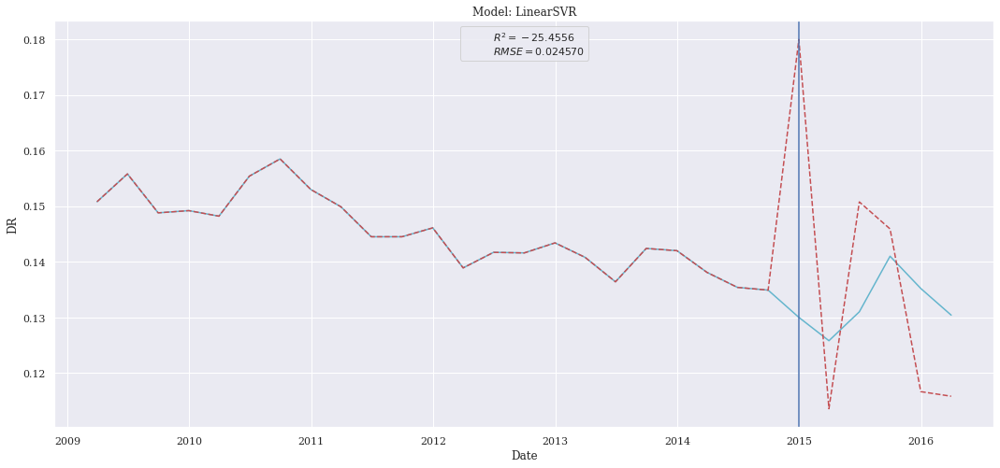

In [38]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [39]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique,col_used=cl.col_8_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.013527,0.000183,0.012324,-7.018448
LinearSVR,0.013536,0.000183,0.012242,-7.029034
KNeighborsRegressor,0.014079,0.000198,0.012723,-7.686327
CatBoostRegressor,0.014126,0.000200,0.013096,-7.744219
XGBRegressor,0.017148,0.000294,0.016443,-11.886792
DecisionTreeRegressor,0.017423,0.000304,0.015883,-12.303087
LinearRegression,0.022830,0.000521,0.021507,-21.840774


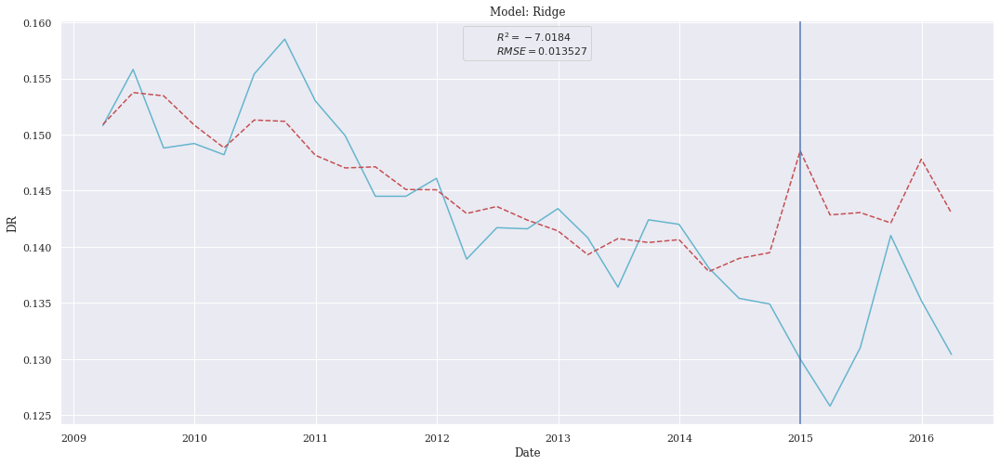

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


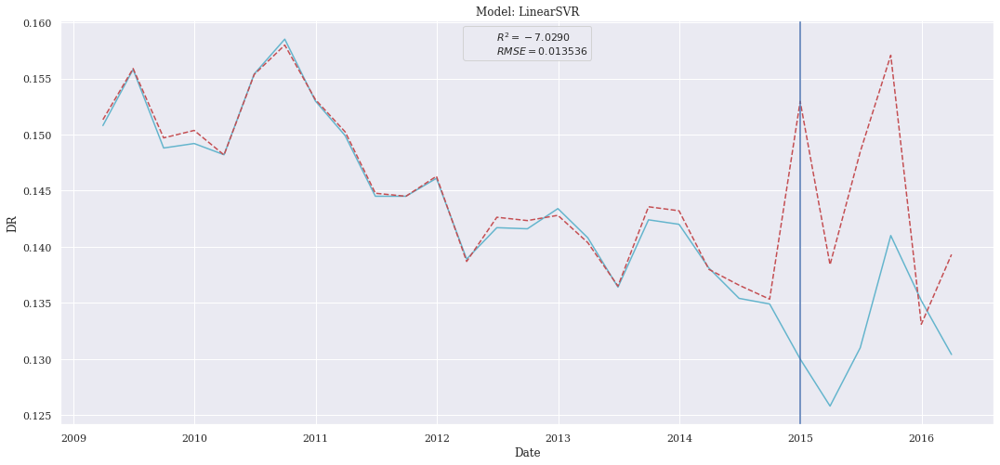

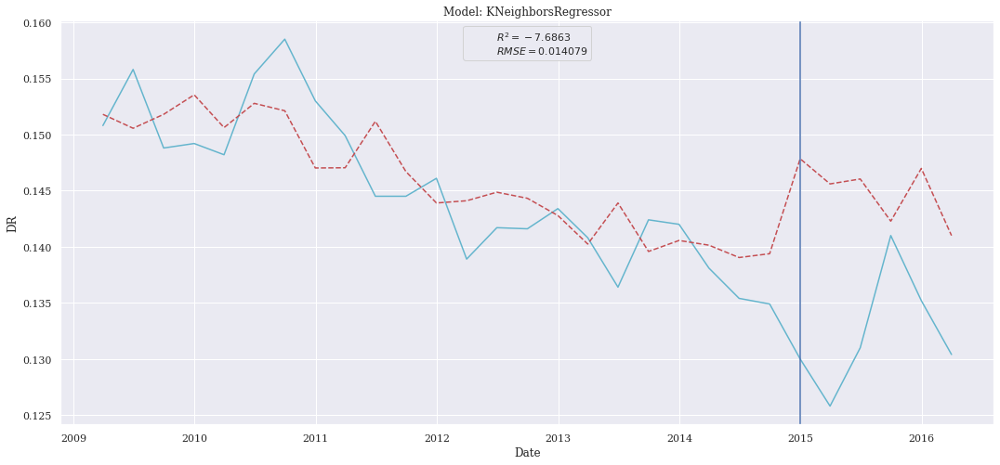

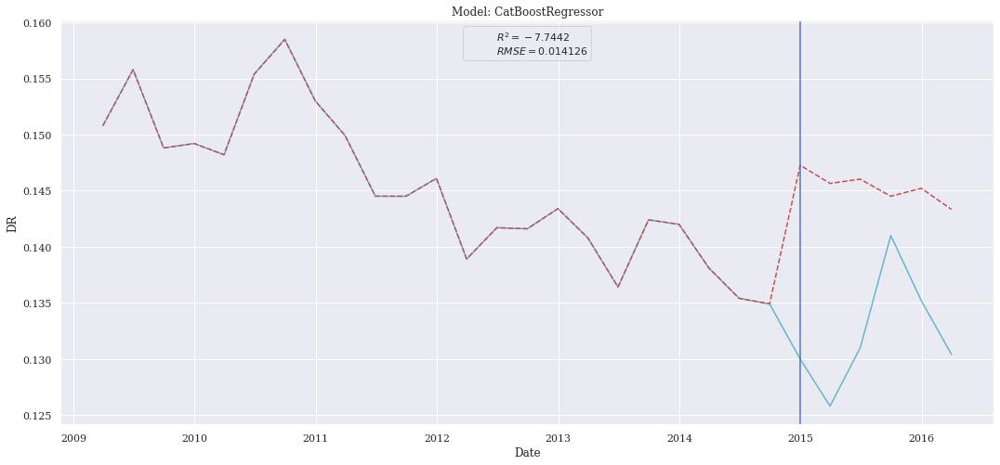

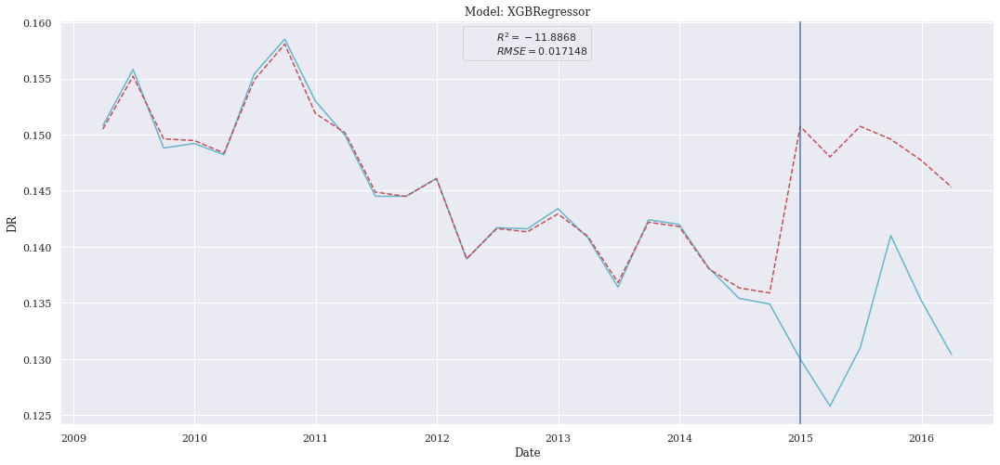

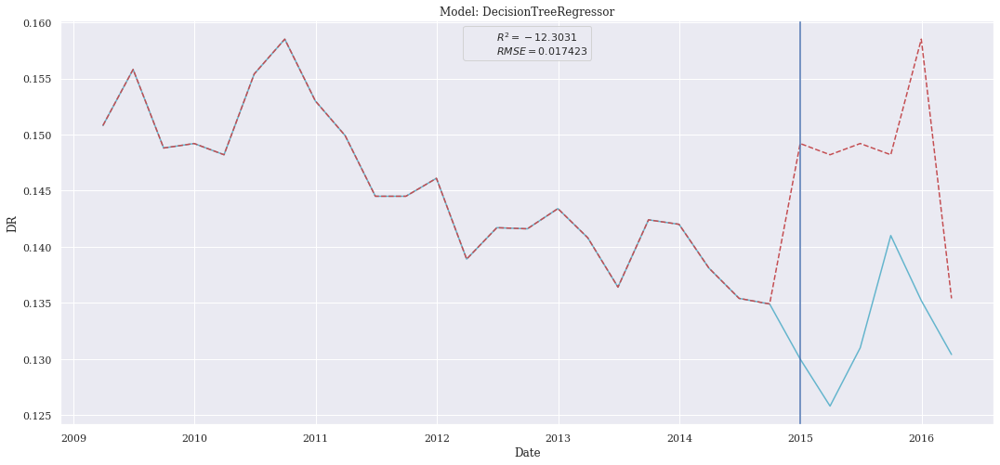

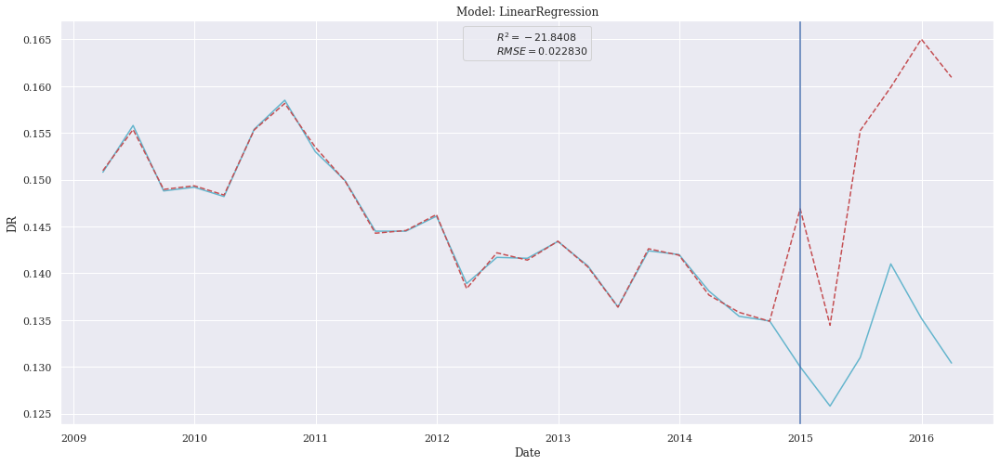

In [40]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [41]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_8_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.015686,0.000246,0.014883,-9.782368
CatBoostRegressor,0.015714,0.000247,0.014784,-9.820852
XGBRegressor,0.016328,0.000267,0.014602,-10.683521
Ridge,0.017373,0.000302,0.016851,-12.226778
KNeighborsRegressor,0.020626,0.000425,0.019977,-17.642950
LinearSVR,0.042525,0.001808,0.040422,-78.248233
LinearRegression,0.219021,0.047970,0.193042,-2101.211247


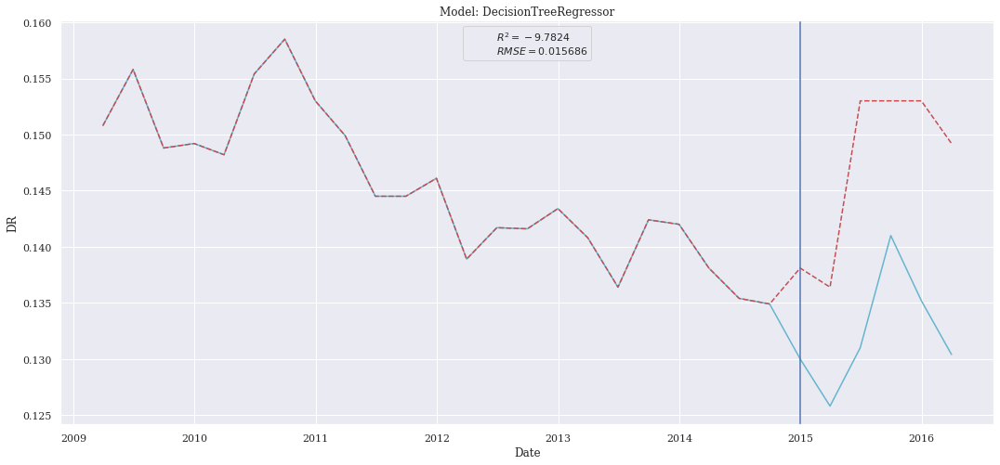

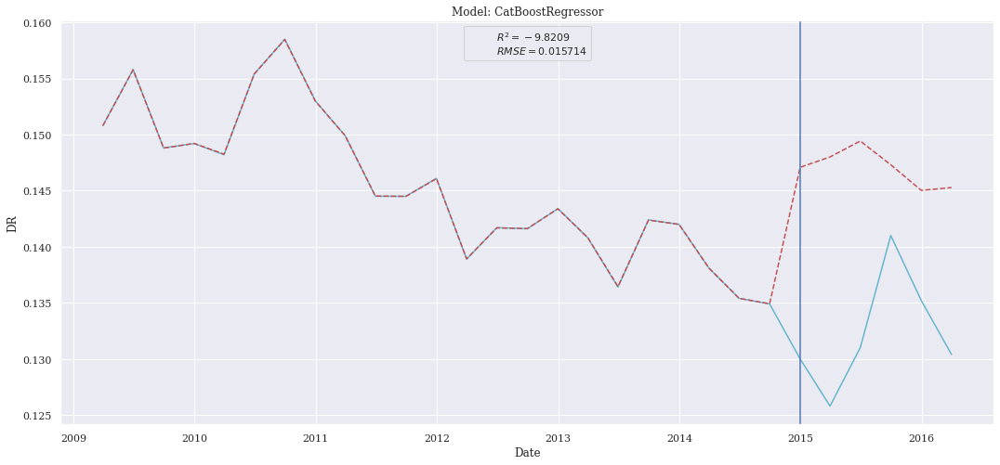

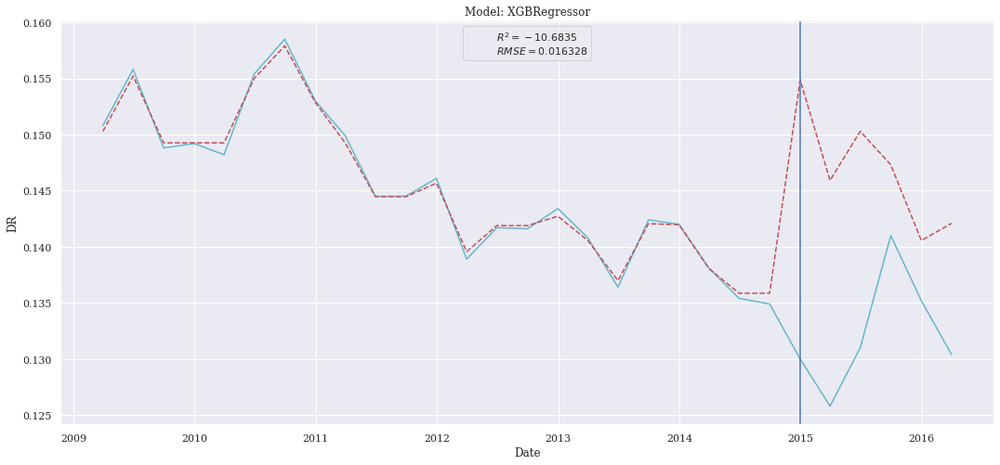

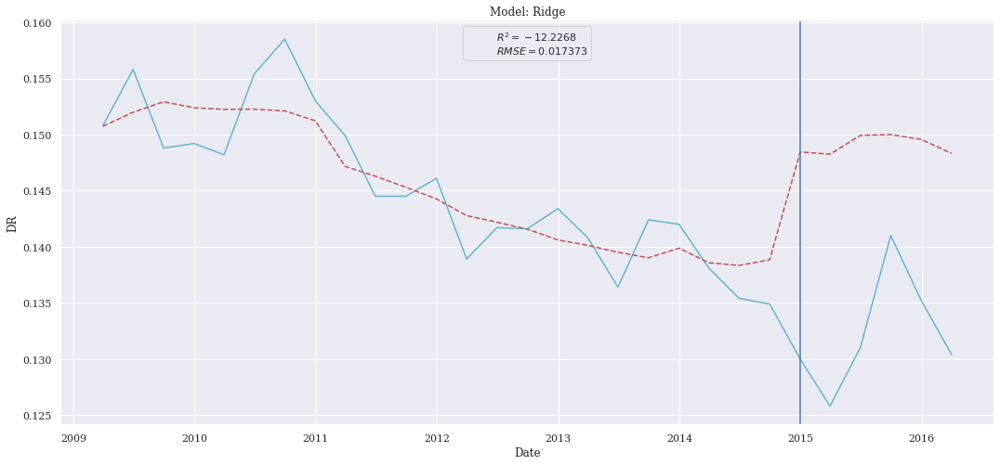

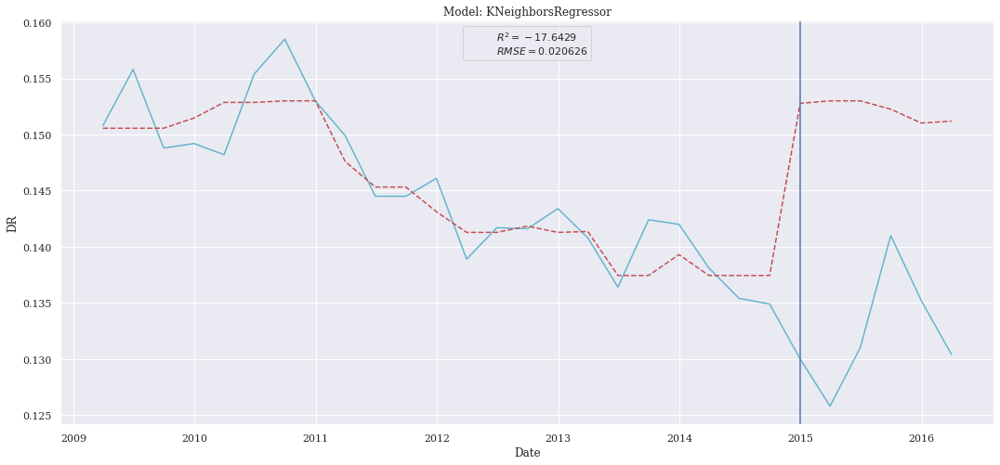

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


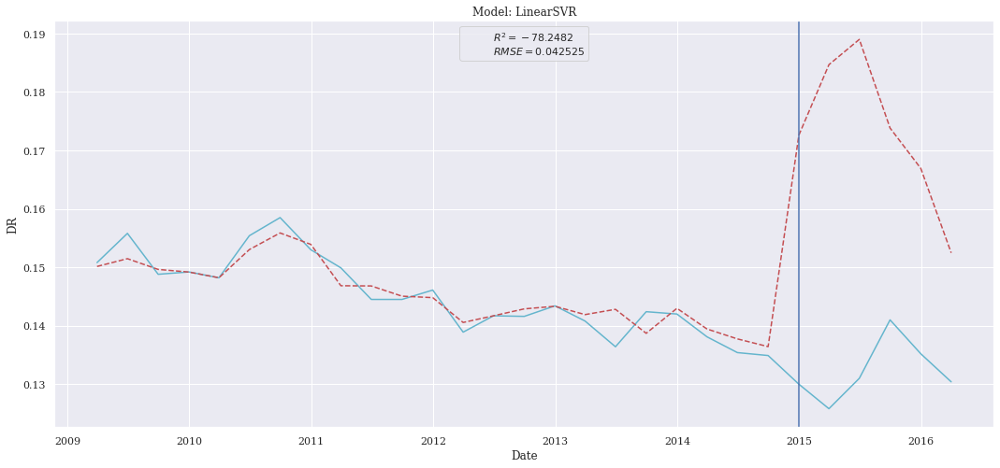

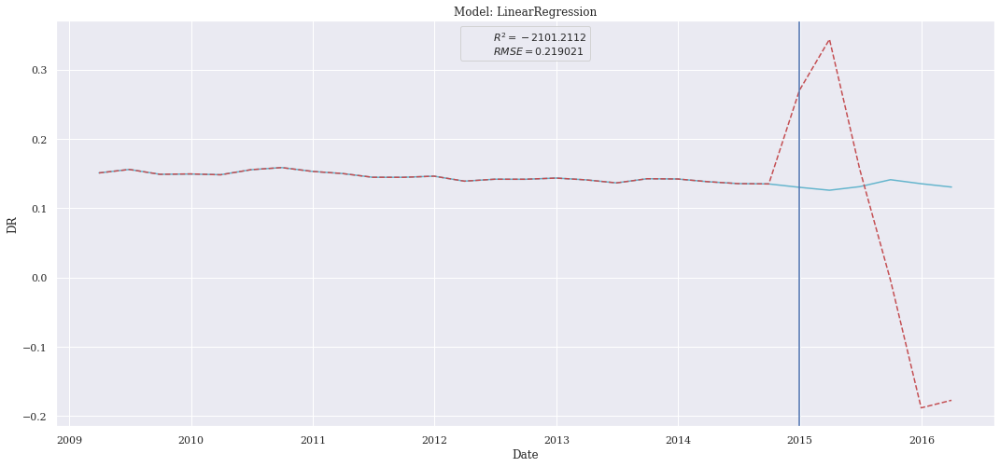

In [42]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [43]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period,chronique,col_used=cl.col_8_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.013352,0.000178,0.012972,-6.812264
CatBoostRegressor,0.014346,0.000206,0.013629,-8.018784
XGBRegressor,0.015041,0.000226,0.013919,-8.914455
KNeighborsRegressor,0.015567,0.000242,0.015193,-9.620260
DecisionTreeRegressor,0.021046,0.000443,0.020017,-18.411185
LinearSVR,0.023409,0.000548,0.018768,-23.014768
LinearRegression,0.025299,0.000640,0.019941,-27.047892


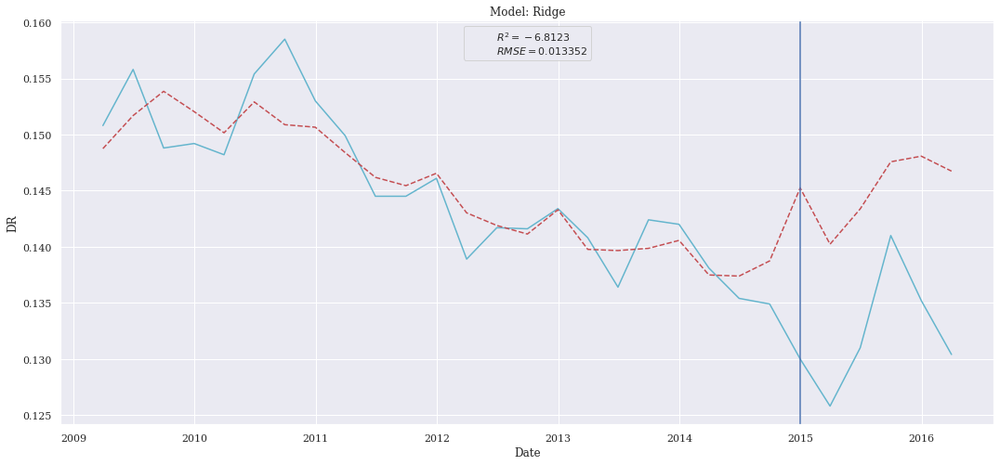

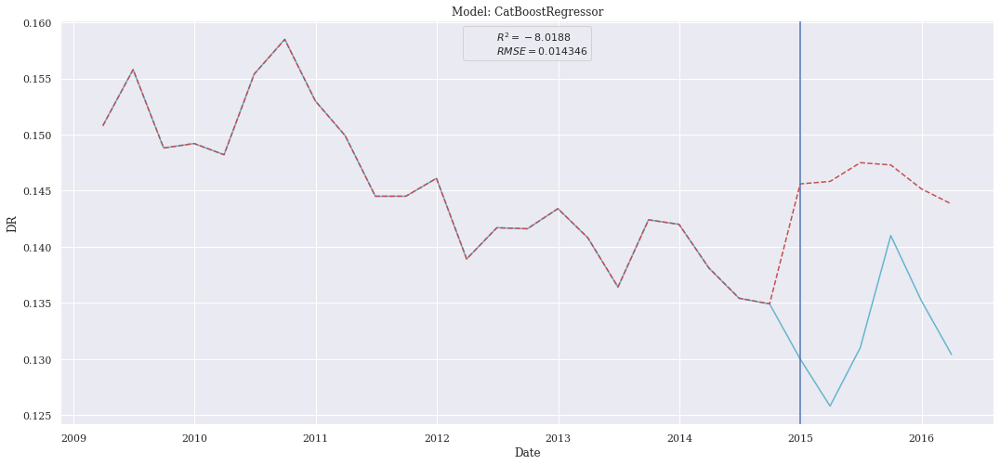

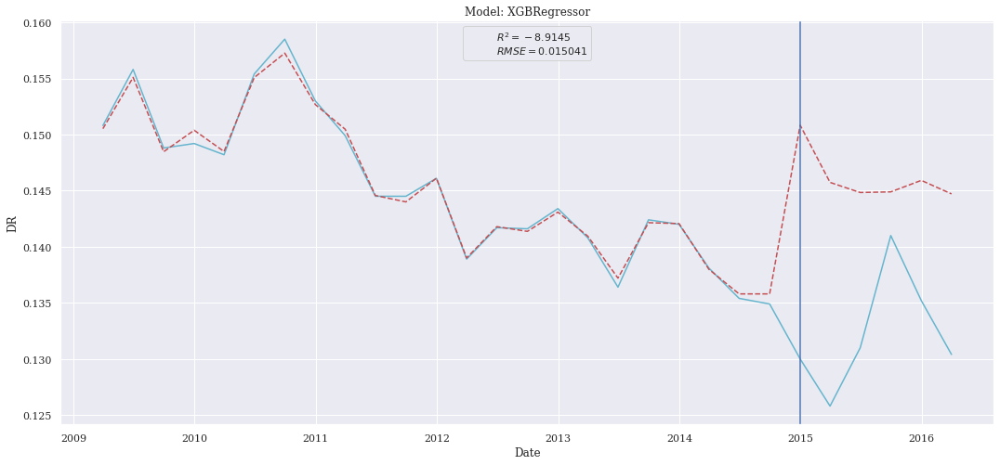

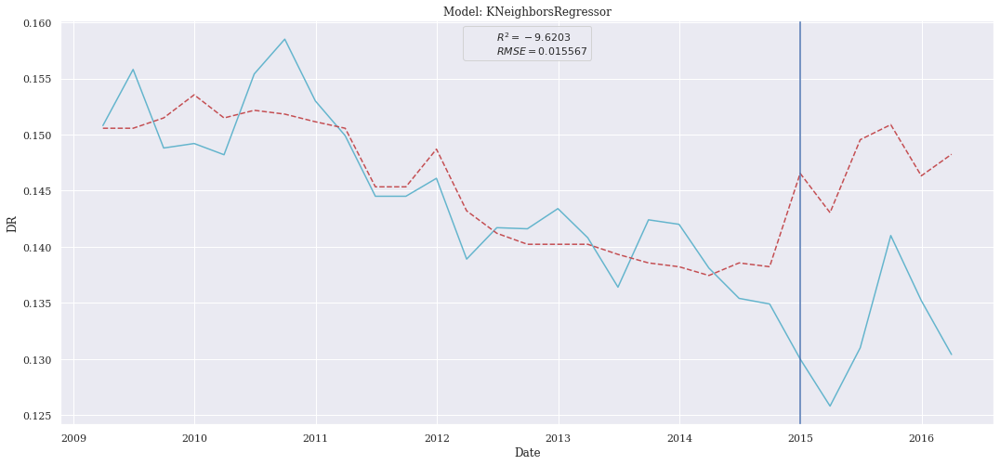

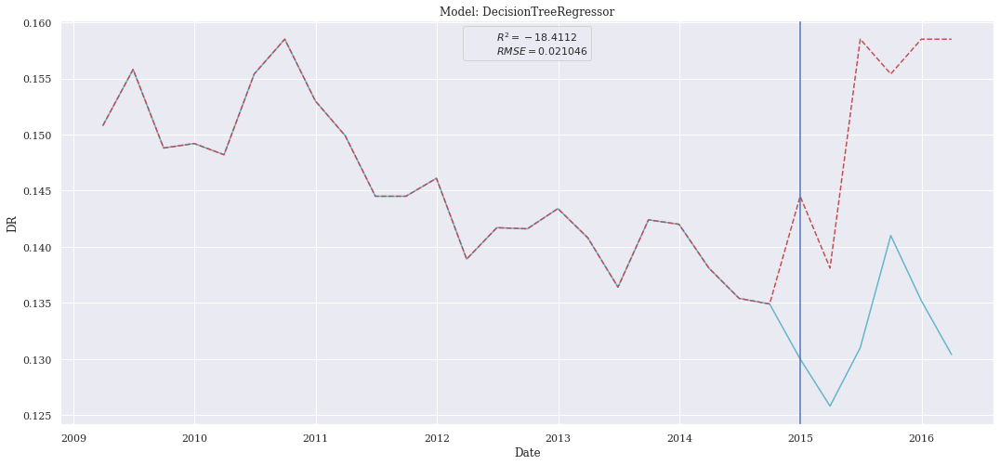

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


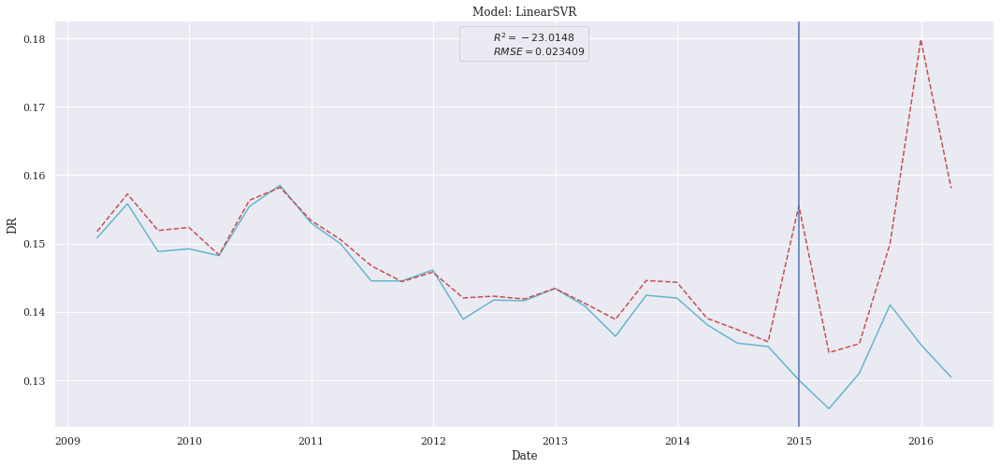

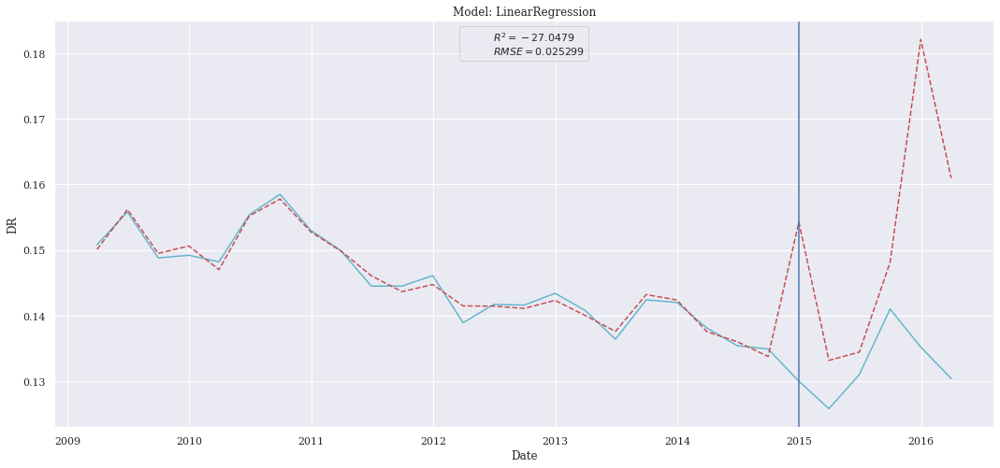

In [44]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [45]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique,col_used=cl.col_8_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.013237,0.000175,0.012783,-6.678518
CatBoostRegressor,0.014525,0.000211,0.013610,-8.245498
KNeighborsRegressor,0.015350,0.000236,0.014517,-9.325595
XGBRegressor,0.016471,0.000271,0.014468,-10.888771
DecisionTreeRegressor,0.020104,0.000404,0.018717,-16.711423
LinearSVR,0.020935,0.000438,0.018162,-18.206426
LinearRegression,0.024199,0.000586,0.020141,-24.661672


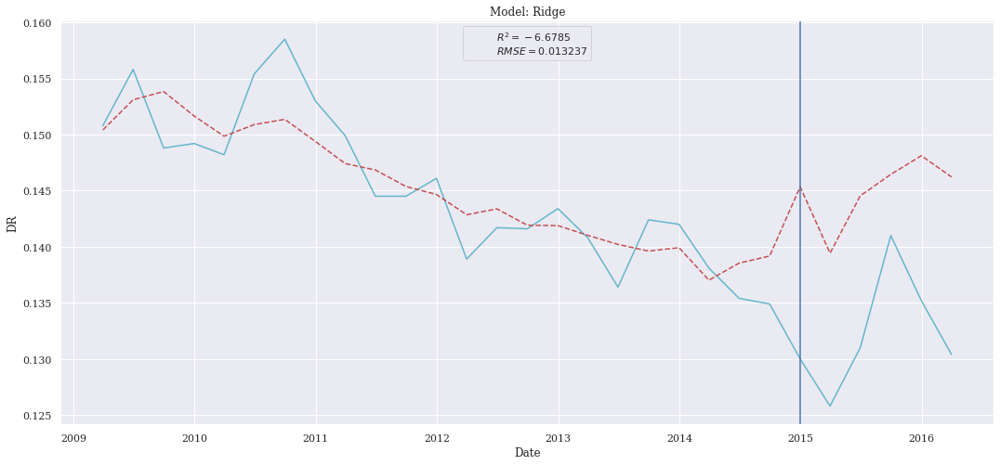

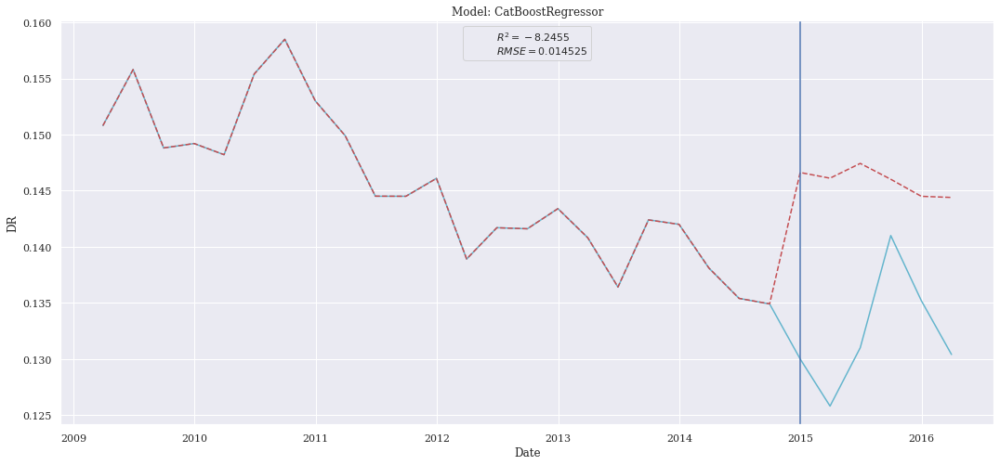

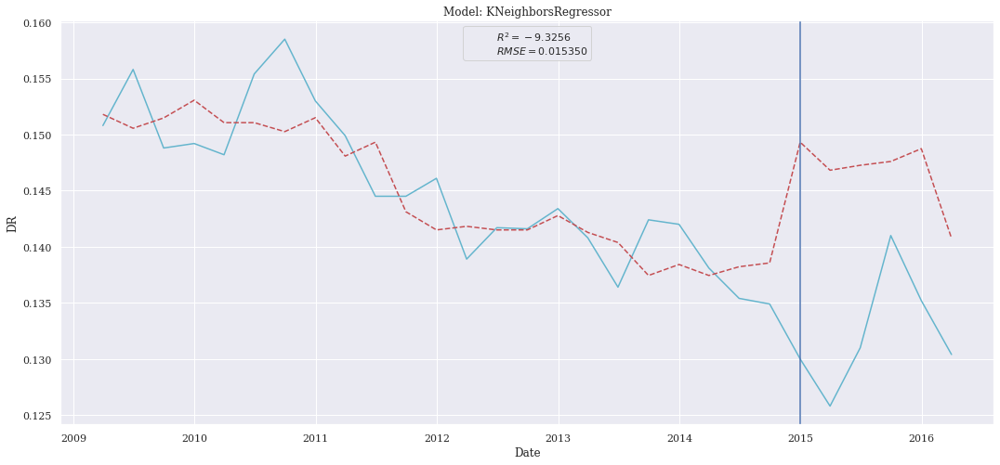

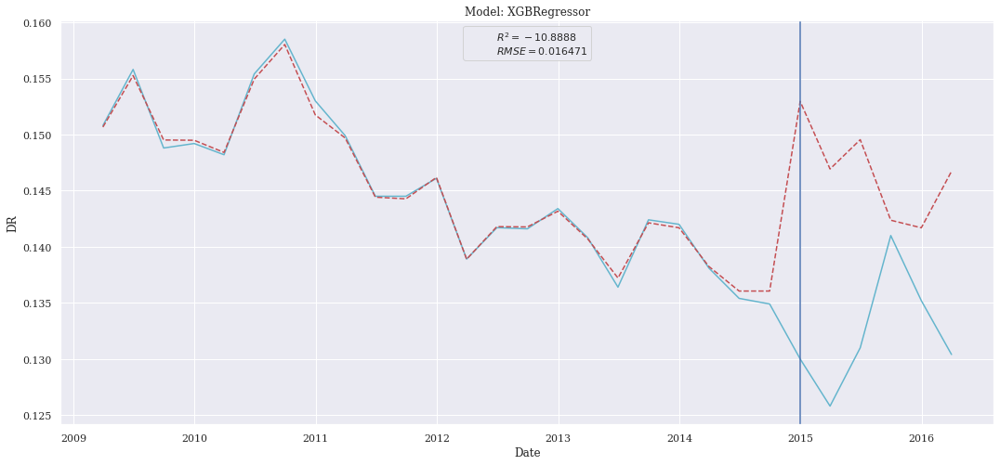

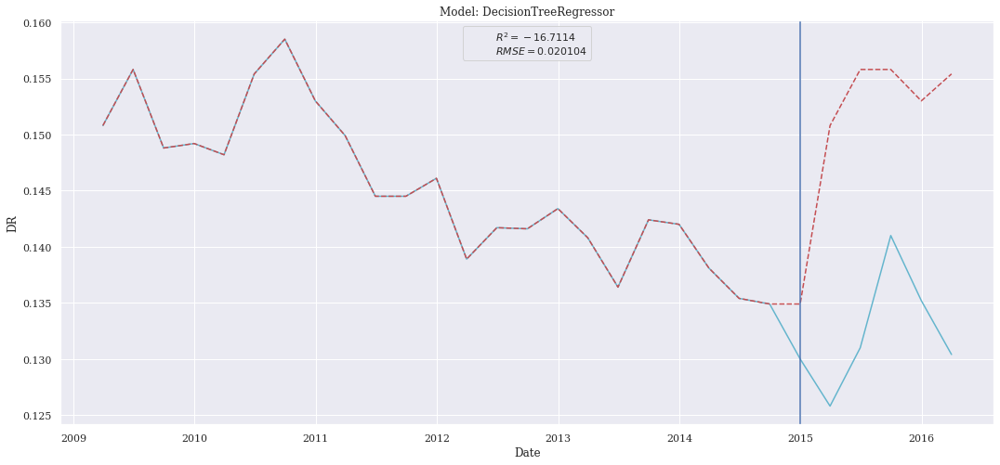

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


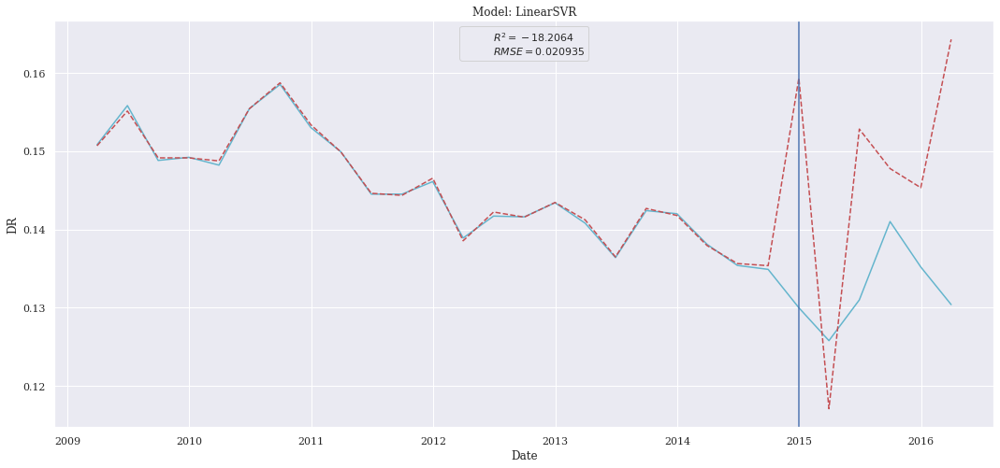

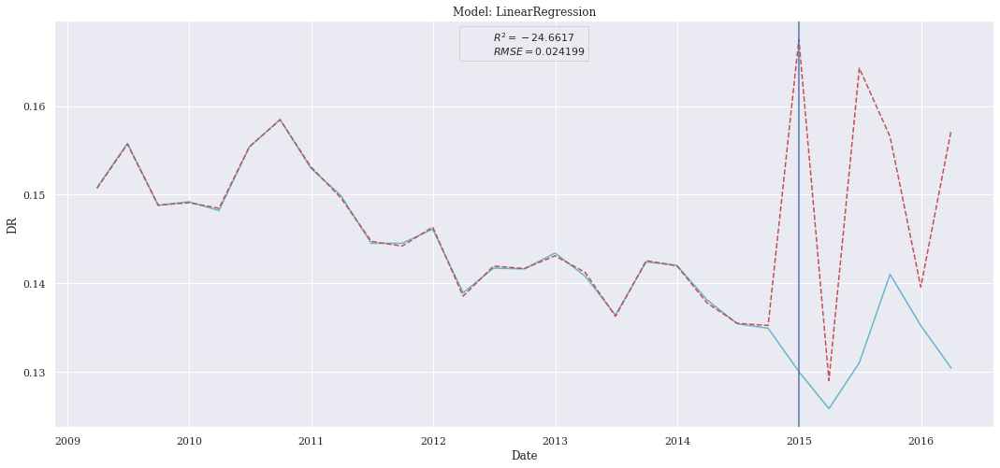

In [46]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## Final Conclusion
The best models are:
- KNeighborsRegressor with selectFromModel features
- Ridge with selectFromModel features

# Focus on Chronique Totale

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [71]:
chronique=b'Totale'
start = 1
norm = "MinMax"
split = 0.2
period = 12
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train,X_test], axis=1).index

### Correlation Features

In [8]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique=chronique,col_used=cl.col_totale_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.001955,0.000004,0.001948,-21.527830
CatBoostRegressor,0.002132,0.000005,0.002127,-25.789062
Ridge,0.002197,0.000005,0.002187,-27.454496
XGBRegressor,0.002224,0.000005,0.002217,-28.158112
DecisionTreeRegressor,0.002407,0.000006,0.002400,-33.150943
LinearRegression,0.004117,0.000017,0.003690,-98.915170
LinearSVR,0.004233,0.000018,0.003966,-104.654239


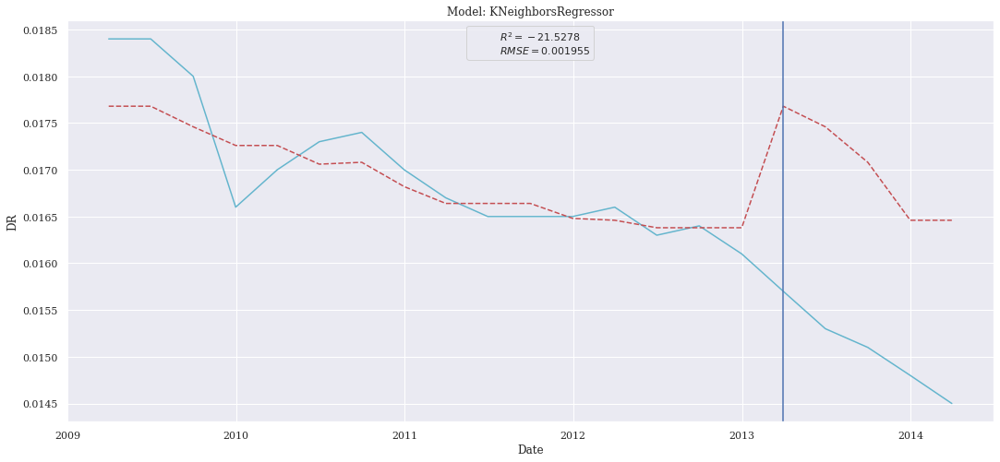

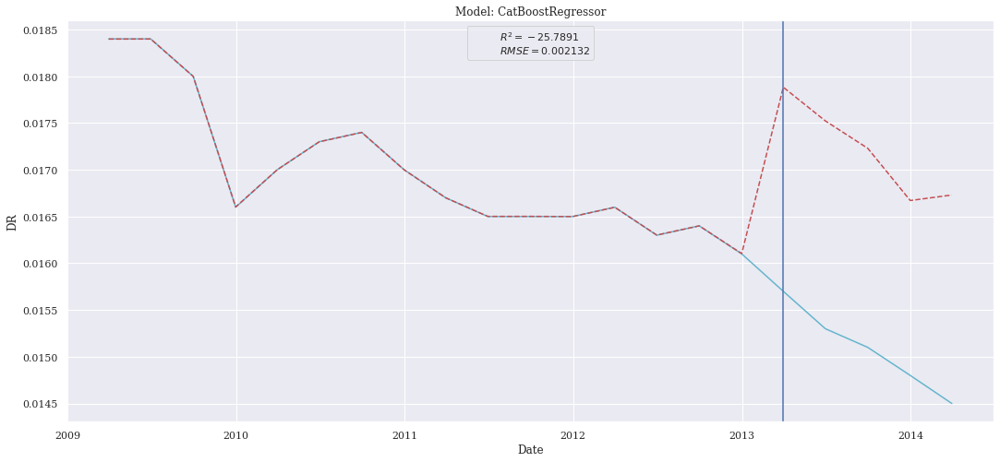

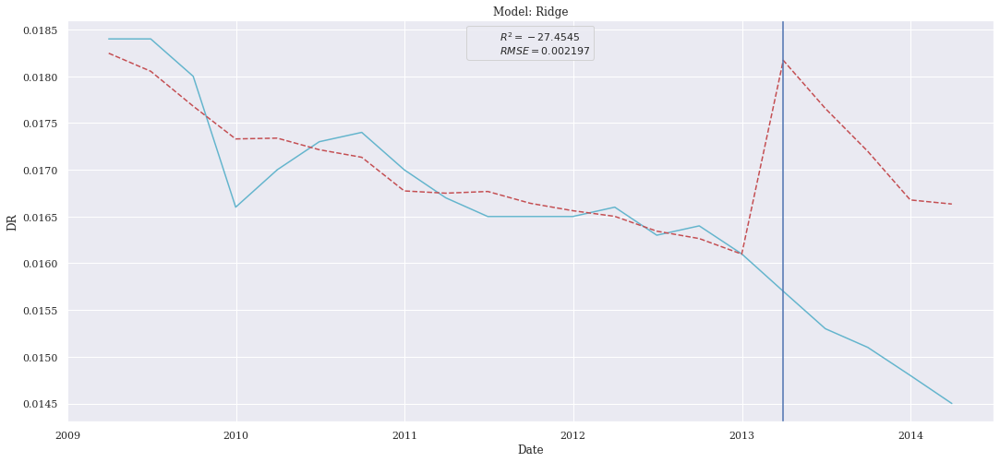

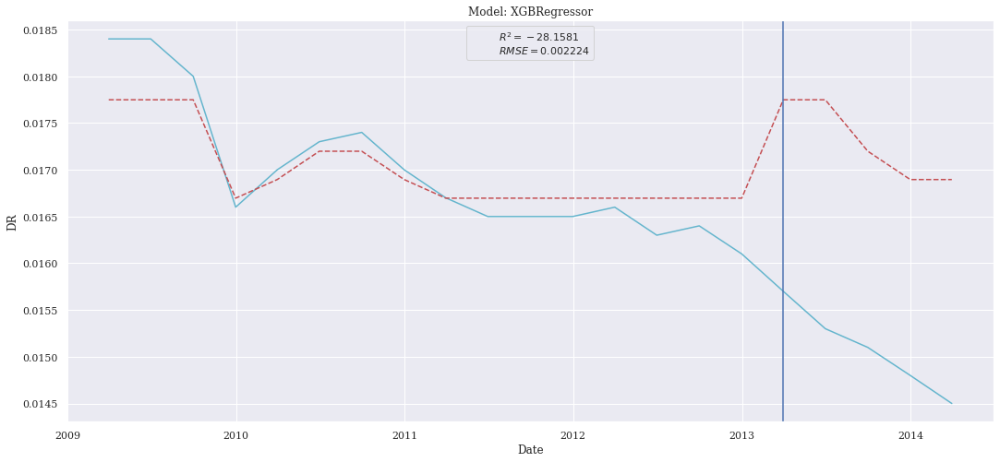

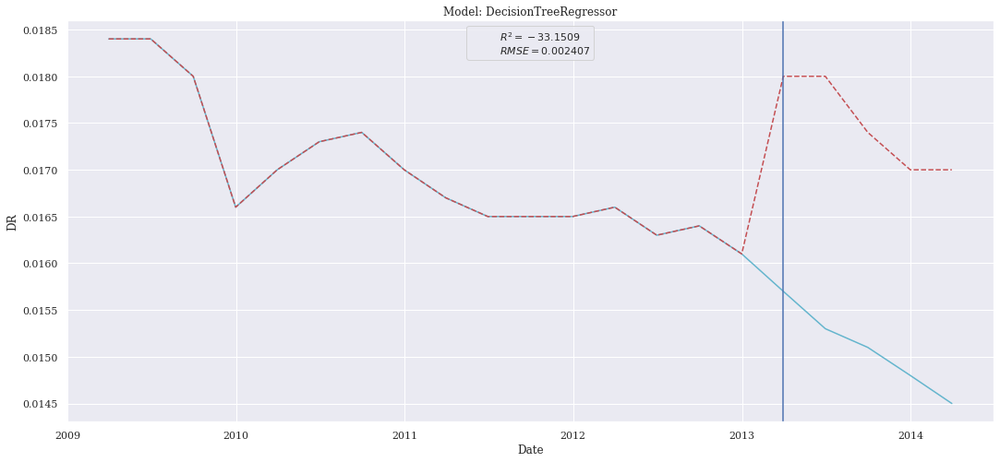

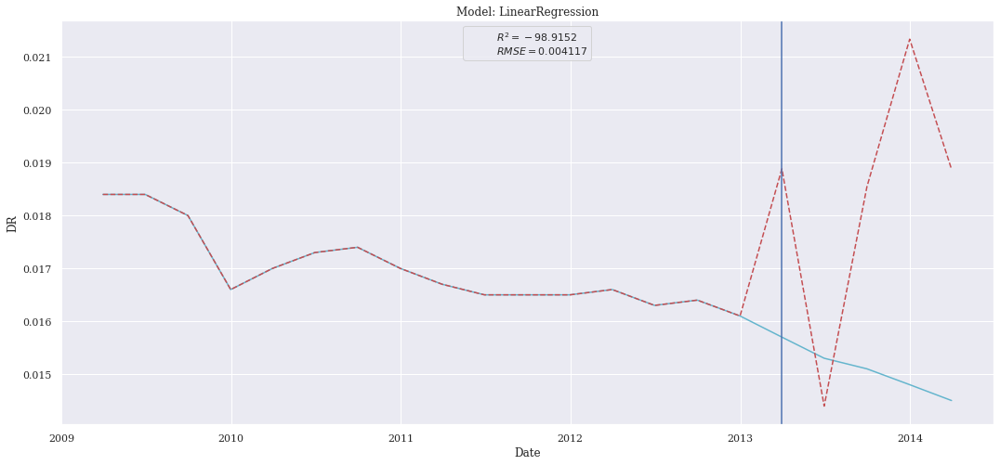

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


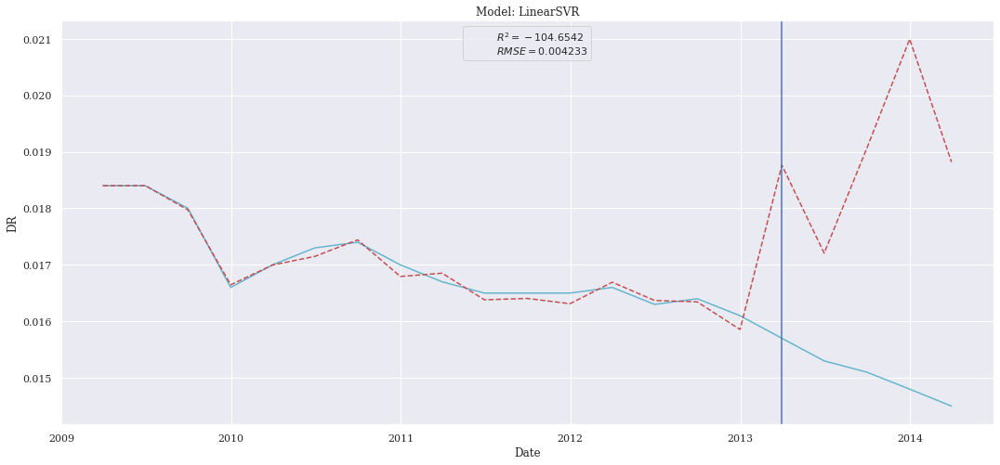

In [9]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [10]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period, chronique,col_used=cl.col_totale_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001748,0.000003,0.001423,-17.020730
CatBoostRegressor,0.002017,0.000004,0.001975,-22.983543
LinearRegression,0.002035,0.000004,0.001936,-23.413739
KNeighborsRegressor,0.002053,0.000004,0.001988,-23.852358
Ridge,0.002174,0.000005,0.002071,-26.860057
XGBRegressor,0.002208,0.000005,0.002187,-27.755045
DecisionTreeRegressor,0.002472,0.000006,0.002340,-35.025943


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


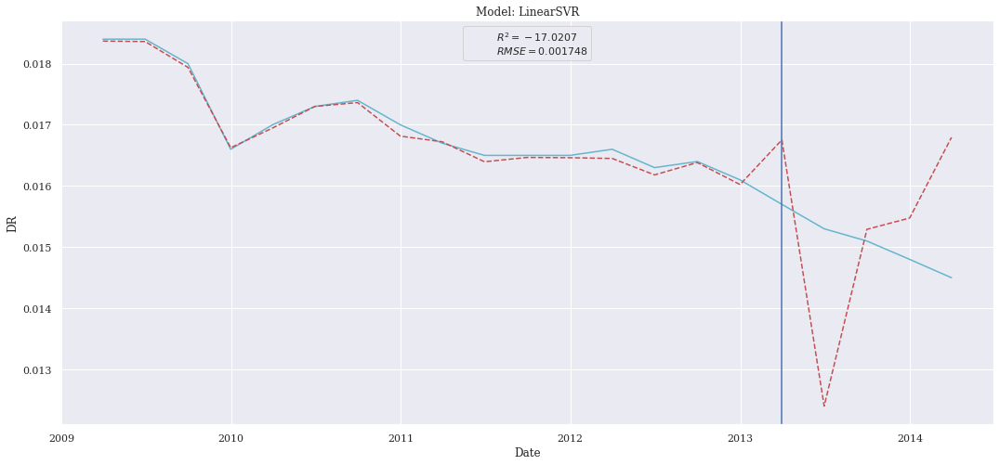

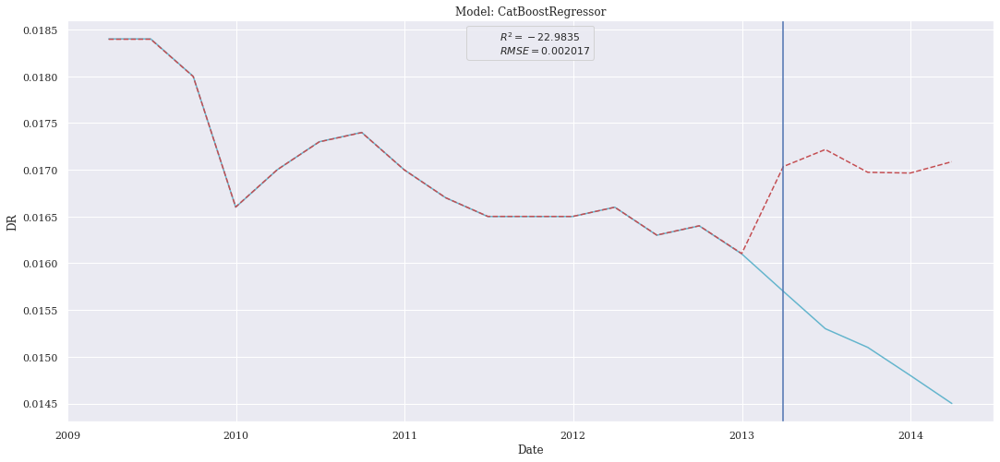

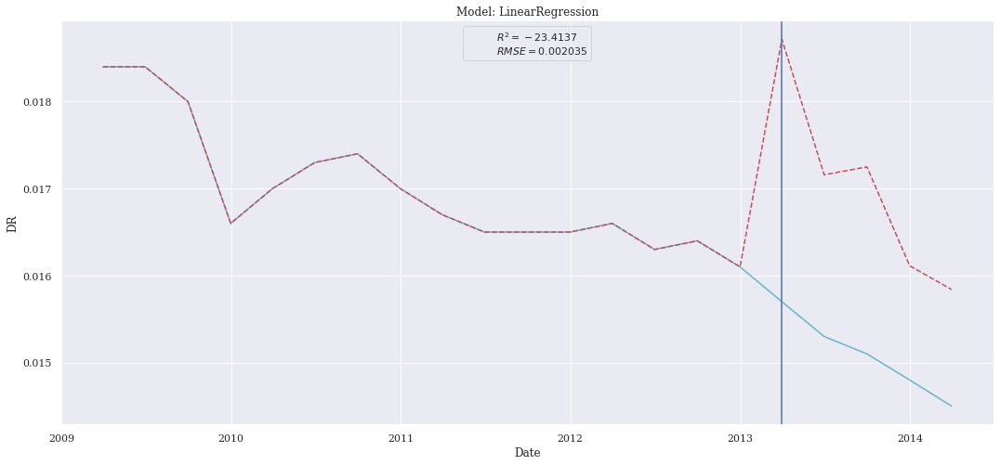

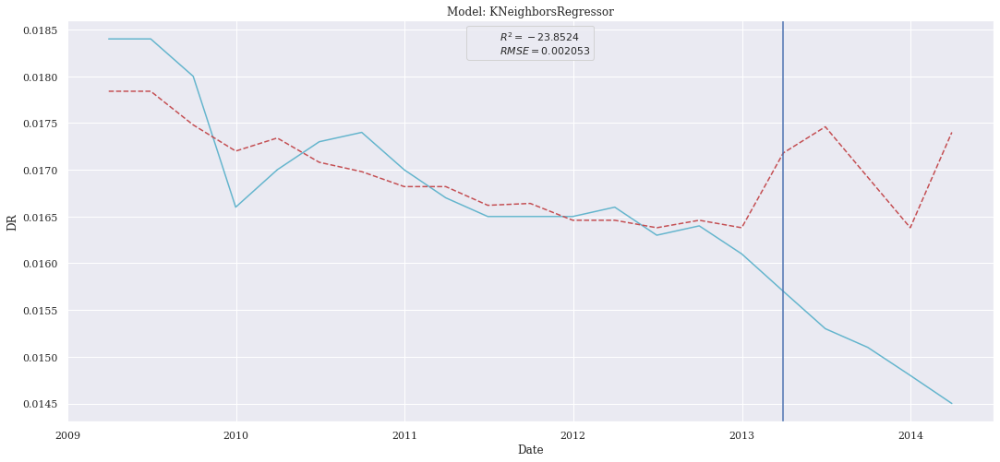

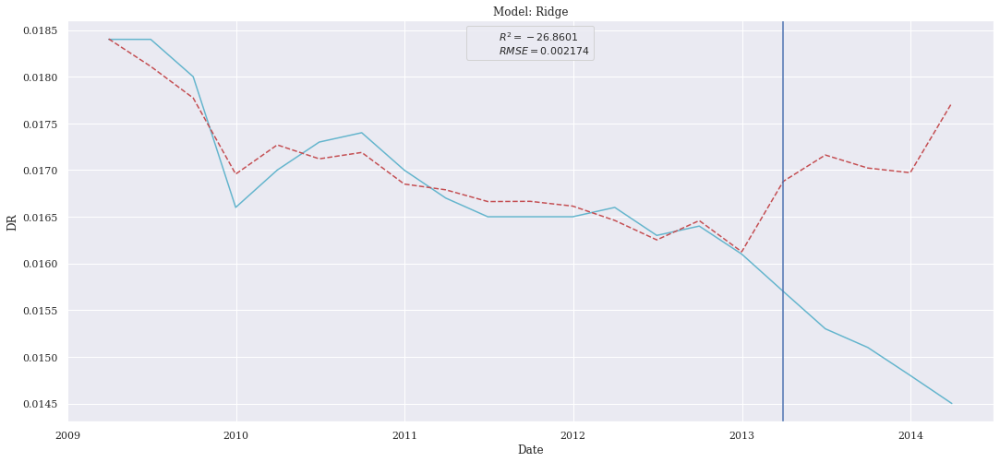

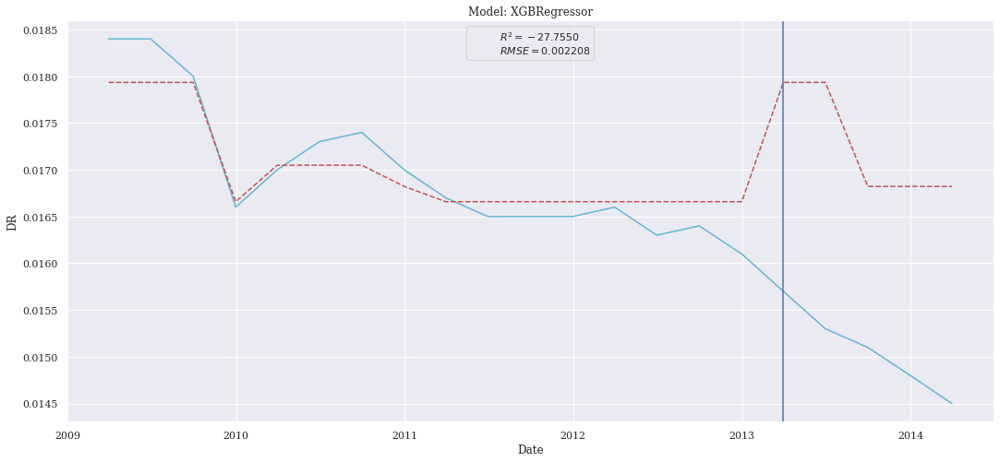

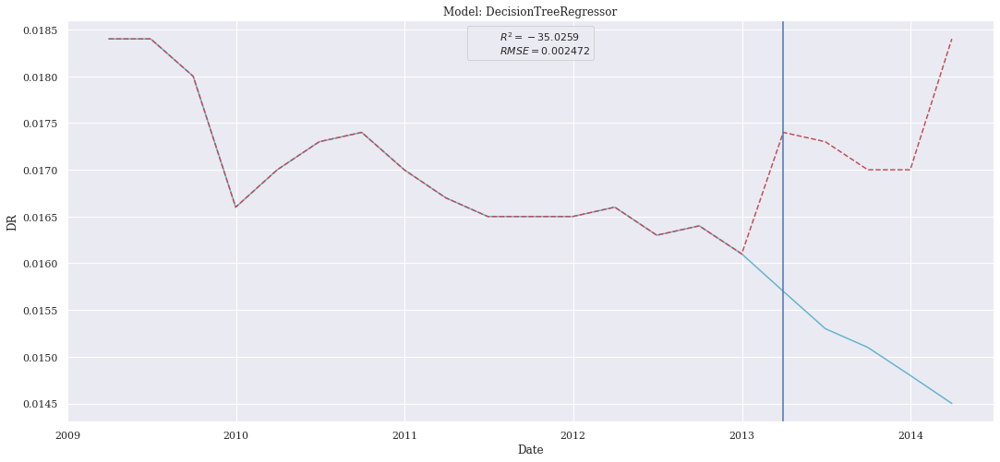

In [12]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [ ]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_totale_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.002494,0.000006,0.002412,-35.688208
Ridge,0.002534,0.000006,0.002493,-36.853754
CatBoostRegressor,0.002589,0.000007,0.002549,-38.513171
DecisionTreeRegressor,0.002598,0.000007,0.002260,-38.799528
XGBRegressor,0.002736,0.000007,0.002699,-43.123570
LinearSVR,0.003336,0.000011,0.003163,-64.620406
LinearRegression,0.004564,0.000021,0.002804,-121.797795


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


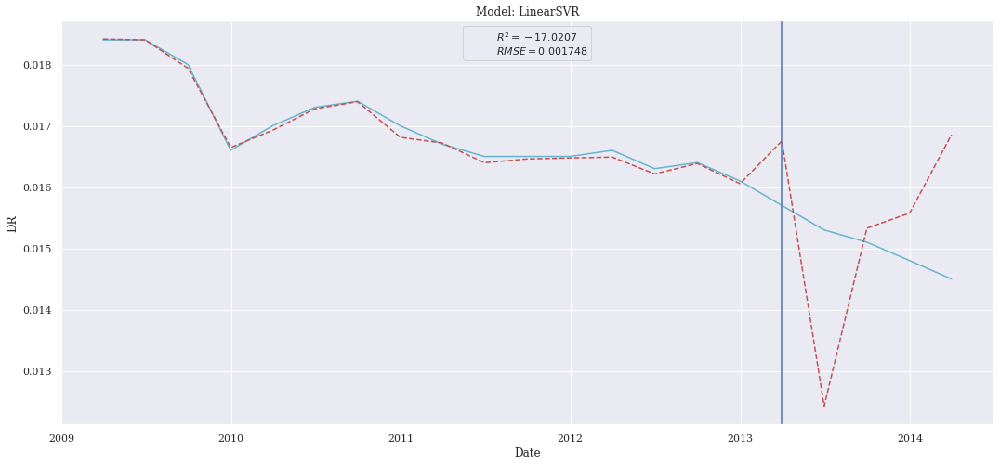

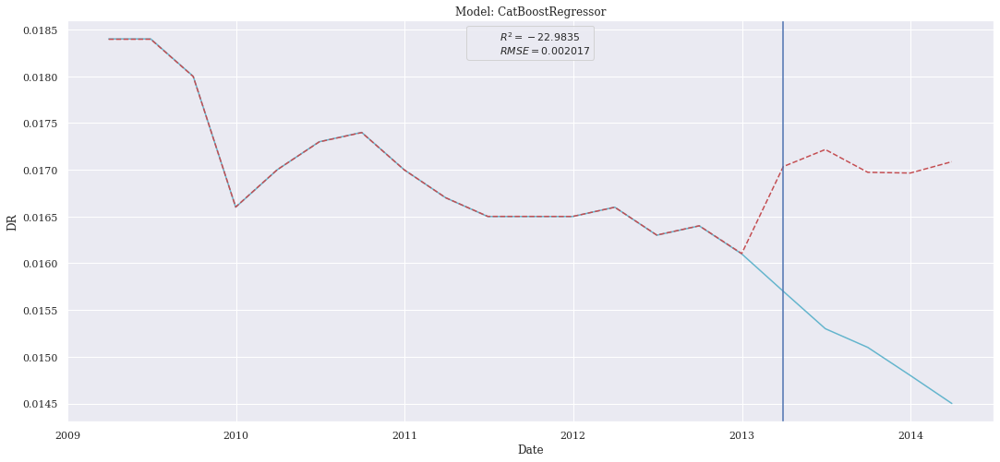

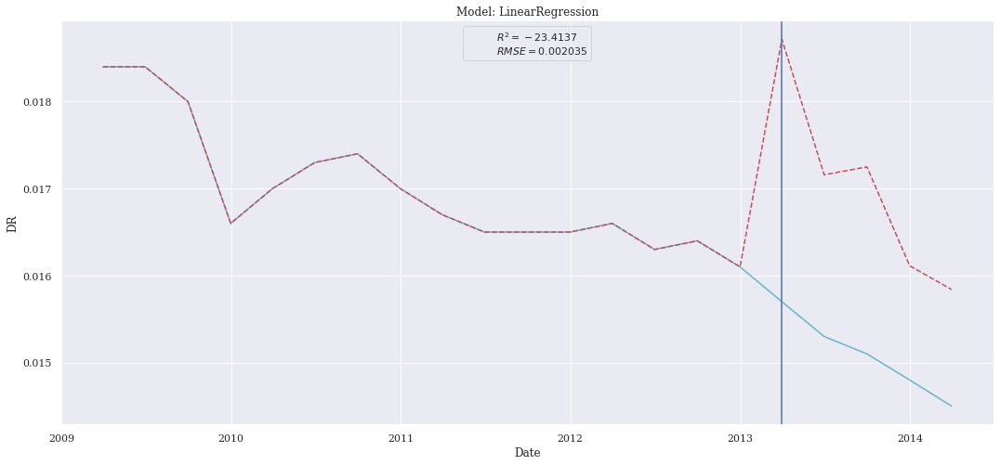

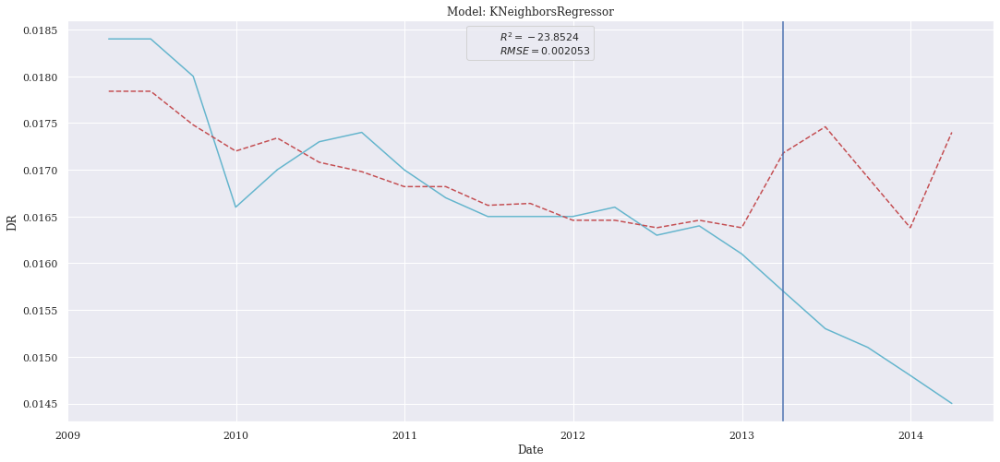

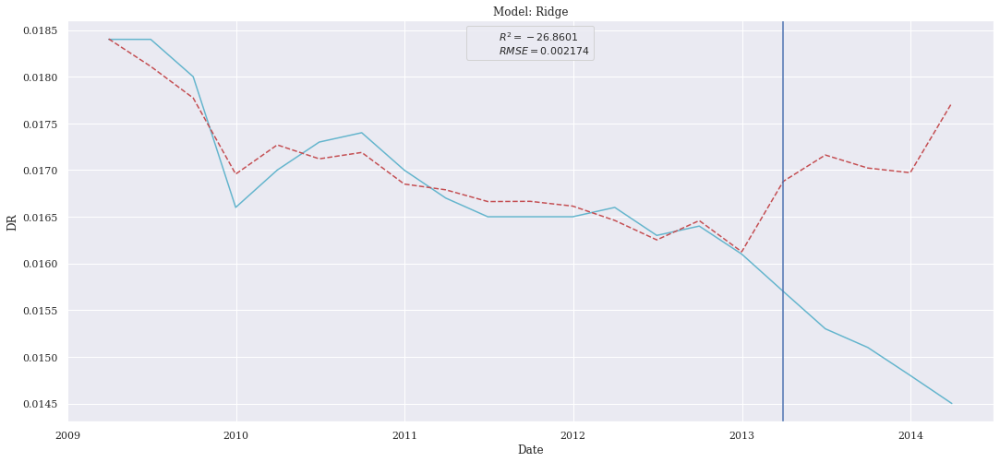

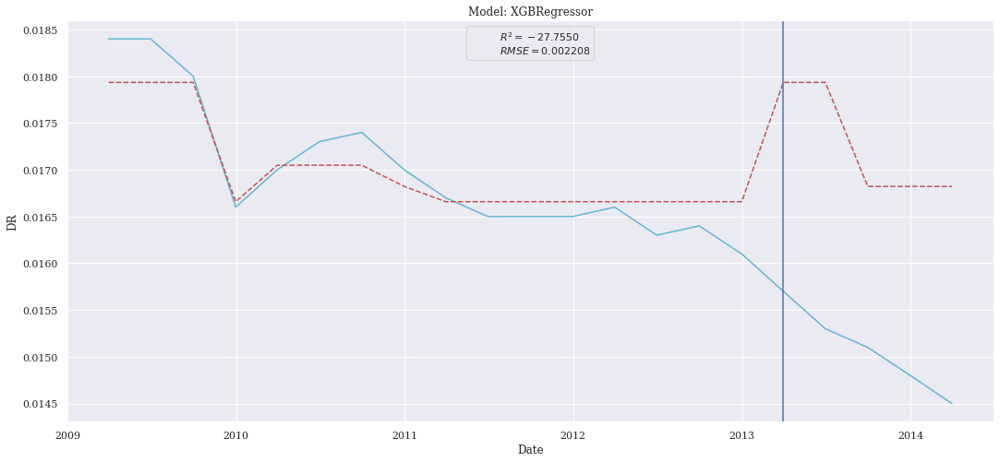

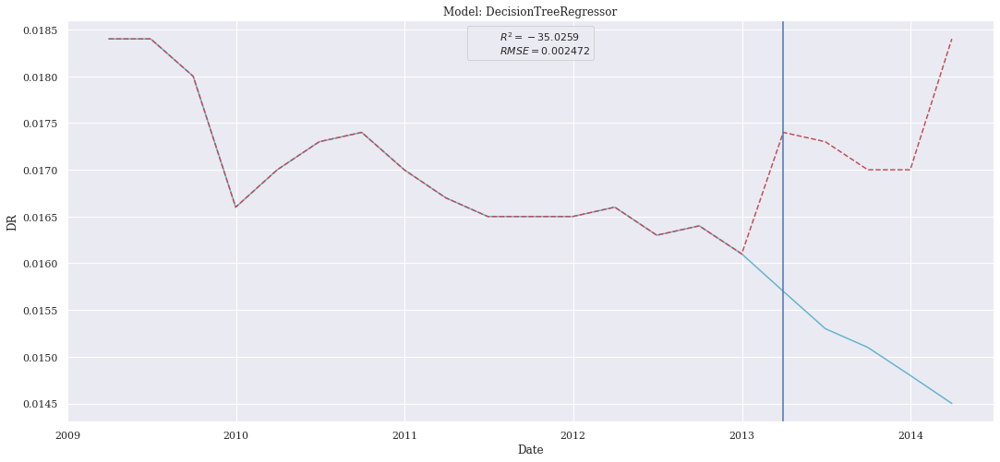

In [13]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [14]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period, chronique,col_used=cl.col_totale_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001374,0.000002,0.001112,-10.131380
LinearRegression,0.001733,0.000003,0.001530,-16.712162
KNeighborsRegressor,0.002014,0.000004,0.001964,-22.921226
CatBoostRegressor,0.002077,0.000004,0.002040,-24.438748
Ridge,0.002147,0.000005,0.002091,-26.184783
XGBRegressor,0.002208,0.000005,0.002187,-27.755045
DecisionTreeRegressor,0.002472,0.000006,0.002460,-35.025943


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


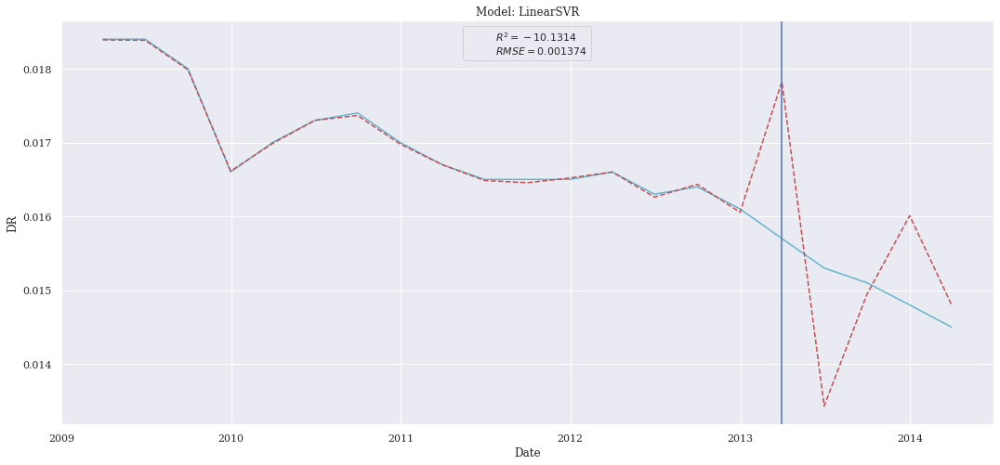

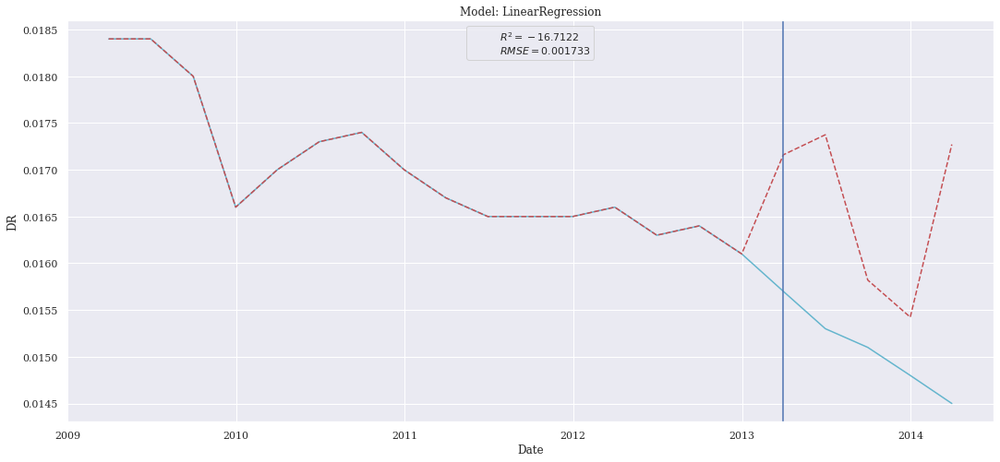

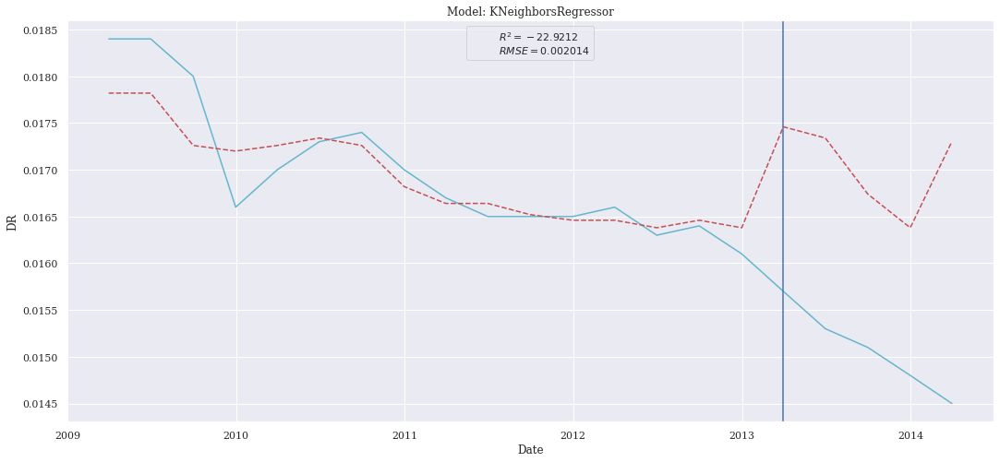

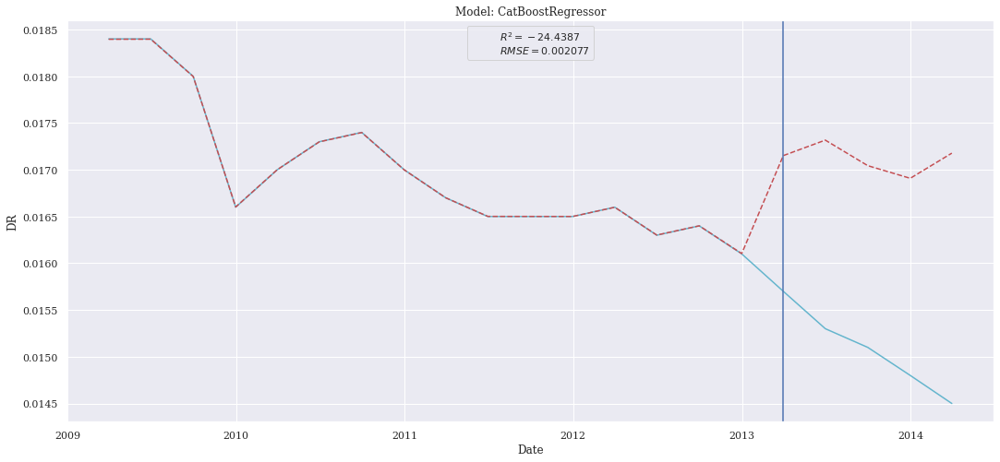

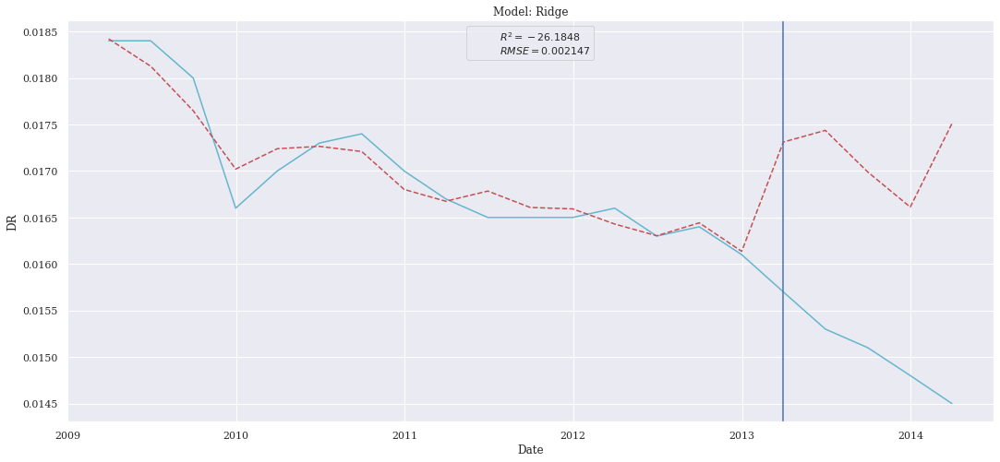

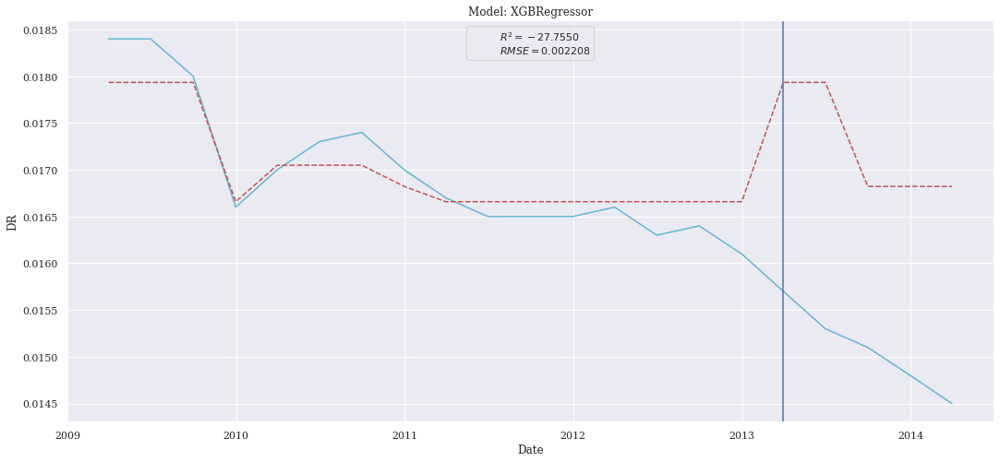

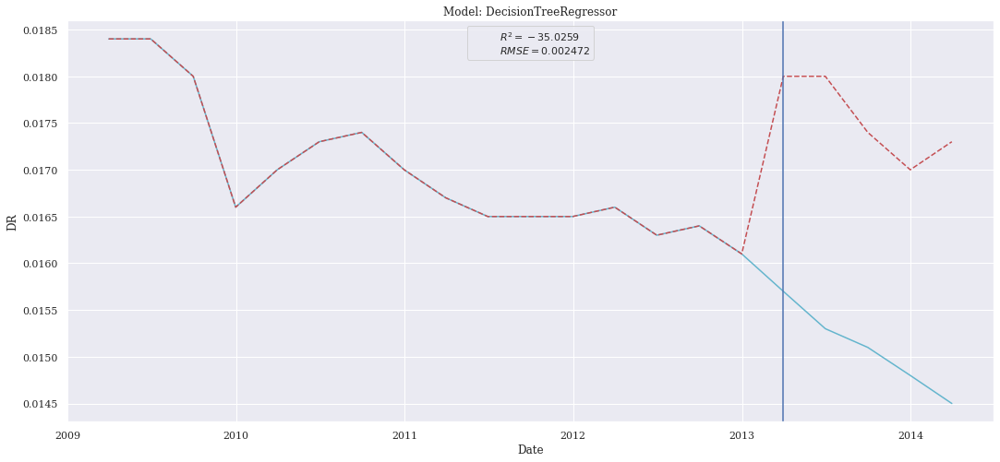

In [16]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [ ]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period,chronique,col_used=cl.col_totale_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001774,0.000003,0.001555,-17.550539
KNeighborsRegressor,0.001999,0.000004,0.001988,-22.572170
Ridge,0.002136,0.000005,0.002075,-25.890414
CatBoostRegressor,0.002191,0.000005,0.002175,-27.302359
LinearRegression,0.002302,0.000005,0.001939,-30.248124
DecisionTreeRegressor,0.002628,0.000007,0.002500,-39.719340
XGBRegressor,0.002660,0.000007,0.002576,-40.703862


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


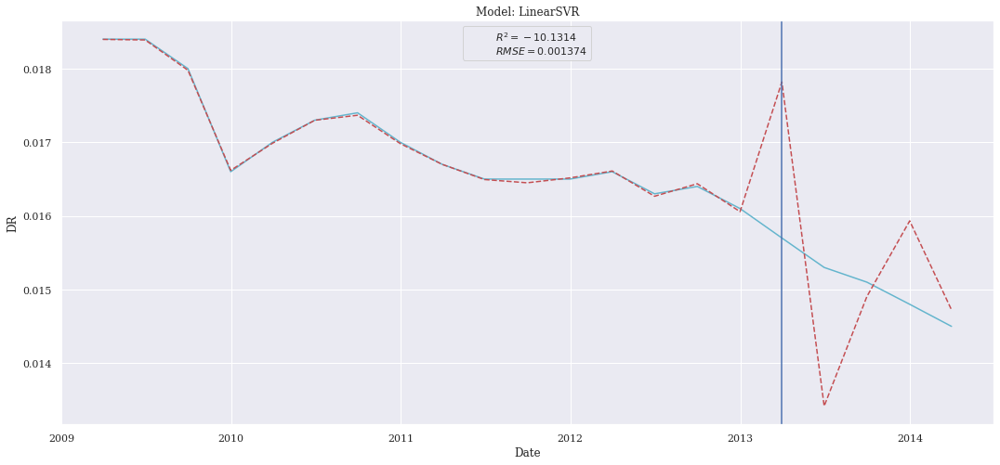

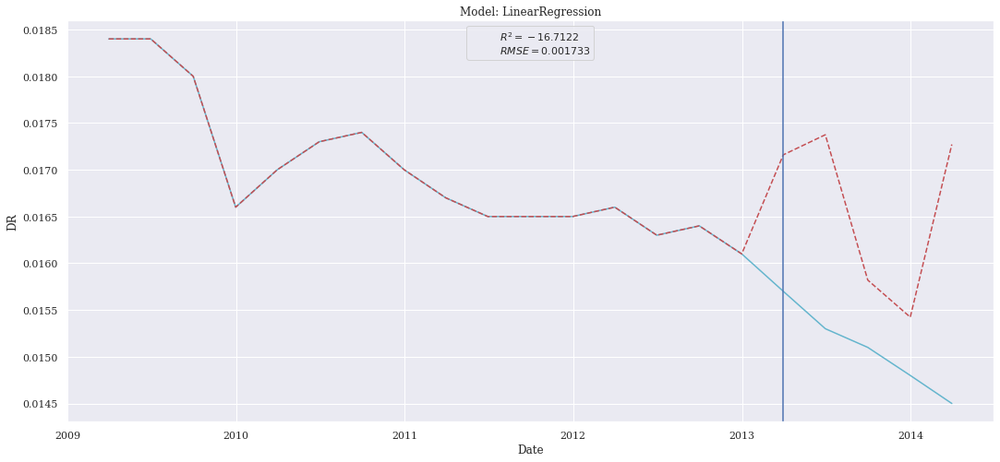

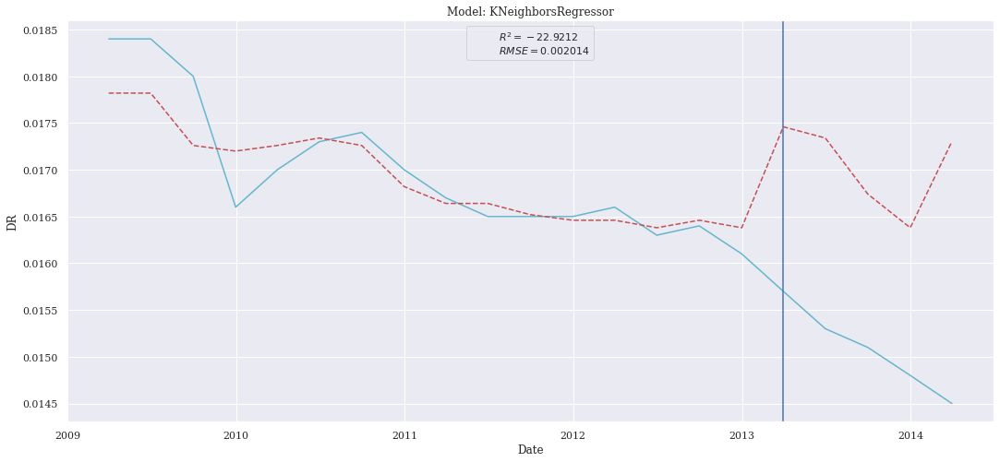

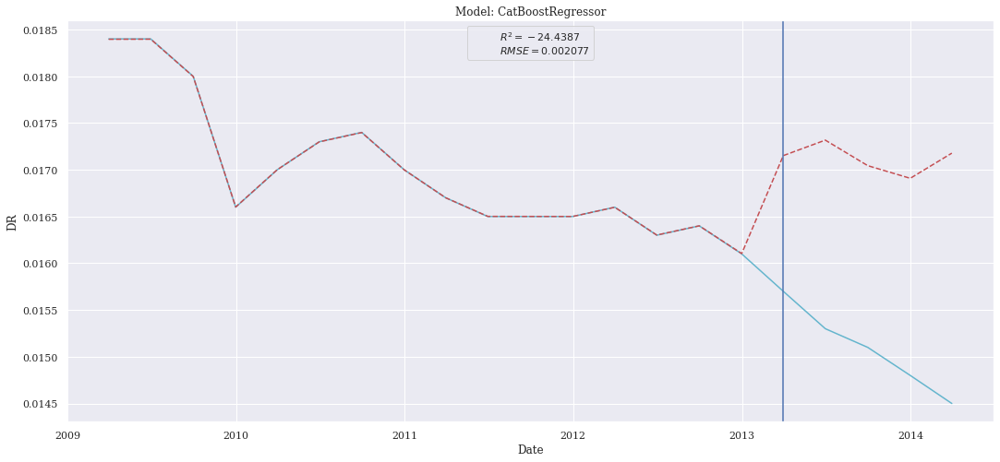

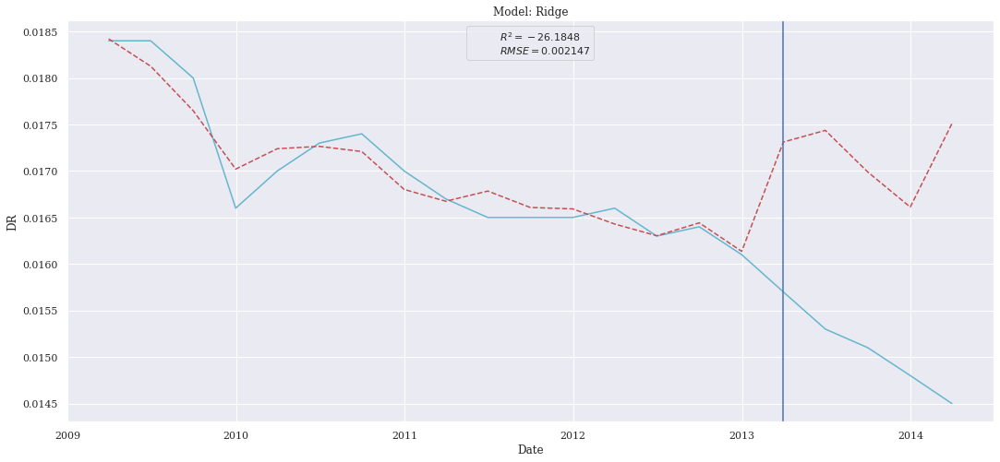

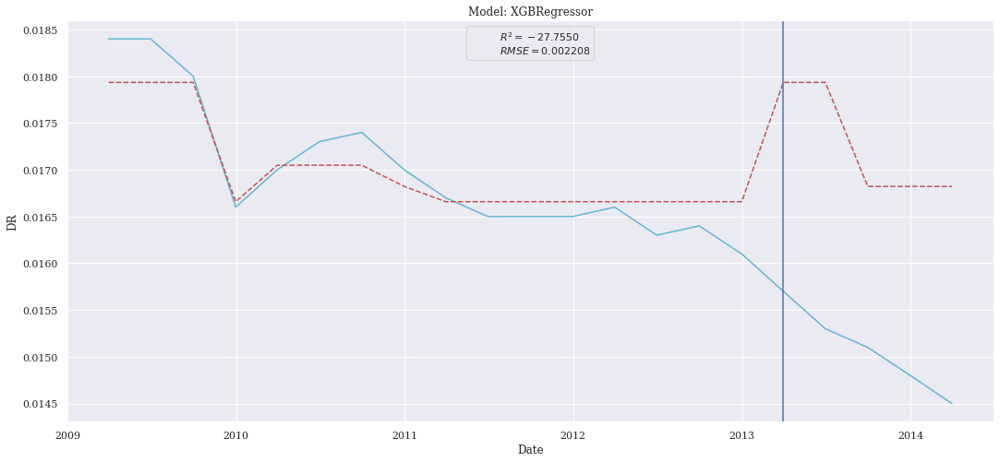

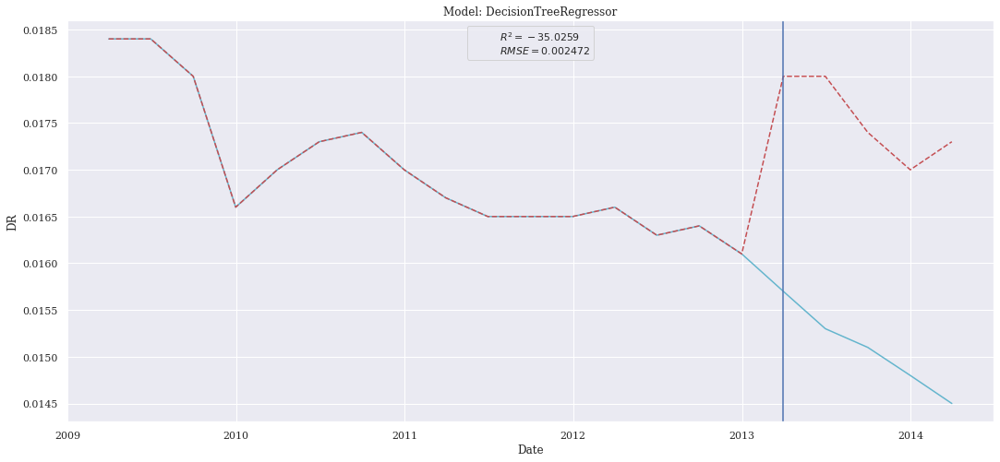

In [17]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [18]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period, chronique,col_used=cl.col_totale_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.001831,0.000003,0.001828,-18.768396
CatBoostRegressor,0.001996,0.000004,0.001982,-22.490281
Ridge,0.002006,0.000004,0.001996,-22.735183
XGBRegressor,0.002059,0.000004,0.002056,-24.005557
DecisionTreeRegressor,0.002326,0.000005,0.002280,-30.886792
LinearRegression,0.002365,0.000006,0.001990,-31.980646
LinearSVR,0.004858,0.000024,0.004489,-138.166898


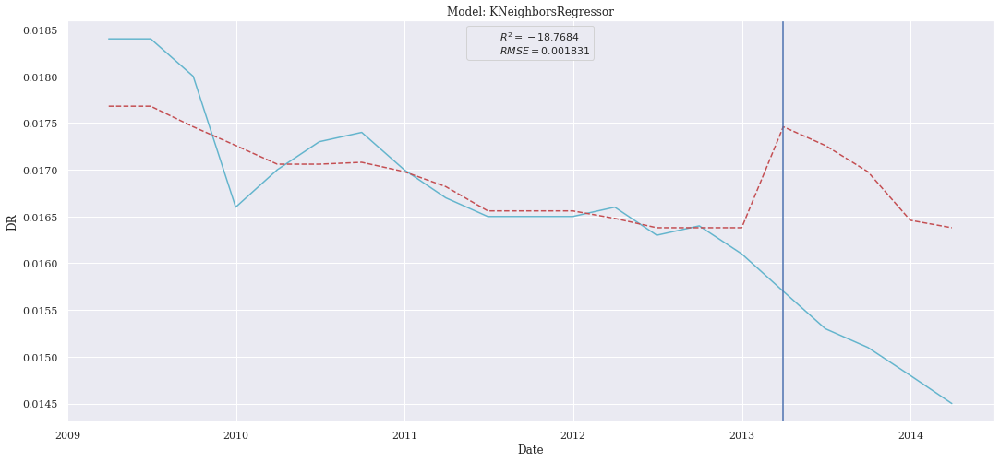

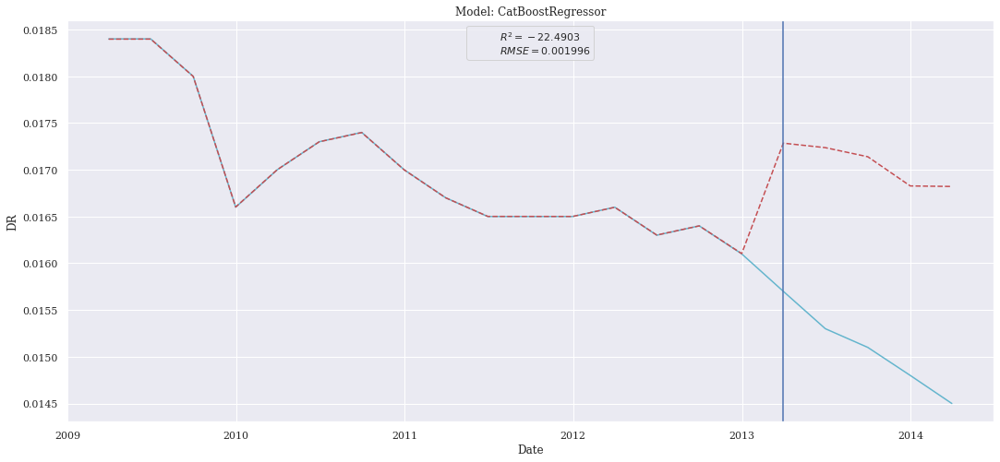

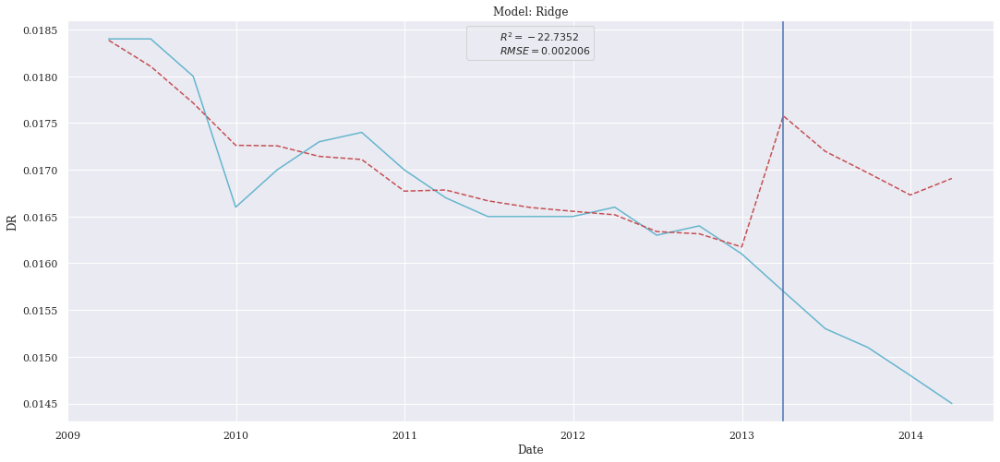

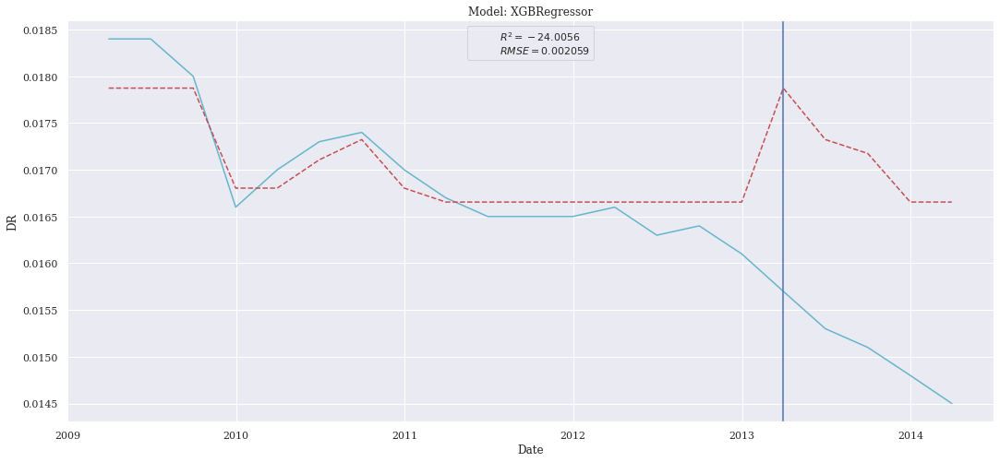

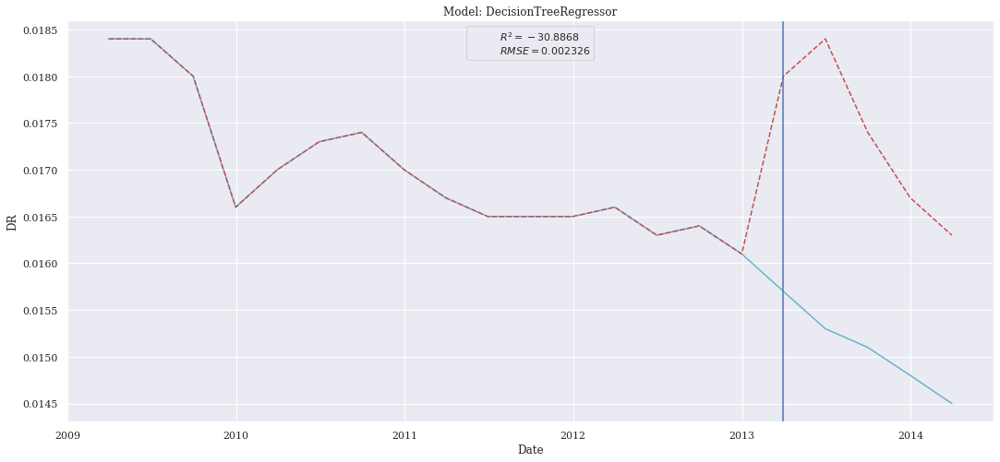

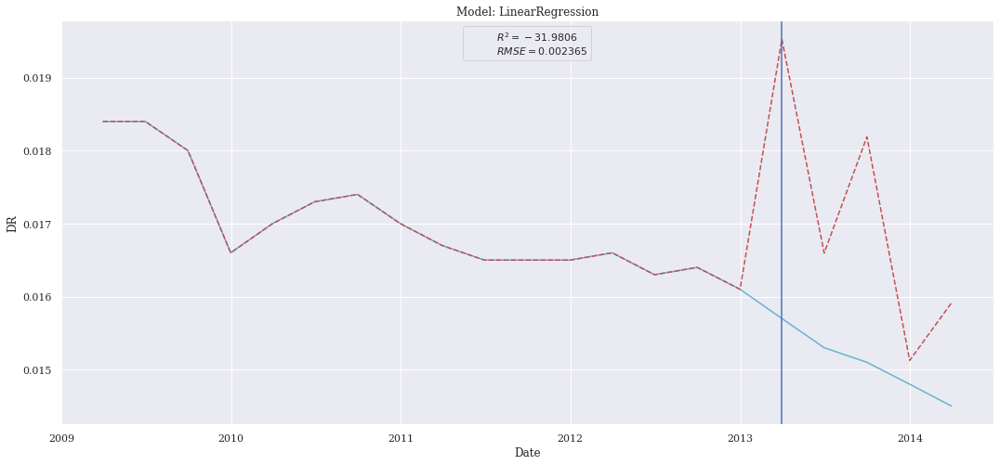

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


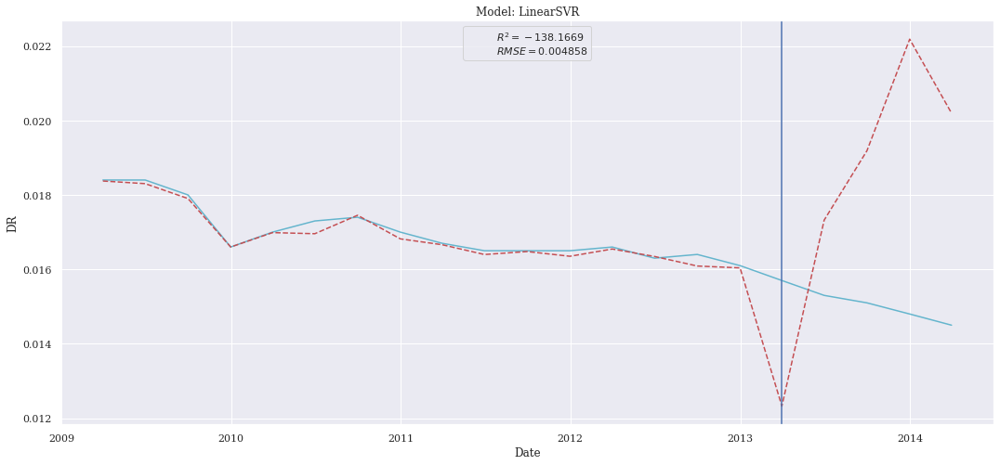

In [19]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [20]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period,chronique,col_used=cl.col_totale_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001475,0.000002,0.000998,-11.832500
CatBoostRegressor,0.002068,0.000004,0.002032,-24.204403
XGBRegressor,0.002179,0.000005,0.002166,-26.988797
Ridge,0.002243,0.000005,0.002212,-28.664437
LinearRegression,0.002309,0.000005,0.002208,-30.424015
KNeighborsRegressor,0.002312,0.000005,0.002304,-30.512264
DecisionTreeRegressor,0.002395,0.000006,0.002340,-32.808962


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


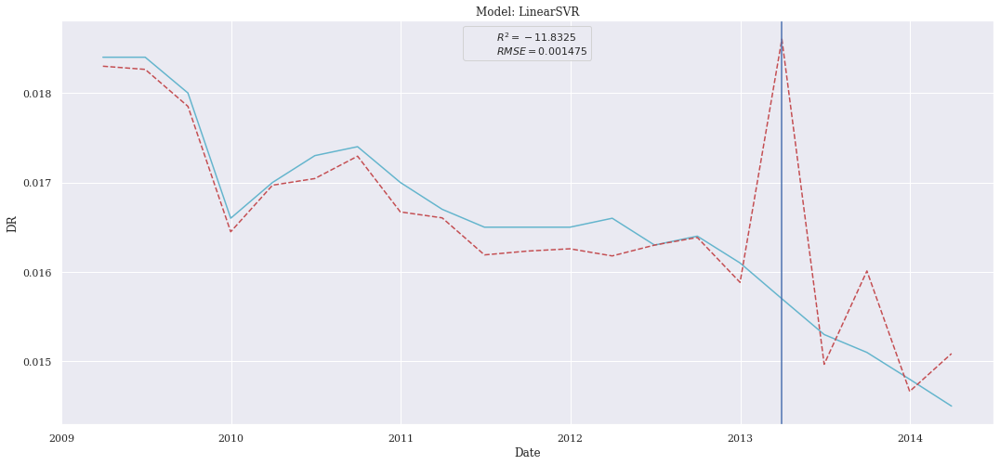

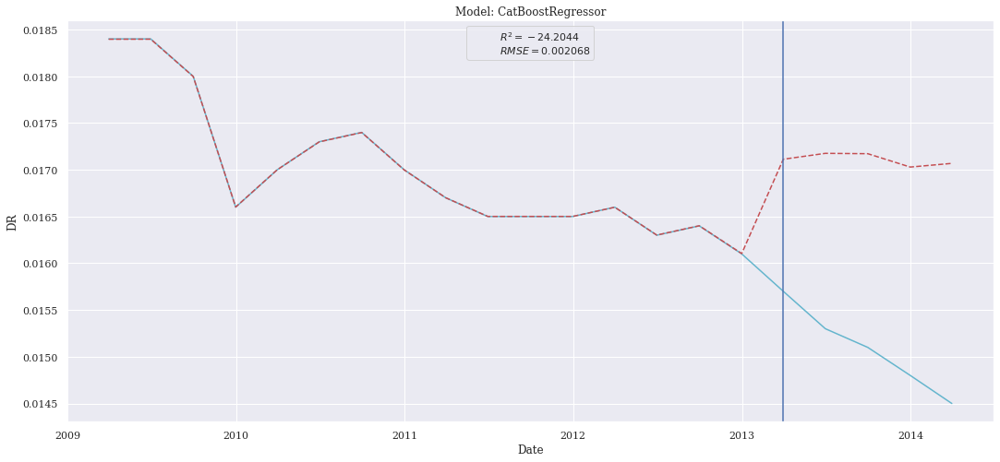

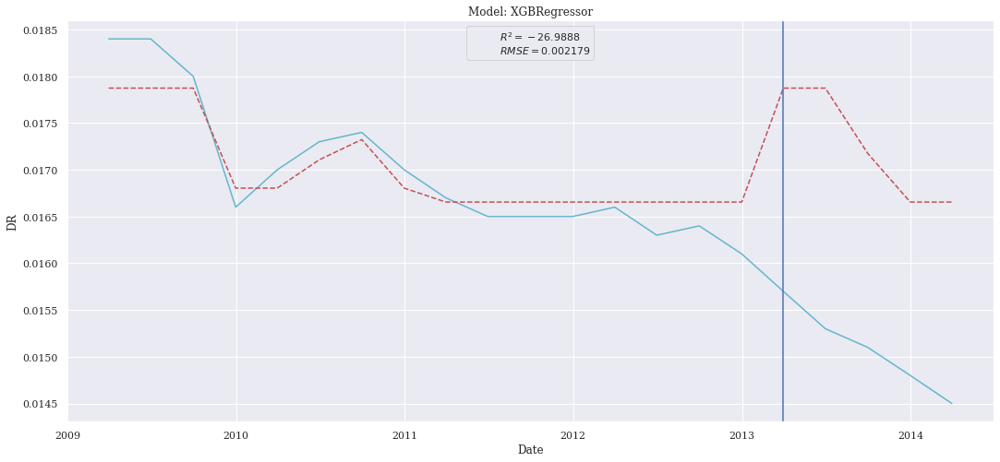

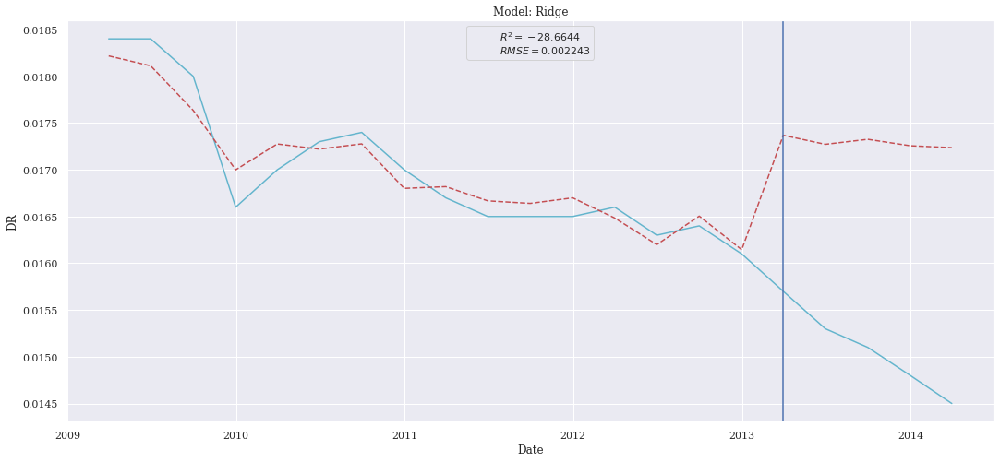

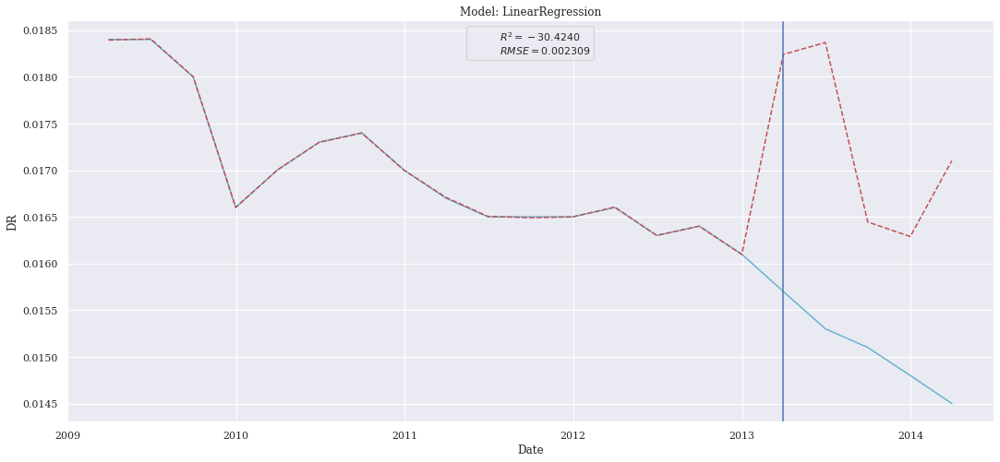

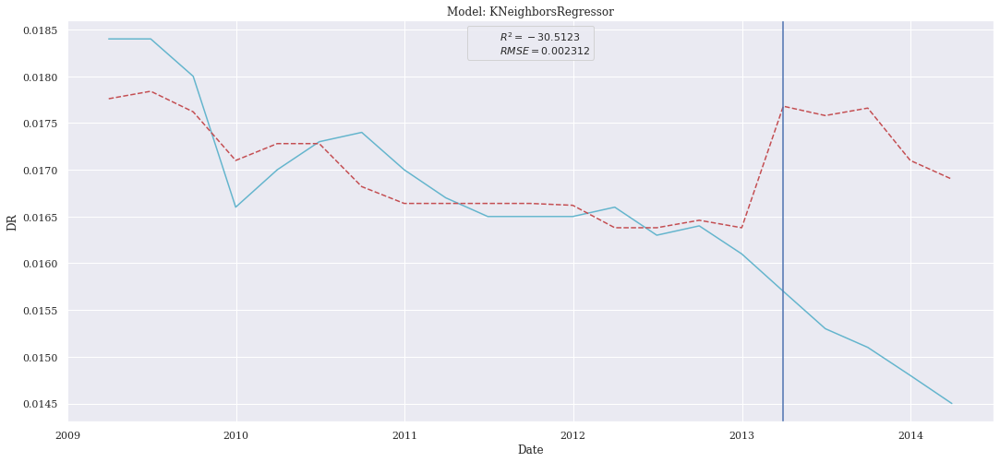

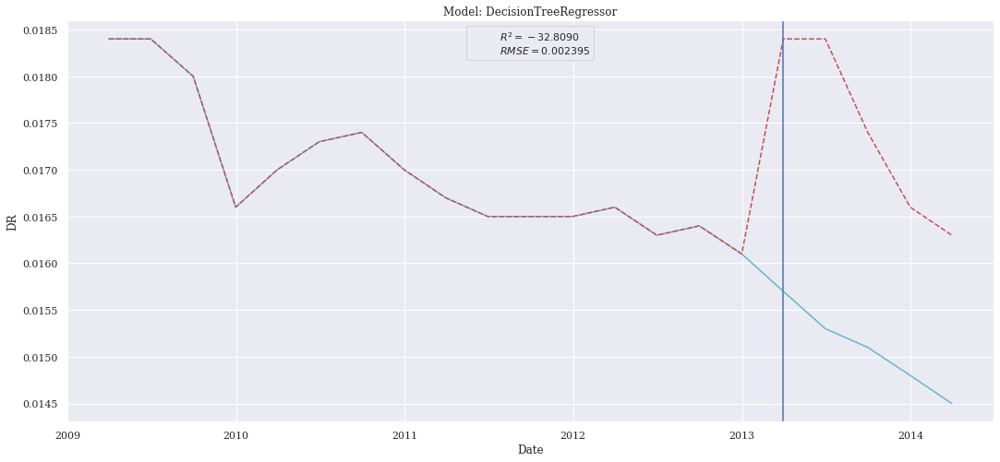

In [21]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [22]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start, period,chronique,col_used=cl.col_totale_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearRegression,0.001420,0.000002,0.001142,-10.881789
CatBoostRegressor,0.001977,0.000004,0.001937,-22.044759
KNeighborsRegressor,0.001983,0.000004,0.001948,-22.179717
Ridge,0.002108,0.000004,0.002018,-25.199504
XGBRegressor,0.002108,0.000004,0.002010,-25.208799
DecisionTreeRegressor,0.002387,0.000006,0.002300,-32.596698
LinearSVR,0.002529,0.000006,0.001844,-36.702231


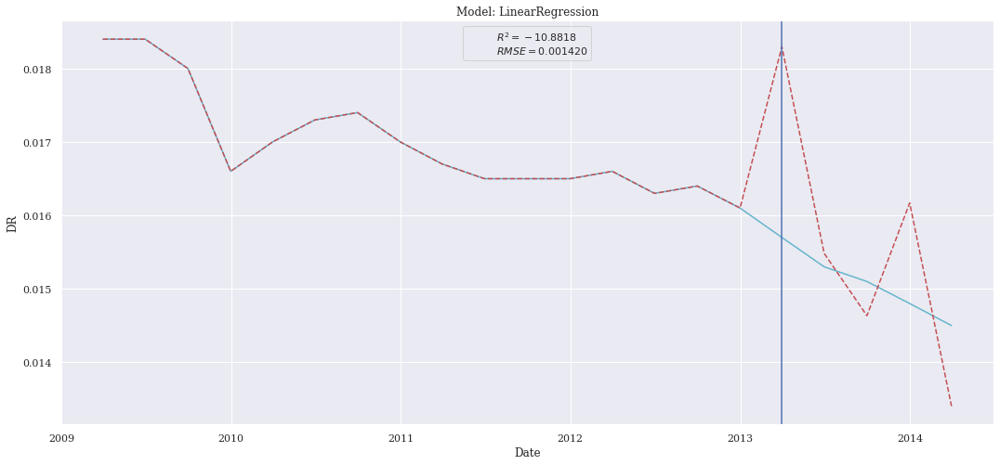

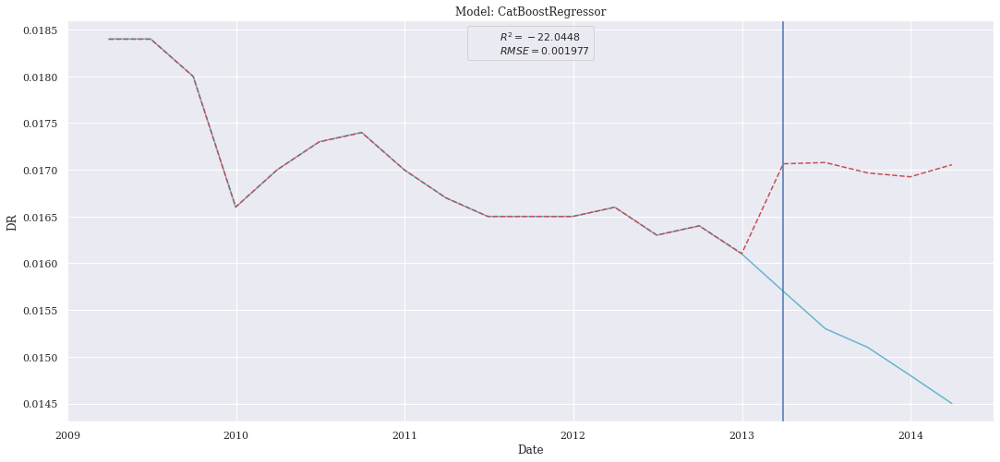

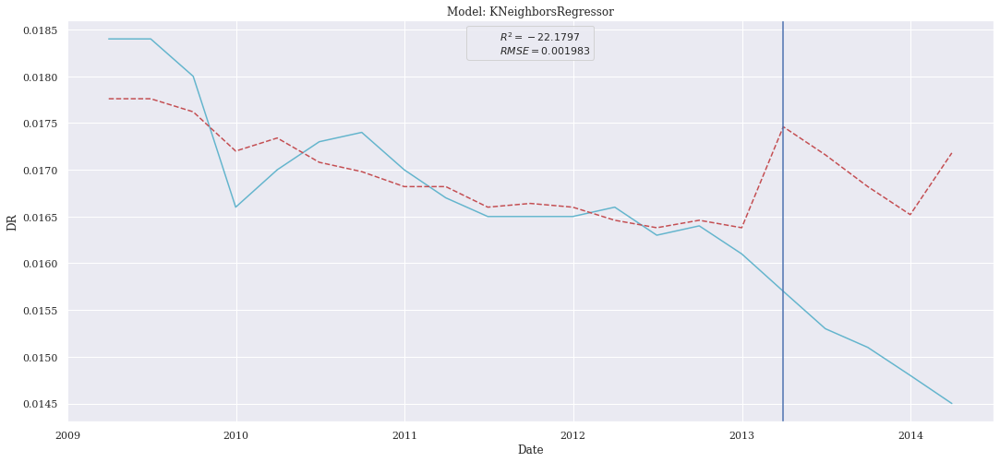

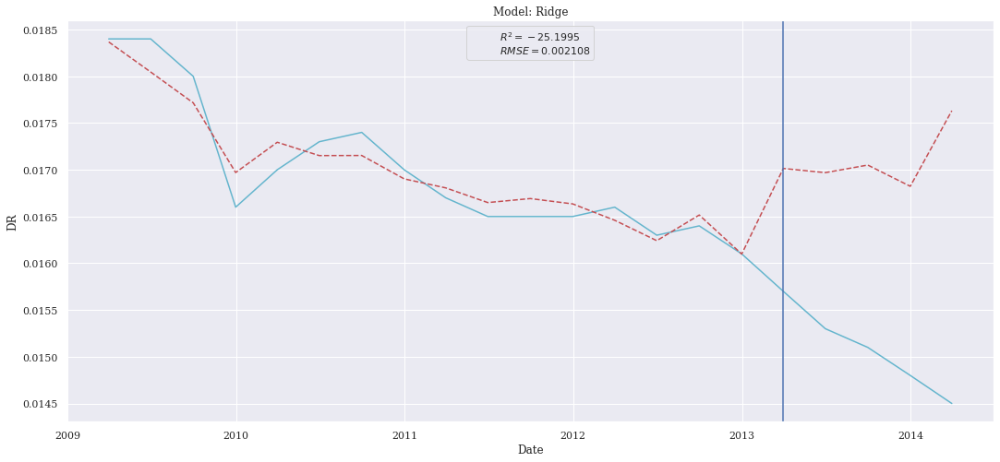

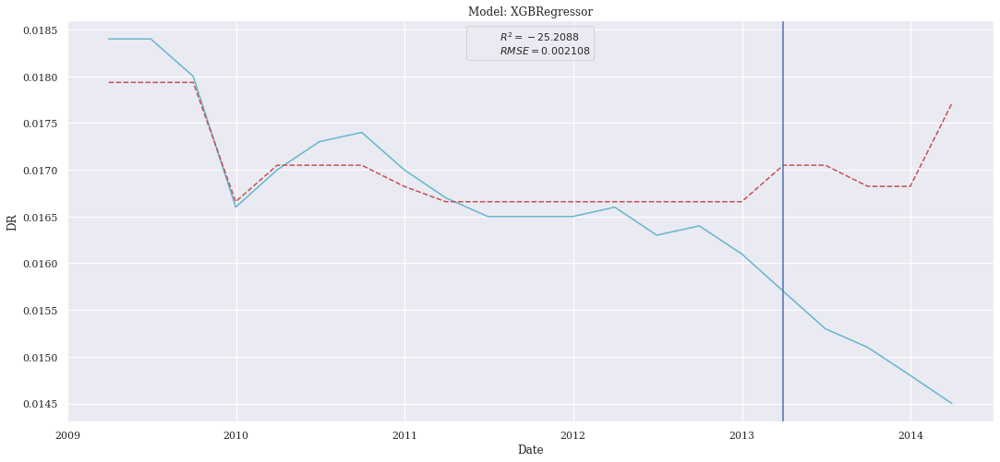

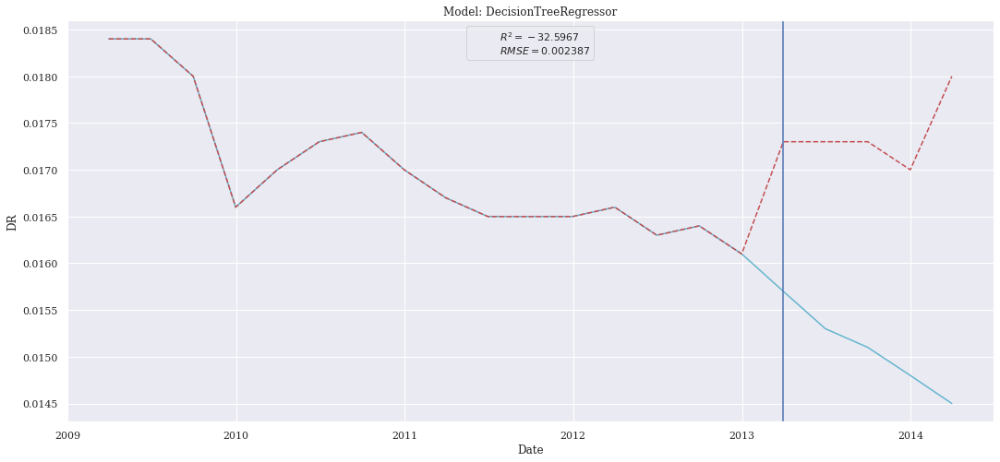

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


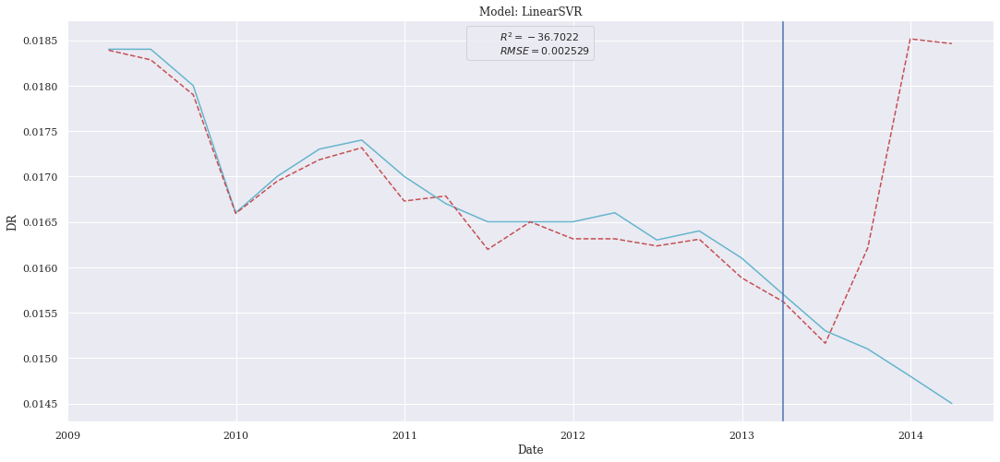

In [23]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## Final Conclusion
The best models are:
- LinearSVR with recursive features
- Linear Regression with sequential backward features
- LinearSVR with sequential forward features

# Model to keep

## CHR2

In [45]:
chronique=b'CHR2'
start = 1
period = 12
norm = "MinMax"
split = 0.2

In [56]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_seq_for,split=split,norm=norm)
index = pd.concat([X_train, X_test,X_validation], axis=1).index
summary = summary_ml(X_train,y_train,X_test,y_test,models=['svr'])
summary

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.000233,5.408085e-08,0.000197,-0.72293


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


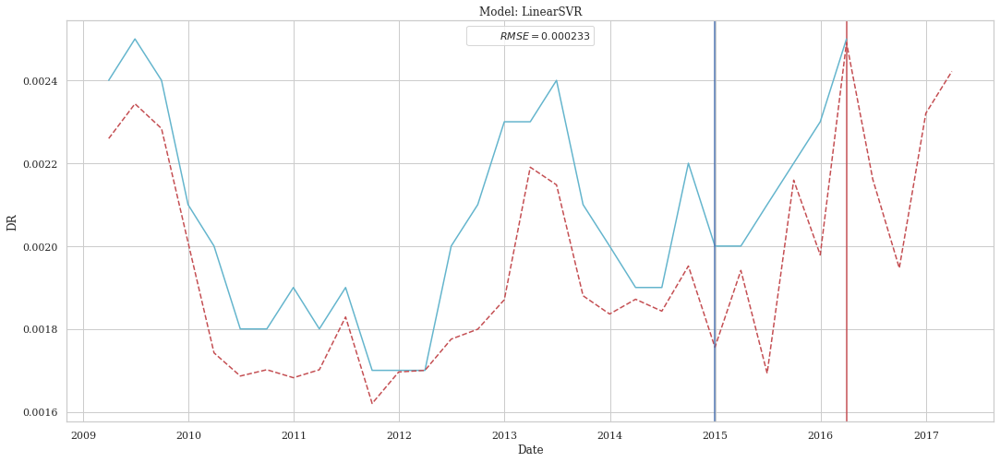

In [57]:

for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  y_validation_pred = y_pred(X_train,y_train,X_validation,y_test=False,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],y_validation=y_validation_pred,period=period,df_score=summary)


In [58]:
print(y_test[-1], y_test_pred[-1], y_validation_pred[-1])

0.0025 0.002491226081948313 0.0024214484269498154


## CHR8

In [83]:
chronique=b'CHR8'
start = 1
period = 12
norm = "MinMax"
split = 0.2

In [84]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_8_sfm,split=split,norm=norm)
index = pd.concat([X_train, X_test,X_validation], axis=1).index
summary = summary_ml(X_train,y_train,X_test,y_test,models=['knn'])
summary

,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.01478,0.000218,0.01329,-8.573458


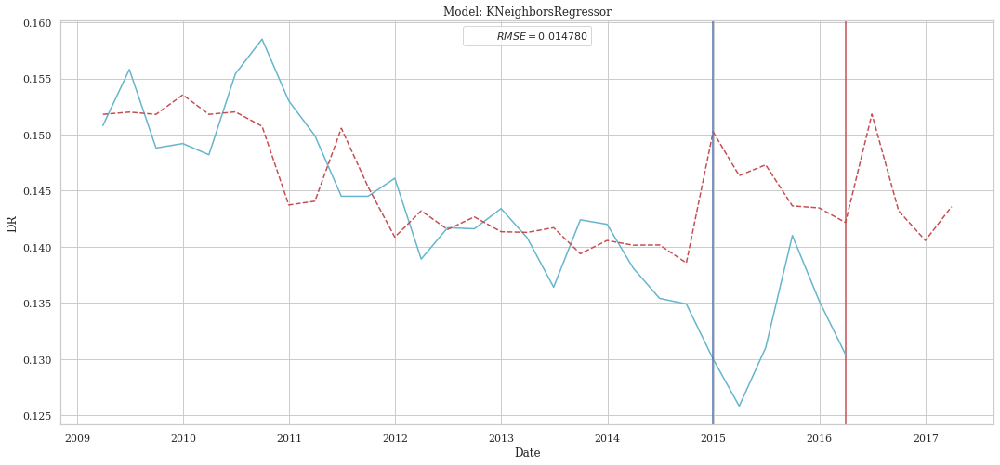

In [85]:

for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  y_validation_pred = y_pred(X_train,y_train,X_validation,y_test=False,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],y_validation=y_validation_pred,period=period,df_score=summary)


In [86]:
print(y_test[-1], y_test_pred[-1], y_validation_pred[-1])

0.1304 0.14216 0.14356


## CHR Total

In [27]:
chronique=b'Totale'
start = 1
period = 12
norm = "MinMax"
split = 0.2

In [ ]:
- LinearSVR with recursive features
- Linear Regression with sequential backward features
- LinearSVR with sequential forward features

In [30]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_totale_recur,split=split,norm=norm)
index = pd.concat([X_train, X_test,X_validation], axis=1).index
summary = summary_ml(X_train,y_train,X_test,y_test,models=['lin'])
summary

,rmse,mse,mae,r2
Index,,,,
LinearRegression,0.003713,0.000014,0.003427,-125.2809


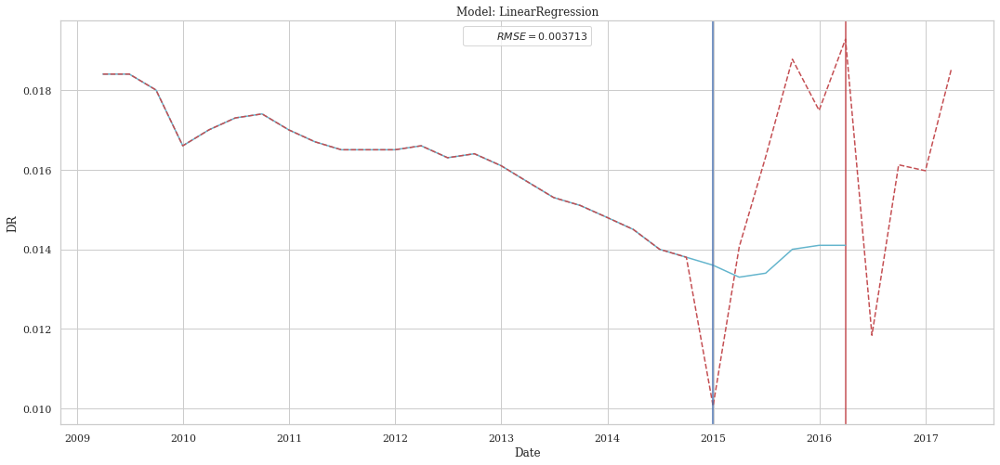

In [31]:

for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test=False,model=summary.index[i])
  y_validation_pred = y_pred(X_train,y_train,X_validation,y_test=False,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],y_validation=y_validation_pred,period=period,df_score=summary)


In [32]:
print(y_test[-1], y_test_pred[-1], y_validation_pred[-1])

0.0141 0.019277901112613873 0.018545018934475428


In [11]:
X_validation

,median_2,p5_2,p90_2,p5_3,p5_4,p25_4,p95_4,p25_5,p90_5,median_6,p5_6,p10_6,p25_6,p75_6,p90_6,p95_6,p5_8,p10_8,p75_8,p95_8
TRIMESTRE,,,,,,,,,,,,,,,,,,,,
2016-06-30,1.000000,1.0,1.000000,0.000000,0.0,1.0,1.000000,0.000000,0.056404,0.0,0.0,0.0,0.0,0.0,1.000000,0.854244,0.0,0.0,1.000000,0.000000
2016-09-30,0.538462,0.0,0.552239,0.833333,0.0,0.0,0.482759,0.145764,0.000000,0.0,0.0,0.0,0.0,0.0,0.876380,1.000000,0.0,0.0,0.752705,0.049558
2016-12-31,0.269231,0.5,0.417910,0.166667,0.0,0.0,0.362069,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.379987,0.683034
2017-03-31,0.000000,0.5,0.000000,1.000000,0.0,0.0,0.000000,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.110375,0.533210,0.0,0.0,0.000000,1.000000
